# Sliding Window Introgression Analysis

This notebook performs genome-wide sliding window analysis to map introgression across the genome.

## Steps:
1. Divide genome into sliding windows
2. Calculate D-statistics per window  
3. Create introgression maps
4. Identify introgressed regions


## 1. Imports & configuration

In [1]:
import os
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cyvcf2
from collections import defaultdict

# Use absolute path to config file
CONFIG_PATH = Path("/Users/divyadhole/Capstone-project/config.yaml")

try:
    with open(CONFIG_PATH, 'r') as f:
        config = yaml.safe_load(f)
    
    # Set up paths
    PROJECT_ROOT = CONFIG_PATH.parent
    OUTPUT_DIR = PROJECT_ROOT / config.get('output_dir', 'outputs')
    OUTPUT_DIR.mkdir(exist_ok=True, parents=True)
    
    # Load VCF file paths from config
    VCF_DIR = PROJECT_ROOT / config.get('vcf_dir', 'data/VCF_files')
    VCF_FILES = list(VCF_DIR.glob('*.vcf*'))  # Handles both .vcf and .vcf.gz
    
    print(f"Project root: {PROJECT_ROOT}")
    print(f"Output directory: {OUTPUT_DIR}")
    print(f"Found {len(VCF_FILES)} VCF files in {VCF_DIR}")

except FileNotFoundError:
    print(f"❌ Error: Config file not found at {CONFIG_PATH}")
    print("Please ensure the config file exists at the specified location.")
    raise
except yaml.YAMLError as e:
    print(f"❌ Error parsing YAML config: {e}")
    raise
except Exception as e:
    print(f"❌ An unexpected error occurred: {e}")
    raise

Project root: /Users/divyadhole/Capstone-project
Output directory: /Users/divyadhole/Capstone-project/outputs
Found 1 VCF files in /Users/divyadhole/Capstone-project/data/VCF_files


### 2. Step 1 – window setup & metadata loading

In [2]:
# Define all required directories
PROJECT_ROOT = Path("/Users/divyadhole/Capstone-project")
CONFIG_PATH = PROJECT_ROOT / "config.yaml"

# Load config
with open(CONFIG_PATH, 'r') as f:
    config = yaml.safe_load(f)

# Set up directories with error handling
try:
    # Get directories from config with fallbacks
    DATA_DIR = PROJECT_ROOT / config.get('data_dir', 'data')
    OUTPUT_DIR = PROJECT_ROOT / config.get('output_dir', 'outputs')
    VCF_DIR = PROJECT_ROOT / config.get('vcf_dir', 'data/VCF_files')
    
    # Ensure directories exist
    for directory in [DATA_DIR, OUTPUT_DIR, VCF_DIR]:
        directory.mkdir(parents=True, exist_ok=True)
    
    # Set up metadata path with fallback
    metadata_path = Path(config.get('metadata_file', DATA_DIR / "metadata.xlsx"))
    if not metadata_path.is_absolute():
        metadata_path = (PROJECT_ROOT / metadata_path).resolve()
    
    print(f"Project root: {PROJECT_ROOT}")
    print(f"Data directory: {DATA_DIR}")
    print(f"Output directory: {OUTPUT_DIR}")
    print(f"VCF directory: {VCF_DIR}")
    print(f"Metadata file: {metadata_path}")

except Exception as e:
    print(f"Error setting up directories: {e}")
    raise

# Now you can use these variables in your code
filtered_vcf = OUTPUT_DIR / "filtered_samples.vcf.gz"
abba_results_path = OUTPUT_DIR / "abba_baba_results.csv"

# Verify metadata file exists
if not metadata_path.exists():
    print(f"\n⚠️  Warning: Metadata file not found at {metadata_path}")
    print("Please ensure the metadata file exists or update the path in config.yaml")
    print("You can specify the metadata file in config.yaml like this:")
    print("metadata_file: data/your_metadata_file.xlsx")
    
    # Create a minimal metadata file if needed
    create_metadata = input("Would you like to create a template metadata file? (y/n): ").lower()
    if create_metadata == 'y':
        try:
            import pandas as pd
            sample_metadata = pd.DataFrame({
                'sample_id': ['sample1', 'sample2', 'sample3'],
                'species': ['species1', 'species2', 'species3'],
                'population': ['pop1', 'pop2', 'pop3']
            })
            metadata_path.parent.mkdir(parents=True, exist_ok=True)
            sample_metadata.to_excel(metadata_path, index=False)
            print(f"✅ Created template metadata file at {metadata_path}")
            print("Please edit this file with your actual sample information.")
        except Exception as e:
            print(f"❌ Could not create metadata file: {e}")

Project root: /Users/divyadhole/Capstone-project
Data directory: /Users/divyadhole/Capstone-project/data
Output directory: /Users/divyadhole/Capstone-project/outputs
VCF directory: /Users/divyadhole/Capstone-project/data/VCF_files
Metadata file: /Users/divyadhole/Capstone-project/data/metadata.xlsx


In [3]:
def get_genotype(gt_array):
    if gt_array is None or len(gt_array) < 2:
        return None
    a1, a2 = gt_array[0], gt_array[1]
    if a1 == -1 or a2 == -1:
        return None
    return (int(a1), int(a2))

def get_chromosome_lengths(vcf_file):
    vcf = cyvcf2.VCF(str(vcf_file))
    chrom_lengths = {}

    header_contigs = getattr(vcf, 'seqnames', []) or []
    header_lengths = getattr(vcf, 'seqlens', []) or []
    if header_contigs and header_lengths and len(header_contigs) == len(header_lengths):
        for chrom, length in zip(header_contigs, header_lengths):
            if length and length > 0:
                chrom_lengths[chrom] = int(length)
        if chrom_lengths:
            print(f"Loaded {len(chrom_lengths)} contig lengths from VCF header")

    if not chrom_lengths:
        print("VCF header lacked contig lengths. Scanning variants to infer lengths...")
        last_pos = {}
        for variant in vcf:
            chrom = variant.CHROM
            pos = variant.POS
            if chrom not in chrom_lengths:
                chrom_lengths[chrom] = 0
                last_pos[chrom] = 0
            if pos > last_pos[chrom]:
                last_pos[chrom] = pos
                chrom_lengths[chrom] = pos

    vcf.close()
    if not chrom_lengths:
        print("Warning: Could not infer any chromosome lengths from the filtered VCF.")
    return chrom_lengths

def create_sliding_windows(chrom_lengths, window_size, step_size):
    windows = []
    for chrom, length in chrom_lengths.items():
        if not length or length <= 0:
            continue
        for start in range(1, length + 1, step_size):
            end = min(start + window_size - 1, length)
            windows.append({
                'chrom': chrom,
                'start': start,
                'end': end,
                'midpoint': (start + end) // 2
            })
    return pd.DataFrame(windows)

filtered_vcf = OUTPUT_DIR / "filtered_samples.vcf.gz"
abba_results_path = OUTPUT_DIR / "abba_baba_results.csv"
metadata_path = Path(config.get('metadata_file', DATA_DIR / "metadata.xlsx"))
if not metadata_path.is_absolute():
    metadata_path = (Path.cwd() / metadata_path).resolve()

if abba_results_path.exists():
    try:
        abba_results = pd.read_csv(abba_results_path)
    except pd.errors.EmptyDataError:
        print("Warning: abba_baba_results.csv is empty")
        abba_results = pd.DataFrame()
else:
    print("Warning: abba_baba_results.csv not found. Run Notebook 05 if needed.")
    abba_results = pd.DataFrame()

sample_species_map = {}
metadata_df = pd.DataFrame()
if metadata_path.exists():
    metadata_df = pd.read_excel(metadata_path)
    sample_cols = [c for c in metadata_df.columns if 'sample' in c.lower() or 'id' in c.lower()]
    species_cols = [c for c in metadata_df.columns if 'species' in c.lower() or 'taxon' in c.lower()]
    if sample_cols and species_cols:
        for _, row in metadata_df.iterrows():
            sample_species_map[str(row[sample_cols[0]])] = str(row[species_cols[0]])
else:
    print(f"Warning: metadata file not found at {metadata_path}")

vcf_sample_names = set()
if filtered_vcf.exists():
    vcf_reader = cyvcf2.VCF(str(filtered_vcf))
    vcf_sample_names = set(vcf_reader.samples)
    vcf_reader.close()
    print(f"Samples in filtered VCF: {len(vcf_sample_names)}")
else:
    print("Filtered VCF not found. Run Notebook 05 first.")

species_samples = defaultdict(list)
for sample, species in sample_species_map.items():
    if not vcf_sample_names or sample in vcf_sample_names:
        species_samples[species].append(sample)

if species_samples:
    species_counts = {sp: len(samps) for sp, samps in species_samples.items()}
    print(f"Species represented in VCF: {species_counts}")
else:
    print("Warning: No overlapping samples between metadata and VCF.")

window_size = config.get('abba_baba', {}).get('window_size', 100000)
step_size = config.get('abba_baba', {}).get('step_size', 50000)

windows_df = None
chrom_lengths = {}
if filtered_vcf.exists():
    chrom_lengths = get_chromosome_lengths(filtered_vcf)
    windows_df = create_sliding_windows(chrom_lengths, window_size, step_size)
    if windows_df is not None and len(windows_df) > 0:
        print(f"\nCreated {len(windows_df)} sliding windows")
        print(f"Window size: {window_size}bp, Step size: {step_size}bp")
        print(f"Chromosomes: {list(chrom_lengths.keys())[:10]}...")
    else:
        print("No windows generated. Check that your filtered VCF has contig lengths in the header or variants present.")

Samples in filtered VCF: 4
Species represented in VCF: {'entellus': 1, 'geei': 1, 'phayrei': 1, 'pileatus': 1}
Loaded 3256 contig lengths from VCF header



Created 62966 sliding windows
Window size: 100000bp, Step size: 50000bp
Chromosomes: ['CM017351.1', 'CM017352.1', 'CM017353.1', 'CM017354.1', 'CM017355.1', 'CM017356.1', 'CM017357.1', 'CM017358.1', 'CM017359.1', 'CM017360.1']...


### 3. Step 2 – window-level D function (compatible with your cyvcf2 build)

In [4]:
def calculate_window_d_statistic(vcf_file, window, p1_samples, p2_samples, 
                                 p3_samples, outgroup_samples):
    """Calculate D-statistic for a specific window"""
    region = f"{window['chrom']}:{window['start']}-{window['end']}"
    vcf = cyvcf2.VCF(str(vcf_file))

    sample_names = vcf.samples
    p1_idx = [sample_names.index(s) for s in p1_samples if s in sample_names]
    p2_idx = [sample_names.index(s) for s in p2_samples if s in sample_names]
    p3_idx = [sample_names.index(s) for s in p3_samples if s in sample_names]
    out_idx = [sample_names.index(s) for s in outgroup_samples if s in sample_names]

    if not all([p1_idx, p2_idx, p3_idx, out_idx]):
        vcf.close()
        return np.nan, np.nan, 0, 0, 0

    abba_count = 0
    baba_count = 0
    sites_used = 0

    for variant in vcf(region):
        if len(variant.ALT) != 1:  # Skip multiallelic
            continue

        p1_gts = [get_genotype(variant.genotypes[i]) for i in p1_idx]
        p2_gts = [get_genotype(variant.genotypes[i]) for i in p2_idx]
        p3_gts = [get_genotype(variant.genotypes[i]) for i in p3_idx]
        out_gts = [get_genotype(variant.genotypes[i]) for i in out_idx]

        if None in p1_gts + p2_gts + p3_gts + out_gts:
            continue

        def get_major_allele(gts):
            alleles = [gt[0] for gt in gts] + [gt[1] for gt in gts]
            if not alleles:
                return None
            return max(set(alleles), key=alleles.count)

        p1_allele = get_major_allele(p1_gts)
        p2_allele = get_major_allele(p2_gts)
        p3_allele = get_major_allele(p3_gts)
        out_allele = get_major_allele(out_gts)

        if any(a is None for a in [p1_allele, p2_allele, p3_allele, out_allele]):
            continue
        if out_allele not in [0, 1]:
            continue

        ancestral = out_allele
        derived = 1 - ancestral

        sites_used += 1
        if p1_allele == ancestral and p2_allele == derived and p3_allele == derived:
            abba_count += 1
        if p1_allele == derived and p2_allele == ancestral and p3_allele == derived:
            baba_count += 1

    vcf.close()

    if abba_count + baba_count == 0:
        return np.nan, np.nan, sites_used, abba_count, baba_count

    d = (abba_count - baba_count) / (abba_count + baba_count)
    n = abba_count + baba_count
    se = np.sqrt((1 - d**2) / n) if n > 0 else np.nan
    z = d / se if se > 0 else np.nan

    return d, z, sites_used, abba_count, baba_count

print("Window D-statistic calculation function defined.")

Window D-statistic calculation function defined.


### 4. Step 3 – run sliding-window analysis

In [5]:
def resolve_outgroup_species(combo_entry, default_outgroup, species_counts):
    if combo_entry.get('outgroup'):
        return combo_entry['outgroup']
    if default_outgroup:
        return default_outgroup
    excluded = {combo_entry['P1'], combo_entry['P2'], combo_entry['P3']}
    candidates = {sp: count for sp, count in species_counts.items() if sp not in excluded}
    if candidates:
        return max(candidates, key=candidates.get)
    return None

def run_sliding_window_analysis(filtered_vcf, windows_df, species_samples, 
                                 species_counts, abba_cfg, abba_results):
    if windows_df is None or windows_df.empty:
        print("No windows defined. Cannot run sliding window analysis.")
        return pd.DataFrame()
    if not species_samples:
        print("No species/sample mapping available. Cannot run analysis.")
        return pd.DataFrame()

    min_sites = abba_cfg.get('min_sites', 10)
    z_threshold = abba_cfg.get('z_threshold', 2.0)
    sliding_tests_cfg = abba_cfg.get('sliding_tests', [])
    default_outgroup = abba_cfg.get('outgroup_species')

    if sliding_tests_cfg:
        combos = sliding_tests_cfg
        print(f"Using {len(combos)} user-defined sliding window tests from config.")
    elif not abba_results.empty and {'P1', 'P2', 'P3'}.issubset(abba_results.columns):
        combos = (abba_results[['P1', 'P2', 'P3']]
                  .drop_duplicates()
                  .to_dict(orient='records'))
        print(f"Derived {len(combos)} unique trio combinations from ABBA-BABA results.")
    else:
        print("No sliding window test definitions found. Update config['abba_baba']['sliding_tests'] or run Notebook 05 to seed combos.")
        return pd.DataFrame()

    results = []
    total_windows = len(windows_df)

    for combo in combos:
        missing_keys = {'P1', 'P2', 'P3'} - combo.keys()
        if missing_keys:
            print(f"Skipping combo missing keys {missing_keys}: {combo}")
            continue
        outgroup_species = resolve_outgroup_species(combo, default_outgroup, species_counts)
        if not outgroup_species:
            print(f"Skipping combo (no outgroup resolved): {combo}")
            continue

        p1_samples = species_samples.get(combo['P1'], [])
        p2_samples = species_samples.get(combo['P2'], [])
        p3_samples = species_samples.get(combo['P3'], [])
        out_samples = species_samples.get(outgroup_species, [])

        if not all([p1_samples, p2_samples, p3_samples, out_samples]):
            print(f"Skipping combo due to missing samples: {combo} with outgroup {outgroup_species}")
            continue

        print(f"\nRunning sliding window test for (({combo['P1']}, {combo['P2']}), {combo['P3']}) with outgroup {outgroup_species}")
        for idx, window in windows_df.iterrows():
            if (idx + 1) % 500 == 0:
                print(f"  Processed {idx + 1}/{total_windows} windows for current combo...")
            d, z, sites_used, abba_ct, baba_ct = calculate_window_d_statistic(
                filtered_vcf,
                window,
                p1_samples,
                p2_samples,
                p3_samples,
                out_samples
            )
            results.append({
                'chrom': window['chrom'],
                'start': window['start'],
                'end': window['end'],
                'midpoint': window['midpoint'],
                'window_size': window['end'] - window['start'] + 1,
                'P1': combo['P1'],
                'P2': combo['P2'],
                'P3': combo['P3'],
                'outgroup': outgroup_species,
                'D': d,
                'Z': z,
                'sites_used': sites_used,
                'ABBA': abba_ct,
                'BABA': baba_ct,
                'passes_qc': (not np.isnan(z)) and (abs(z) >= z_threshold) and (sites_used >= min_sites)
            })

    results_df = pd.DataFrame(results)
    if results_df.empty:
        print("No sliding window results generated.")
        return results_df

    results_df['abs_D'] = results_df['D'].abs()
    results_df['abs_Z'] = results_df['Z'].abs()

    output_path = OUTPUT_DIR / "sliding_window_results.csv"
    results_df.to_csv(output_path, index=False)
    print(f"\nSaved sliding window results to {output_path}")

    qc_pass = results_df['passes_qc'].sum()
    print(f"Windows passing QC (|Z| >= {z_threshold}, sites >= {min_sites}): {qc_pass}/{len(results_df)}")
    return results_df

sliding_results_df = pd.DataFrame()

if not filtered_vcf.exists():
    print("Cannot perform sliding window analysis. Filtered VCF not found.")
elif windows_df is None or windows_df.empty:
    print("Cannot perform sliding window analysis. No windows defined.")
else:
    sliding_results_df = run_sliding_window_analysis(
        filtered_vcf,
        windows_df,
        species_samples,
        species_counts if species_samples else {},
        config.get('abba_baba', {}),
        abba_results
    )

Derived 3 unique trio combinations from ABBA-BABA results.

Running sliding window test for ((geei, phayrei), pileatus) with outgroup entellus


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:50001-150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:100001-200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:150001-250000
  for variant in vcf(region):
/var/folders/qg/_v_tlx

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:1150001-1250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:1200001-1300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:1250001-1350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:1300001-1400000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:2500001-2600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:2550001-2650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:2600001-2700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:2650001-2750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:3750001-3850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:3800001-3900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:3850001-3950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:3900001-4000000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:5000001-5100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:5050001-5150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:5100001-5200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:5150001-5250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:6450001-6550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:6500001-6600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:6550001-6650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:6600001-6700000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:7400001-7500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:7450001-7550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:7500001-7600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:7550001-7650000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:8600001-8700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:8650001-8750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:8700001-8800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:8750001-8850000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:9650001-9750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:9700001-9800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:9750001-9850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:9800001-9900000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:11000001-11100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:11050001-11150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:11100001-11200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:11150001-11250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:12350001-12450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:12400001-12500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:12450001-12550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:12500001-12600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:13700001-13800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:13750001-13850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:13800001-13900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:13850001-13950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:14950001-15050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:15000001-15100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:15050001-15150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:15100001-15200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:16250001-16350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:16300001-16400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:16350001-16450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:16400001-16500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:17550001-17650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:17600001-17700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:17650001-17750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:17700001-17800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:18850001-18950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:18900001-19000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:18950001-19050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:19000001-19100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:20200001-20300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:20250001-20350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:20300001-20400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:20350001-20450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:21500001-21600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:21550001-21650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:21600001-21700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:21650001-21750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:22400001-22500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:22450001-22550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:22500001-22600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:22550001-22650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:23700001-23800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:23750001-23850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:23800001-23900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:23850001-23950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:24600001-24700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:24650001-24750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:24700001-24800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:24750001-24850000
  for variant in vcf(region):


  Processed 500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:25350001-25450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:25400001-25500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:25450001-25550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:25500001-25600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:26850001-26950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:26900001-27000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:26950001-27050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:27000001-27100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:28400001-28500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:28450001-28550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:28500001-28600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:28550001-28650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:29550001-29650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:29600001-29700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:29650001-29750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:29700001-29800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:31600001-31700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:31650001-31750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:31700001-31800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:31750001-31850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:33100001-33200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:33150001-33250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:33200001-33300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:33250001-33350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:34650001-34750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:34700001-34800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:34750001-34850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:34800001-34900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:36550001-36650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:36600001-36700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:36650001-36750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:36700001-36800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:38150001-38250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:38200001-38300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:38250001-38350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:38300001-38400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:39850001-39950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:39900001-40000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:39950001-40050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:40000001-40100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:41400001-41500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:41450001-41550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:41500001-41600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:41550001-41650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:43250001-43350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:43300001-43400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:43350001-43450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:43400001-43500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:44850001-44950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:44900001-45000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:44950001-45050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:45000001-45100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:46350001-46450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:46400001-46500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:46450001-46550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:46500001-46600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:48300001-48400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:48350001-48450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:48400001-48500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:48450001-48550000
  for variant in vcf(region):


  Processed 1000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:50200001-50300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:50250001-50350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:50300001-50400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:50350001-50450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:51150001-51250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:51200001-51300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:51250001-51350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:51300001-51400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:52650001-52750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:52700001-52800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:52750001-52850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:52800001-52900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:53850001-53950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:53900001-54000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:53950001-54050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:54000001-54100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:55600001-55700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:55650001-55750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:55700001-55800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:55750001-55850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:56750001-56850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:56800001-56900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:56850001-56950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:56900001-57000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:58400001-58500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:58450001-58550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:58500001-58600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:58550001-58650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:60200001-60300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:60250001-60350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:60300001-60400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:60350001-60450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:61650001-61750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:61700001-61800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:61750001-61850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:61800001-61900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:63050001-63150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:63100001-63200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:63150001-63250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:63200001-63300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:64700001-64800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:64750001-64850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:64800001-64900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:64850001-64950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:66000001-66100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:66050001-66150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:66100001-66200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:66150001-66250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:67550001-67650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:67600001-67700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:67650001-67750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:67700001-67800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:68650001-68750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:68700001-68800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:68750001-68850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:68800001-68900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:70200001-70300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:70250001-70350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:70300001-70400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:70350001-70450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:71400001-71500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:71450001-71550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:71500001-71600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:71550001-71650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:72900001-73000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:72950001-73050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:73000001-73100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:73050001-73150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:74500001-74600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:74550001-74650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:74600001-74700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:74650001-74750000
  for variant in vcf(region):


  Processed 1500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:76000001-76100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:76050001-76150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:76100001-76200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:76150001-76250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:76950001-77050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:77000001-77100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:77050001-77150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:77100001-77200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:78450001-78550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:78500001-78600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:78550001-78650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:78600001-78700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:80100001-80200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:80150001-80250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:80200001-80300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:80250001-80350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:81550001-81650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:81600001-81700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:81650001-81750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:81700001-81800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:82900001-83000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:82950001-83050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:83000001-83100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:83050001-83150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:84350001-84450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:84400001-84500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:84450001-84550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:84500001-84600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:85850001-85950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:85900001-86000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:85950001-86050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:86000001-86100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:87400001-87500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:87450001-87550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:87500001-87600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:87550001-87650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:88900001-89000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:88950001-89050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:89000001-89100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:89050001-89150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:90400001-90500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:90450001-90550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:90500001-90600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:90550001-90650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:91900001-92000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:91950001-92050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:92000001-92100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:92050001-92150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:93250001-93350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:93300001-93400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:93350001-93450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:93400001-93500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:94650001-94750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:94700001-94800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:94750001-94850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:94800001-94900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:95500001-95600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:95550001-95650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:95600001-95700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:95650001-95750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:97050001-97150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:97100001-97200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:97150001-97250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:97200001-97300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:98550001-98650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:98600001-98700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:98650001-98750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:98700001-98800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:99650001-99750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:99700001-99800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:99750001-99850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:99800001-99900000
  for variant in vcf(region):


  Processed 2000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:101100001-101200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:101150001-101250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:101200001-101300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:101250001-101350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:102350001-102450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:102400001-102500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:102450001-102550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:102500001-102600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:103850001-103950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:103900001-104000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:103950001-104050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:104000001-104100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:105350001-105450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:105400001-105500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:105450001-105550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:105500001-105600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:106800001-106900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:106850001-106950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:106900001-107000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:106950001-107050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:108250001-108350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:108300001-108400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:108350001-108450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:108400001-108500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:109650001-109750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:109700001-109800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:109750001-109850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:109800001-109900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:110850001-110950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:110900001-111000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:110950001-111050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:111000001-111100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:112300001-112400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:112350001-112450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:112400001-112500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:112450001-112550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:113450001-113550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:113500001-113600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:113550001-113650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:113600001-113700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:114150001-114250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:114200001-114300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:114250001-114350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:114300001-114400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:115350001-115450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:115400001-115500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:115450001-115550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:115500001-115600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:116550001-116650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:116600001-116700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:116650001-116750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:116700001-116800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:117450001-117550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:117500001-117600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:117550001-117650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:117600001-117700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:118550001-118650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:118600001-118700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:118650001-118750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:118700001-118800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:119450001-119550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:119500001-119600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:119550001-119650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:119600001-119700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:120650001-120750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:120700001-120800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:120750001-120850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:120800001-120900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:121800001-121900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:121850001-121950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:121900001-122000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:121950001-122050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:123150001-123250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:123200001-123300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:123250001-123350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:123300001-123400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:124400001-124500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:124450001-124550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:124500001-124600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:124550001-124650000
  for variant in vcf(r

  Processed 2500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:125600001-125700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:125650001-125750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:125700001-125800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:125750001-125850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:126550001-126650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:126600001-126700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:126650001-126750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:126700001-126800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:127800001-127900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:127850001-127950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:127900001-128000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:127950001-128050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:128800001-128900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:128850001-128950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:128900001-129000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:128950001-129050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:129900001-130000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:129950001-130050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:130000001-130100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:130050001-130150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:131150001-131250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:131200001-131300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:131250001-131350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:131300001-131400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:132500001-132600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:132550001-132650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:132600001-132700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:132650001-132750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:134000001-134100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:134050001-134150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:134100001-134200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:134150001-134250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:135100001-135200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:135150001-135250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:135200001-135300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:135250001-135350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:136450001-136550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:136500001-136600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:136550001-136650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:136600001-136700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:137950001-138050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:138000001-138100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:138050001-138150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:138100001-138200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:139050001-139150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:139100001-139200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:139150001-139250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:139200001-139300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:140400001-140500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:140450001-140550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:140500001-140600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:140550001-140650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:141800001-141900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:141850001-141950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:141900001-142000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:141950001-142050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:142900001-143000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:142950001-143050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:143000001-143100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:143050001-143150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:144350001-144450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:144400001-144500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:144450001-144550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:144500001-144600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:145600001-145700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:145650001-145750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:145700001-145800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:145750001-145850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:146750001-146850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:146800001-146900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:146850001-146950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:146900001-147000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:148200001-148300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:148250001-148350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:148300001-148400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:148350001-148450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:149550001-149650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:149600001-149700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:149650001-149750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:149700001-149800000
  for variant in vcf(r

  Processed 3000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:150750001-150850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:150800001-150900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:150850001-150950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:150900001-151000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:151750001-151850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:151800001-151900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:151850001-151950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:151900001-152000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:153250001-153350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:153300001-153400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:153350001-153450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:153400001-153500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:154700001-154800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:154750001-154850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:154800001-154900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:154850001-154950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:156200001-156300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:156250001-156350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:156300001-156400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:156350001-156450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:157600001-157700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:157650001-157750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:157700001-157800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:157750001-157850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:159050001-159150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:159100001-159200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:159150001-159250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:159200001-159300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:160150001-160250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:160200001-160300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:160250001-160350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:160300001-160400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:161400001-161500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:161450001-161550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:161500001-161600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:161550001-161650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:162800001-162900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:162850001-162950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:162900001-163000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:162950001-163050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:163750001-163850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:163800001-163900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:163850001-163950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:163900001-164000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:165000001-165100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:165050001-165150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:165100001-165200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:165150001-165250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:166200001-166300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:166250001-166350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:166300001-166400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:166350001-166450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:167700001-167800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:167750001-167850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:167800001-167900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:167850001-167950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:168850001-168950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:168900001-169000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:168950001-169050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:169000001-169100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:170250001-170350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:170300001-170400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:170350001-170450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:170400001-170500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:171400001-171500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:171450001-171550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:171500001-171600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:171550001-171650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:172950001-173050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:173000001-173100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:173050001-173150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:173100001-173200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:174250001-174350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:174300001-174400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:174350001-174450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:174400001-174500000
  for variant in vcf(r

  Processed 3500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:175500001-175600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:175550001-175650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:175600001-175700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:175650001-175750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:177100001-177200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:177150001-177250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:177200001-177300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:177250001-177350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:178500001-178600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:178550001-178650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:178600001-178700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:178650001-178750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:180100001-180200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:180150001-180250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:180200001-180300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:180250001-180350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:181650001-181750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:181700001-181800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:181750001-181850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:181800001-181900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:182750001-182850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:182800001-182900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:182850001-182950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:182900001-183000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:184000001-184100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:184050001-184150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:184100001-184200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:184150001-184250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:185550001-185650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:185600001-185700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:185650001-185750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:185700001-185800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:186700001-186800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:186750001-186850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:186800001-186900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:186850001-186950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:188250001-188350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:188300001-188400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:188350001-188450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:188400001-188500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:189800001-189900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:189850001-189950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:189900001-190000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:189950001-190050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:191400001-191500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:191450001-191550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:191500001-191600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:191550001-191650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:192650001-192750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:192700001-192800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:192750001-192850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:192800001-192900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:194200001-194300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:194250001-194350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:194300001-194400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:194350001-194450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:195150001-195250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:195200001-195300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:195250001-195350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:195300001-195400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:196400001-196500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:196450001-196550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:196500001-196600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:196550001-196650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:198000001-198100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:198050001-198150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:198100001-198200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:198150001-198250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:199250001-199350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:199300001-199400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:199350001-199450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:199400001-199500000
  for variant in vcf(r

  Processed 4000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:200800001-200900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:200850001-200950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:200900001-201000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:200950001-201050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:202250001-202350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:202300001-202400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:202350001-202450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:202400001-202500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:203750001-203850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:203800001-203900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:203850001-203950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:203900001-204000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:205300001-205400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:205350001-205450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:205400001-205500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:205450001-205550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017351.1:206550001-206558726
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:50001-150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:100001-200000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:1500001-1600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:1550001-1650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:1600001-1700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:1650001-1750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:2750001-2850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:2800001-2900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:2850001-2950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:2900001-3000000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:4300001-4400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:4350001-4450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:4400001-4500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:4450001-4550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:5900001-6000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:5950001-6050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:6000001-6100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:6050001-6150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:7500001-7600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:7550001-7650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:7600001-7700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:7650001-7750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:9000001-9100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:9050001-9150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:9100001-9200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:9150001-9250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:10600001-10700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:10650001-10750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:10700001-10800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:10750001-10850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:12150001-12250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:12200001-12300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:12250001-12350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:12300001-12400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:13400001-13500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:13450001-13550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:13500001-13600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:13550001-13650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:14950001-15050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:15000001-15100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:15050001-15150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:15100001-15200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:16550001-16650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:16600001-16700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:16650001-16750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:16700001-16800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:17050001-17150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:17100001-17200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:17150001-17250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:17200001-17300000
  for variant in vcf(region):


  Processed 4500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:18500001-18600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:18550001-18650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:18600001-18700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:18650001-18750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:20100001-20200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:20150001-20250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:20200001-20300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:20250001-20350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:21700001-21800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:21750001-21850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:21800001-21900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:21850001-21950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:23000001-23100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:23050001-23150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:23100001-23200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:23150001-23250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:24650001-24750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:24700001-24800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:24750001-24850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:24800001-24900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:26250001-26350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:26300001-26400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:26350001-26450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:26400001-26500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:27500001-27600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:27550001-27650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:27600001-27700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:27650001-27750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:29100001-29200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:29150001-29250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:29200001-29300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:29250001-29350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:30500001-30600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:30550001-30650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:30600001-30700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:30650001-30750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:32150001-32250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:32200001-32300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:32250001-32350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:32300001-32400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:33450001-33550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:33500001-33600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:33550001-33650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:33600001-33700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:35050001-35150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:35100001-35200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:35150001-35250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:35200001-35300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:36650001-36750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:36700001-36800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:36750001-36850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:36800001-36900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:38250001-38350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:38300001-38400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:38350001-38450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:38400001-38500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:39300001-39400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:39350001-39450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:39400001-39500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:39450001-39550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:40800001-40900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:40850001-40950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:40900001-41000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:40950001-41050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:42200001-42300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:42250001-42350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:42300001-42400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:42350001-42450000
  for variant in vcf(region):


  Processed 5000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:43800001-43900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:43850001-43950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:43900001-44000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:43950001-44050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:45400001-45500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:45450001-45550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:45500001-45600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:45550001-45650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:47000001-47100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:47050001-47150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:47100001-47200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:47150001-47250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:48550001-48650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:48600001-48700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:48650001-48750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:48700001-48800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:50100001-50200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:50150001-50250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:50200001-50300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:50250001-50350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:51350001-51450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:51400001-51500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:51450001-51550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:51500001-51600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:52850001-52950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:52900001-53000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:52950001-53050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:53000001-53100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:54300001-54400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:54350001-54450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:54400001-54500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:54450001-54550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:55950001-56050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:56000001-56100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:56050001-56150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:56100001-56200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:57250001-57350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:57300001-57400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:57350001-57450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:57400001-57500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:58850001-58950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:58900001-59000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:58950001-59050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:59000001-59100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:60450001-60550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:60500001-60600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:60550001-60650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:60600001-60700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:61150001-61250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:61200001-61300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:61250001-61350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:61300001-61400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:62500001-62600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:62550001-62650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:62600001-62700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:62650001-62750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:64200001-64300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:64250001-64350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:64300001-64400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:64350001-64450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:65200001-65300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:65250001-65350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:65300001-65400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:65350001-65450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:66600001-66700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:66650001-66750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:66700001-66800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:66750001-66850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:67700001-67800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:67750001-67850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:67800001-67900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:67850001-67950000
  for variant in vcf(region):


  Processed 5500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:68850001-68950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:68900001-69000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:68950001-69050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:69000001-69100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:70500001-70600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:70550001-70650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:70600001-70700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:70650001-70750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:72150001-72250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:72200001-72300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:72250001-72350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:72300001-72400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:73750001-73850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:73800001-73900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:73850001-73950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:73900001-74000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:75400001-75500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:75450001-75550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:75500001-75600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:75550001-75650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:76900001-77000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:76950001-77050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:77000001-77100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:77050001-77150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:78450001-78550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:78500001-78600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:78550001-78650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:78600001-78700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:80050001-80150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:80100001-80200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:80150001-80250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:80200001-80300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:81300001-81400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:81350001-81450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:81400001-81500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:81450001-81550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:82900001-83000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:82950001-83050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:83000001-83100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:83050001-83150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:83400001-83500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:83450001-83550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:83500001-83600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:83550001-83650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:84850001-84950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:84900001-85000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:84950001-85050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:85000001-85100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:86400001-86500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:86450001-86550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:86500001-86600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:86550001-86650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:88050001-88150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:88100001-88200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:88150001-88250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:88200001-88300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:89350001-89450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:89400001-89500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:89450001-89550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:89500001-89600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:90900001-91000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:90950001-91050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:91000001-91100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:91050001-91150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:91950001-92050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:92000001-92100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:92050001-92150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:92100001-92200000
  for variant in vcf(region):


  Processed 6000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:93700001-93800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:93750001-93850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:93800001-93900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:93850001-93950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:95250001-95350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:95300001-95400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:95350001-95450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:95400001-95500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:96850001-96950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:96900001-97000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:96950001-97050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:97000001-97100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:98500001-98600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:98550001-98650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:98600001-98700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:98650001-98750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:99800001-99900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:99850001-99950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:99900001-100000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:99950001-100050000
  for variant in vcf(region)

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:101400001-101500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:101450001-101550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:101500001-101600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:101550001-101650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:103000001-103100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:103050001-103150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:103100001-103200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:103150001-103250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:104300001-104400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:104350001-104450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:104400001-104500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:104450001-104550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:105900001-106000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:105950001-106050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:106000001-106100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:106050001-106150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:107200001-107300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:107250001-107350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:107300001-107400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:107350001-107450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:108450001-108550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:108500001-108600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:108550001-108650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:108600001-108700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:110050001-110150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:110100001-110200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:110150001-110250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:110200001-110300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:111650001-111750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:111700001-111800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:111750001-111850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:111800001-111900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:112950001-113050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:113000001-113100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:113050001-113150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:113100001-113200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:114600001-114700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:114650001-114750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:114700001-114800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:114750001-114850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:116250001-116350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:116300001-116400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:116350001-116450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:116400001-116500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:117800001-117900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:117850001-117950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:117900001-118000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:117950001-118050000
  for variant in vcf(r

  Processed 6500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:119400001-119500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:119450001-119550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:119500001-119600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:119550001-119650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:120700001-120800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:120750001-120850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:120800001-120900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:120850001-120950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:122300001-122400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:122350001-122450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:122400001-122500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:122450001-122550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:123650001-123750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:123700001-123800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:123750001-123850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:123800001-123900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:125250001-125350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:125300001-125400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:125350001-125450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:125400001-125500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:126450001-126550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:126500001-126600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:126550001-126650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:126600001-126700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:128050001-128150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:128100001-128200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:128150001-128250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:128200001-128300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:129650001-129750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:129700001-129800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:129750001-129850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:129800001-129900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:130950001-131050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:131000001-131100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:131050001-131150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:131100001-131200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:132500001-132600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:132550001-132650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:132600001-132700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:132650001-132750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:133750001-133850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:133800001-133900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:133850001-133950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:133900001-134000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:135050001-135150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:135100001-135200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:135150001-135250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:135200001-135300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:136500001-136600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:136550001-136650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:136600001-136700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:136650001-136750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:138100001-138200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:138150001-138250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:138200001-138300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:138250001-138350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:139700001-139800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:139750001-139850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:139800001-139900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:139850001-139950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:141050001-141150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:141100001-141200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:141150001-141250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:141200001-141300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:142600001-142700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:142650001-142750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:142700001-142800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:142750001-142850000
  for variant in vcf(r

  Processed 7000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:143700001-143800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:143750001-143850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:143800001-143900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:143850001-143950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:145350001-145450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:145400001-145500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:145450001-145550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:145500001-145600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:146950001-147050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:147000001-147100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:147050001-147150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:147100001-147200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:148550001-148650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:148600001-148700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:148650001-148750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:148700001-148800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:150150001-150250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:150200001-150300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:150250001-150350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:150300001-150400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:151400001-151500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:151450001-151550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:151500001-151600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:151550001-151650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:153050001-153150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:153100001-153200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:153150001-153250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:153200001-153300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:154300001-154400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:154350001-154450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:154400001-154500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:154450001-154550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:155900001-156000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:155950001-156050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:156000001-156100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:156050001-156150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:157200001-157300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:157250001-157350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:157300001-157400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:157350001-157450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:158800001-158900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:158850001-158950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:158900001-159000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:158950001-159050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:160450001-160550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:160500001-160600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:160550001-160650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:160600001-160700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:161150001-161250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:161200001-161300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:161250001-161350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:161300001-161400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:162450001-162550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:162500001-162600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:162550001-162650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:162600001-162700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:164050001-164150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:164100001-164200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:164150001-164250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:164200001-164300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:165350001-165450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:165400001-165500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:165450001-165550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:165500001-165600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:167000001-167100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:167050001-167150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:167100001-167200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:167150001-167250000
  for variant in vcf(r

  Processed 7500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:168600001-168700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:168650001-168750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:168700001-168800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:168750001-168850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:170100001-170200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:170150001-170250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:170200001-170300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:170250001-170350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:171700001-171800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:171750001-171850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:171800001-171900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:171850001-171950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:173300001-173400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:173350001-173450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:173400001-173500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:173450001-173550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:174900001-175000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:174950001-175050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:175000001-175100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:175050001-175150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:176500001-176600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:176550001-176650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:176600001-176700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:176650001-176750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:178050001-178150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:178100001-178200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:178150001-178250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:178200001-178300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:179700001-179800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:179750001-179850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:179800001-179900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:179850001-179950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:180950001-181050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:181000001-181100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:181050001-181150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:181100001-181200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:182550001-182650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:182600001-182700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:182650001-182750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:182700001-182800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:184150001-184250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:184200001-184300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:184250001-184350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:184300001-184400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:185600001-185700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:185650001-185750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:185700001-185800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:185750001-185850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:187150001-187250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:187200001-187300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:187250001-187350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:187300001-187400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:188500001-188600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:188550001-188650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:188600001-188700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:188650001-188750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:189700001-189800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:189750001-189850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:189800001-189900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:189850001-189950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:191250001-191350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:191300001-191400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:191350001-191450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:191400001-191500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:192800001-192900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:192850001-192950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:192900001-193000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:192950001-193050000
  for variant in vcf(r

  Processed 8000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:194150001-194250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:194200001-194300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:194250001-194350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017352.1:194300001-194400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:300001-400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:350001-450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:400001-500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:450001-550000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:1600001-1700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:1650001-1750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:1700001-1800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:1750001-1850000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:3200001-3300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:3250001-3350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:3300001-3400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:3350001-3450000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:4800001-4900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:4850001-4950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:4900001-5000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:4950001-5050000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:6350001-6450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:6400001-6500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:6450001-6550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:6500001-6600000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:7950001-8050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:8000001-8100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:8050001-8150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:8100001-8200000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:9550001-9650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:9600001-9700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:9650001-9750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:9700001-9800000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:11150001-11250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:11200001-11300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:11250001-11350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:11300001-11400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:12750001-12850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:12800001-12900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:12850001-12950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:12900001-13000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:14000001-14100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:14050001-14150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:14100001-14200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:14150001-14250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:15300001-15400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:15350001-15450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:15400001-15500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:15450001-15550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:16900001-17000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:16950001-17050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:17000001-17100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:17050001-17150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:18500001-18600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:18550001-18650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:18600001-18700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:18650001-18750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:20050001-20150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:20100001-20200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:20150001-20250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:20200001-20300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:21400001-21500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:21450001-21550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:21500001-21600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:21550001-21650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:22550001-22650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:22600001-22700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:22650001-22750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:22700001-22800000
  for variant in vcf(region):


  Processed 8500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:24000001-24100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:24050001-24150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:24100001-24200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:24150001-24250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:25650001-25750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:25700001-25800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:25750001-25850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:25800001-25900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:26950001-27050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:27000001-27100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:27050001-27150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:27100001-27200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:28250001-28350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:28300001-28400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:28350001-28450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:28400001-28500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:29800001-29900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:29850001-29950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:29900001-30000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:29950001-30050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:31050001-31150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:31100001-31200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:31150001-31250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:31200001-31300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:32500001-32600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:32550001-32650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:32600001-32700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:32650001-32750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:33800001-33900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:33850001-33950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:33900001-34000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:33950001-34050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:35300001-35400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:35350001-35450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:35400001-35500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:35450001-35550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:36800001-36900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:36850001-36950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:36900001-37000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:36950001-37050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:37550001-37650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:37600001-37700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:37650001-37750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:37700001-37800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:39050001-39150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:39100001-39200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:39150001-39250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:39200001-39300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:40600001-40700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:40650001-40750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:40700001-40800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:40750001-40850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:41850001-41950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:41900001-42000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:41950001-42050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:42000001-42100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:43350001-43450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:43400001-43500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:43450001-43550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:43500001-43600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:44550001-44650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:44600001-44700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:44650001-44750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:44700001-44800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:46100001-46200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:46150001-46250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:46200001-46300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:46250001-46350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:47650001-47750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:47700001-47800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:47750001-47850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:47800001-47900000
  for variant in vcf(region):


  Processed 9000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:49050001-49150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:49100001-49200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:49150001-49250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:49200001-49300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:50100001-50200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:50150001-50250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:50200001-50300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:50250001-50350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:52150001-52250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:52200001-52300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:52250001-52350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:52300001-52400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:53850001-53950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:53900001-54000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:53950001-54050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:54000001-54100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:55750001-55850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:55800001-55900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:55850001-55950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:55900001-56000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:56950001-57050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:57000001-57100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:57050001-57150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:57100001-57200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:59050001-59150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:59100001-59200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:59150001-59250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:59200001-59300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:61000001-61100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:61050001-61150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:61100001-61200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:62700001-62800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:62750001-62850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:62800001-62900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:62850001-62950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:64400001-64500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:64450001-64550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:64500001-64600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:64550001-64650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:66000001-66100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:66050001-66150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:66100001-66200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:66150001-66250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:67900001-68000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:67950001-68050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:68000001-68100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:68050001-68150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:69500001-69600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:69550001-69650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:69600001-69700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:69650001-69750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:71550001-71650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:71600001-71700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:71650001-71750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:71700001-71800000
  for variant in vcf(region):


  Processed 9500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:73200001-73300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:73250001-73350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:73300001-73400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:74750001-74850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:74800001-74900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:74850001-74950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:74900001-75000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:76700001-76800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:76750001-76850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:76800001-76900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:76850001-76950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:78750001-78850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:78800001-78900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:78850001-78950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:78900001-79000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:80400001-80500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:80450001-80550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:80500001-80600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:80550001-80650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:82050001-82150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:82100001-82200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:82150001-82250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:82200001-82300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:84000001-84100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:84050001-84150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:84100001-84200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:84150001-84250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:85500001-85600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:85550001-85650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:85600001-85700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:85650001-85750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:87250001-87350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:87300001-87400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:87350001-87450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:87400001-87500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:89350001-89450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:89400001-89500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:89450001-89550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:89500001-89600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:90950001-91050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:91000001-91100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:91050001-91150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:91100001-91200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:92600001-92700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:92650001-92750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:92700001-92800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:92750001-92850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:94600001-94700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:94650001-94750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:94700001-94800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:94750001-94850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:96250001-96350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:96300001-96400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:96350001-96450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:96400001-96500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:97850001-97950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:97900001-98000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:97950001-98050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:98000001-98100000
  for variant in vcf(region):


  Processed 10000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:99900001-100000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:99950001-100050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:100000001-100100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:100050001-100150000
  for variant in vcf(reg

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:101600001-101700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:101650001-101750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:101700001-101800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:101750001-101850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:103250001-103350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:103300001-103400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:103350001-103450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:103400001-103500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:105200001-105300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:105250001-105350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:105300001-105400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:105350001-105450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:106850001-106950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:106900001-107000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:106950001-107050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:107000001-107100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:108850001-108950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:108900001-109000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:108950001-109050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:109000001-109100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:110500001-110600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:110550001-110650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:110600001-110700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:110650001-110750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:112250001-112350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:112300001-112400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:112350001-112450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:112400001-112500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:113900001-114000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:113950001-114050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:114000001-114100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:114050001-114150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:115850001-115950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:115900001-116000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:115950001-116050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:116000001-116100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:117450001-117550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:117500001-117600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:117550001-117650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:117600001-117700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:118650001-118750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:118700001-118800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:118750001-118850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:118800001-118900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:120300001-120400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:120350001-120450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:120400001-120500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:120450001-120550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:122150001-122250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:122200001-122300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:122250001-122350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:122300001-122400000
  for variant in vcf(r

  Processed 10500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:123750001-123850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:123800001-123900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:123850001-123950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:123900001-124000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:125550001-125650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:125600001-125700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:125650001-125750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:125700001-125800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:127150001-127250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:127200001-127300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:127250001-127350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:127300001-127400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:128800001-128900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:128850001-128950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:128900001-129000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:128950001-129050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:131000001-131100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:131050001-131150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:131100001-131200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:131150001-131250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:132600001-132700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:132650001-132750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:132700001-132800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:132750001-132850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:134250001-134350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:134300001-134400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:134350001-134450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:134400001-134500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:135950001-136050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:136000001-136100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:136050001-136150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:136100001-136200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:137550001-137650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:137600001-137700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:137650001-137750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:137700001-137800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:139050001-139150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:139100001-139200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:139150001-139250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:139200001-139300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:140750001-140850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:140800001-140900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:140850001-140950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:140900001-141000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:141850001-141950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:141900001-142000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:141950001-142050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:142000001-142100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:143550001-143650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:143600001-143700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:143650001-143750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:143700001-143800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:145250001-145350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:145300001-145400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:145350001-145450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:145400001-145500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:146950001-147050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:147000001-147100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:147050001-147150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:147100001-147200000
  for variant in vcf(r

  Processed 11000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:148600001-148700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:148650001-148750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:148700001-148800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:148750001-148850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:149750001-149850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:149800001-149900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:149850001-149950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:149900001-150000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:151550001-151650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:151600001-151700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:151650001-151750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:151700001-151800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:152850001-152950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:152900001-153000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:152950001-153050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:153000001-153100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:154550001-154650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:154600001-154700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:154650001-154750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:154700001-154800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:155950001-156050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:156000001-156100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:156050001-156150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:156100001-156200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:157600001-157700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:157650001-157750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:157700001-157800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:157750001-157850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:159250001-159350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:159300001-159400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:159350001-159450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:159400001-159500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:160600001-160700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:160650001-160750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:160700001-160800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:160750001-160850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:162250001-162350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:162300001-162400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:162350001-162450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:162400001-162500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:163650001-163750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:163700001-163800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:163750001-163850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:163800001-163900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:164950001-165050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165000001-165100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165050001-165150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165100001-165200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165800001-165900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165850001-165950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165900001-166000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:165950001-166050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:166900001-167000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:166950001-167050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:167000001-167100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:167050001-167150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:168750001-168850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:168800001-168900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:168850001-168950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:168900001-169000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:169550001-169650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:169600001-169700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:169650001-169750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:169700001-169800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:170900001-171000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:170950001-171050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:171000001-171100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:171050001-171150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:172200001-172300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:172250001-172350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:172300001-172400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:172350001-172450000
  for variant in vcf(r

  Processed 11500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:174100001-174200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:174150001-174250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:174200001-174300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:174250001-174350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:175300001-175400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:175350001-175450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:175400001-175500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:175450001-175550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:177050001-177150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:177100001-177200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:177150001-177250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:177200001-177300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:178700001-178800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:178750001-178850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:178800001-178900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:178850001-178950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:180050001-180150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:180100001-180200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:180150001-180250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:180200001-180300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:181400001-181500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:181450001-181550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:181500001-181600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:181550001-181650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:182850001-182950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:182900001-183000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:182950001-183050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:183000001-183100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:184450001-184550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:184500001-184600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:184550001-184650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017353.1:184600001-184700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:350001-450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:400001-500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:450001-550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:500001-600000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:1950001-2050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:2000001-2100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:2050001-2150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:2100001-2200000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:3750001-3850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:3800001-3900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:3850001-3950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:3900001-4000000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:5300001-5400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:5350001-5450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:5400001-5500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:5450001-5550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:6900001-7000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:6950001-7050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:7000001-7100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:7050001-7150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:8200001-8300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:8250001-8350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:8300001-8400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:8350001-8450000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:10050001-10150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:10100001-10200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:10150001-10250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:10200001-10300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:11650001-11750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:11700001-11800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:11750001-11850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:11800001-11900000
  for variant in vcf(region):


  Processed 12000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:13500001-13600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:13550001-13650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:13600001-13700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:13650001-13750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:15250001-15350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:15300001-15400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:15350001-15450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:15400001-15500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:16250001-16350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:16300001-16400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:16350001-16450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:16400001-16500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:17600001-17700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:17650001-17750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:17700001-17800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:17750001-17850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:19600001-19700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:19650001-19750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:19700001-19800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:19750001-19850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:20750001-20850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:20800001-20900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:20850001-20950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:20900001-21000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:22450001-22550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:22500001-22600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:22550001-22650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:22600001-22700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:24250001-24350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:24300001-24400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:24350001-24450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:24400001-24500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:25600001-25700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:25650001-25750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:25700001-25800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:25750001-25850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:27450001-27550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:27500001-27600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:27550001-27650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:27600001-27700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:28550001-28650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:28600001-28700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:28650001-28750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:28700001-28800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:30150001-30250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:30200001-30300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:30250001-30350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:30300001-30400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:31750001-31850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:31800001-31900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:31850001-31950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:31900001-32000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:33150001-33250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:33200001-33300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:33250001-33350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:33300001-33400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:34700001-34800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:34750001-34850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:34800001-34900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:34850001-34950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:36300001-36400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:36350001-36450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:36400001-36500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:36450001-36550000
  for variant in vcf(region):


  Processed 12500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:37700001-37800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:37750001-37850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:37800001-37900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:37850001-37950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:38800001-38900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:38850001-38950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:38900001-39000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:38950001-39050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:40500001-40600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:40550001-40650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:40600001-40700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:40650001-40750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:41750001-41850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:41850001-41950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:41900001-42000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:43450001-43550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:43500001-43600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:43550001-43650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:43600001-43700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:44600001-44700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:44650001-44750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:44700001-44800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:44750001-44850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:45900001-46000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:45950001-46050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:46000001-46100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:46050001-46150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:47150001-47250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:47200001-47300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:47250001-47350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:47300001-47400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:49050001-49150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:49100001-49200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:49150001-49250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:49200001-49300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:50300001-50400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:50350001-50450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:50400001-50500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:50450001-50550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:51800001-51900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:51850001-51950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:51900001-52000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:51950001-52050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:53750001-53850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:53800001-53900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:53850001-53950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:53900001-54000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:55250001-55350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:55300001-55400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:55350001-55450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:55400001-55500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:57100001-57200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:57150001-57250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:57200001-57300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:57250001-57350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:58750001-58850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:58800001-58900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:58850001-58950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:58900001-59000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:60700001-60800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:60750001-60850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:60800001-60900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:60850001-60950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:61150001-61250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:61200001-61300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:61250001-61350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:61300001-61400000
  for variant in vcf(region):


  Processed 13000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:62950001-63050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:63000001-63100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:63050001-63150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:63100001-63200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:65350001-65450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:65400001-65500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:65450001-65550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:65500001-65600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:66550001-66650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:66600001-66700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:66650001-66750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:66700001-66800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:67950001-68050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:68000001-68100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:68050001-68150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:68100001-68200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:69850001-69950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:69950001-70050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:70000001-70100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:71350001-71450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:71400001-71500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:71450001-71550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:71500001-71600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:73050001-73150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:73100001-73200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:73200001-73300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:74650001-74750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:74700001-74800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:74750001-74850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:74800001-74900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:76100001-76200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:76150001-76250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:76200001-76300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:76250001-76350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:76950001-77050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:77000001-77100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:77050001-77150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:77100001-77200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:77950001-78050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:78000001-78100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:78050001-78150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:78100001-78200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:79600001-79700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:79650001-79750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:79700001-79800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:79750001-79850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:80700001-80800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:80750001-80850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:80800001-80900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:80850001-80950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:82850001-82950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:82900001-83000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:82950001-83050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:83000001-83100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:84550001-84650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:84600001-84700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:84650001-84750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:84700001-84800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:86900001-87000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:86950001-87050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:87000001-87100000
  for variant in vcf(region):


  Processed 13500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:88600001-88700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:88650001-88750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:88700001-88800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:88750001-88850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:90350001-90450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:90400001-90500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:90450001-90550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:90500001-90600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:91900001-92000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:91950001-92050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:92000001-92100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:92050001-92150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:93450001-93550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:93500001-93600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:93550001-93650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:93600001-93700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:94900001-95000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:94950001-95050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:95000001-95100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:95050001-95150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:96350001-96450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:96400001-96500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:96450001-96550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:96500001-96600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:98150001-98250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:98200001-98300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:98250001-98350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:98300001-98400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:99600001-99700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:99650001-99750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:99700001-99800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:99750001-99850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:101450001-101550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:101500001-101600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:101550001-101650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:101600001-101700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:102750001-102850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:102800001-102900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:102850001-102950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:102900001-103000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:104000001-104100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:104050001-104150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:104100001-104200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:104150001-104250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:106300001-106400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:106350001-106450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:106400001-106500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:106450001-106550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:107950001-108050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:108000001-108100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:108050001-108150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:108100001-108200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:109450001-109550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:109500001-109600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:109550001-109650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:109600001-109700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:111250001-111350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:111300001-111400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:111350001-111450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:111400001-111500000
  for variant in vcf(r

  Processed 14000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:112450001-112550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:112500001-112600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:112550001-112650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:112600001-112700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:113600001-113700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:113650001-113750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:113700001-113800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:113750001-113850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:115350001-115450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:115400001-115500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:115450001-115550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:115500001-115600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:116550001-116650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:116600001-116700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:116650001-116750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:116700001-116800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:117700001-117800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:117750001-117850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:117800001-117900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:117850001-117950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:119300001-119400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:119350001-119450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:119400001-119500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:119450001-119550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:120950001-121050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:121000001-121100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:121050001-121150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:121100001-121200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:122200001-122300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:122250001-122350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:122300001-122400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:122350001-122450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:123700001-123800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:123750001-123850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:123800001-123900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:123850001-123950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:125050001-125150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:125100001-125200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:125150001-125250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:125200001-125300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:126250001-126350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:126300001-126400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:126350001-126450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:126400001-126500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:127650001-127750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:127700001-127800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:127750001-127850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:127800001-127900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:129100001-129200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:129150001-129250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:129200001-129300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:129250001-129350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:130600001-130700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:130650001-130750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:130700001-130800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:130750001-130850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:131850001-131950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:131900001-132000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:131950001-132050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:132000001-132100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:133200001-133300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:133250001-133350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:133300001-133400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:133350001-133450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:134600001-134700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:134650001-134750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:134700001-134800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:134750001-134850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:136000001-136100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:136050001-136150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:136100001-136200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:136150001-136250000
  for variant in vcf(r

  Processed 14500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:138050001-138150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:138100001-138200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:138150001-138250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:138200001-138300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:139200001-139300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:139250001-139350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:139300001-139400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:139350001-139450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:140300001-140400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:140350001-140450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:140400001-140500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:140450001-140550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:141750001-141850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:141800001-141900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:141850001-141950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:141900001-142000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:143350001-143450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:143400001-143500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:143450001-143550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:143500001-143600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:144600001-144700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:144650001-144750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:144700001-144800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:144750001-144850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:146500001-146600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:146550001-146650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:146600001-146700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:146650001-146750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:147900001-148000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:147950001-148050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:148000001-148100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:148050001-148150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:149300001-149400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:149350001-149450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:149400001-149500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:149450001-149550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:150900001-151000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:150950001-151050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:151000001-151100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:151050001-151150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:151650001-151750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:151700001-151800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:151750001-151850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:151800001-151900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:153350001-153450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:153400001-153500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:153450001-153550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:153500001-153600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:155100001-155200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:155150001-155250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:155200001-155300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:155250001-155350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:156600001-156700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:156650001-156750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:156700001-156800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:156750001-156850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:158450001-158550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:158500001-158600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:158550001-158650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:158600001-158700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:160050001-160150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:160100001-160200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:160150001-160250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:160200001-160300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:161950001-162050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:162000001-162100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:162050001-162150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:162100001-162200000
  for variant in vcf(r

  Processed 15000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:163400001-163500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:163450001-163550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:163500001-163600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:163550001-163650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:165150001-165250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:165200001-165300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:165250001-165350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:165300001-165400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:167150001-167250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:167200001-167300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:167250001-167350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:167300001-167400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:168650001-168750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:168700001-168800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:168750001-168850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:168800001-168900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:170450001-170550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:170500001-170600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:170550001-170650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:170600001-170700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:172050001-172150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:172100001-172200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:172150001-172250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:172200001-172300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:173550001-173650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:173600001-173700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:173650001-173750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:173700001-173800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:175350001-175450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:175400001-175500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:175450001-175550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:175500001-175600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:176750001-176850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:176800001-176900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:176850001-176950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:176900001-177000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:178500001-178600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:178550001-178650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:178600001-178700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017354.1:178650001-178750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:1100001-1200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:1150001-1250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:1200001-1300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:1250001-1350000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:2900001-3000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:2950001-3050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:3000001-3100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:3050001-3150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:4450001-4550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:4500001-4600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:4550001-4650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:4600001-4700000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:6300001-6400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:6350001-6450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:6400001-6500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:6450001-6550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:7850001-7950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:7900001-8000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:7950001-8050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:8000001-8100000
  for variant in vcf(region):
/var/fol

  Processed 15500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:9750001-9850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:9800001-9900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:9850001-9950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:9900001-10000000
  for variant in vcf(region):
/var/fo

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:11150001-11250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:11200001-11300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:11250001-11350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:11300001-11400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:12950001-13050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:13000001-13100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:13050001-13150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:13100001-13200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:14650001-14750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:14700001-14800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:14750001-14850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:14800001-14900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:16200001-16300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:16250001-16350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:16300001-16400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:16350001-16450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:17800001-17900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:17850001-17950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:17900001-18000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:17950001-18050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:19350001-19450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:19400001-19500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:19450001-19550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:19500001-19600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:21150001-21250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:21200001-21300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:21250001-21350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:21300001-21400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:23000001-23100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:23050001-23150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:23100001-23200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:23150001-23250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:24500001-24600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:24550001-24650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:24600001-24700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:24650001-24750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:26400001-26500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:26450001-26550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:26500001-26600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:26550001-26650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:28000001-28100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:28050001-28150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:28100001-28200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:28150001-28250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:29950001-30050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:30000001-30100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:30050001-30150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:30100001-30200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:31500001-31600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:31550001-31650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:31600001-31700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:31650001-31750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:33400001-33500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:33450001-33550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:33500001-33600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:33550001-33650000
  for variant in vcf(region):


  Processed 16000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:35000001-35100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:35050001-35150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:35100001-35200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:35150001-35250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:36850001-36950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:36900001-37000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:36950001-37050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:37000001-37100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:38350001-38450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:38400001-38500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:38450001-38550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:38500001-38600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:39900001-40000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:39950001-40050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:40000001-40100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:40050001-40150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:41750001-41850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:41850001-41950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:41900001-42000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:43600001-43700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:43650001-43750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:43700001-43800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:43750001-43850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:45150001-45250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:45200001-45300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:45250001-45350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:45300001-45400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:47000001-47100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:47050001-47150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:47100001-47200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:47150001-47250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:48500001-48600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:48550001-48650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:48600001-48700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:48650001-48750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:50100001-50200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:50150001-50250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:50200001-50300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:50250001-50350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:51600001-51700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:51650001-51750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:51700001-51800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:51750001-51850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:53500001-53600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:53550001-53650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:53600001-53700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:53650001-53750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:55300001-55400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:55350001-55450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:55400001-55500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:55450001-55550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:56900001-57000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:56950001-57050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:57000001-57100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:57050001-57150000
  for variant in vcf(region):


  Processed 16500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:58800001-58900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:58850001-58950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:58900001-59000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:58950001-59050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:60650001-60750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:60700001-60800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:60750001-60850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:60800001-60900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:62200001-62300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:62250001-62350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:62300001-62400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:62350001-62450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:64050001-64150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:64100001-64200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:64150001-64250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:64200001-64300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:65600001-65700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:65650001-65750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:65700001-65800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:65750001-65850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:67400001-67500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:67450001-67550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:67500001-67600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:67550001-67650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:69050001-69150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:69100001-69200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:69150001-69250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:69200001-69300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:70600001-70700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:70650001-70750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:70700001-70800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:70750001-70850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:72450001-72550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:72500001-72600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:72550001-72650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:72600001-72700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:74050001-74150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:74100001-74200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:74150001-74250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:74200001-74300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:75650001-75750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:75700001-75800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:75750001-75850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:75800001-75900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:77500001-77600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:77550001-77650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:77600001-77700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:77650001-77750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:79050001-79150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:79100001-79200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:79150001-79250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:79200001-79300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:80950001-81050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:81000001-81100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:81050001-81150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:81100001-81200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:82450001-82550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:82500001-82600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:82550001-82650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:82600001-82700000
  for variant in vcf(region):


  Processed 17000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:84200001-84300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:84250001-84350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:84300001-84400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:84350001-84450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:86100001-86200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:86150001-86250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:86200001-86300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:86250001-86350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:88050001-88150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:88100001-88200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:88150001-88250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:88200001-88300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:89650001-89750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:89700001-89800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:89750001-89850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:89800001-89900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:91550001-91650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:91600001-91700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:91650001-91750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:91700001-91800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:93150001-93250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:93200001-93300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:93250001-93350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:93300001-93400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:95000001-95100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:95050001-95150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:95100001-95200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:95150001-95250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:96550001-96650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:96600001-96700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:96650001-96750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:96700001-96800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:98400001-98500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:98450001-98550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:98500001-98600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:98550001-98650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:99950001-100050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:100000001-100100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:100050001-100150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:100100001-100200000
  for variant in vcf(re

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:101800001-101900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:101850001-101950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:101900001-102000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:101950001-102050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:103650001-103750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:103700001-103800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:103750001-103850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:103800001-103900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:105200001-105300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:105250001-105350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:105300001-105400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:105350001-105450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:107050001-107150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:107100001-107200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:107150001-107250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:107200001-107300000
  for variant in vcf(r

  Processed 17500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:108550001-108650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:108600001-108700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:108650001-108750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:108700001-108800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:110050001-110150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:110100001-110200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:110150001-110250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:110200001-110300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:112550001-112650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:112600001-112700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:112650001-112750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:112700001-112800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:114050001-114150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:114100001-114200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:114150001-114250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:114200001-114300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:115950001-116050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:116000001-116100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:116050001-116150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:116100001-116200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:117500001-117600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:117550001-117650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:117600001-117700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:117650001-117750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:119450001-119550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:119500001-119600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:119550001-119650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:119600001-119700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:121100001-121200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:121150001-121250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:121200001-121300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:121250001-121350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:122650001-122750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:122700001-122800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:122750001-122850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:122800001-122900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:124200001-124300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:124250001-124350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:124300001-124400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:124350001-124450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:126050001-126150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:126100001-126200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:126150001-126250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:126200001-126300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:127000001-127100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:127050001-127150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:127100001-127200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:127150001-127250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:128700001-128800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:128750001-128850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:128800001-128900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:128850001-128950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:130350001-130450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:130400001-130500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:130450001-130550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:130500001-130600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:132050001-132150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:132100001-132200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:132150001-132250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:132200001-132300000
  for variant in vcf(r

  Processed 18000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:133850001-133950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:133900001-134000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:133950001-134050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:134000001-134100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:135150001-135250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:135200001-135300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:135250001-135350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:135300001-135400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:136800001-136900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:136850001-136950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:136900001-137000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:136950001-137050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:138450001-138550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:138500001-138600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:138550001-138650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:138600001-138700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:140350001-140450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:140400001-140500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:140450001-140550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:140500001-140600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:141600001-141700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:141650001-141750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:141700001-141800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:141750001-141850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:143150001-143250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:143200001-143300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:143250001-143350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:143300001-143400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:144500001-144600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:144550001-144650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:144600001-144700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:144650001-144750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:146150001-146250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:146200001-146300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:146250001-146350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:146300001-146400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:148250001-148350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:148300001-148400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:148350001-148450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:148400001-148500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:149800001-149900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:149850001-149950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:149900001-150000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:149950001-150050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:151650001-151750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:151700001-151800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:151750001-151850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:151800001-151900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:153250001-153350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:153300001-153400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:153350001-153450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:153400001-153500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:155050001-155150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:155100001-155200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:155150001-155250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:155200001-155300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:156650001-156750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:156700001-156800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:156750001-156850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:156800001-156900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:158150001-158250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:158200001-158300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:158250001-158350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:158300001-158400000
  for variant in vcf(r

  Processed 18500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:159300001-159400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:159350001-159450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:159400001-159500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:159450001-159550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:160950001-161050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:161000001-161100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:161050001-161150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:161100001-161200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:162300001-162400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:162350001-162450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:162400001-162500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:162450001-162550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:163850001-163950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:163900001-164000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:163950001-164050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:164000001-164100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:164950001-165050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:165000001-165100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:165050001-165150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:165100001-165200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:166250001-166350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:166300001-166400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:166350001-166450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:166400001-166500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:168200001-168300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:168250001-168350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:168300001-168400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:168350001-168450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:169600001-169700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:169650001-169750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:169700001-169800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:169750001-169850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:171100001-171200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:171150001-171250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:171200001-171300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:171250001-171350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:172600001-172700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:172650001-172750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:172700001-172800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:172750001-172850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:174300001-174400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:174350001-174450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:174400001-174500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:174450001-174550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:175550001-175650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:175600001-175700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:175650001-175750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:175700001-175800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:177150001-177250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:177200001-177300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:177250001-177350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017355.1:177300001-177400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:1300001-1400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:1350001-1450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:1400001-1500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:1450001-1550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:2750001-2850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:2800001-2900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:2850001-2950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:2900001-3000000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:4250001-4350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:4300001-4400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:4350001-4450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:4400001-4500000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:5400001-5500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:5450001-5550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:5500001-5600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:5550001-5650000
  for variant in vcf(region):
/var/fol

  Processed 19000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:6950001-7050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:7000001-7100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:7050001-7150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:7100001-7200000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:8500001-8600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:8550001-8650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:8600001-8700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:8650001-8750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:9550001-9650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:9600001-9700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:9650001-9750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:9700001-9800000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:11000001-11100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:11050001-11150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:11100001-11200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:11150001-11250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:12600001-12700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:12650001-12750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:12700001-12800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:12750001-12850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:14100001-14200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:14150001-14250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:14200001-14300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:14250001-14350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:14950001-15050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:15000001-15100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:15050001-15150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:15100001-15200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:16400001-16500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:16450001-16550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:16500001-16600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:16550001-16650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:17950001-18050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:18000001-18100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:18050001-18150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:18100001-18200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:19450001-19550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:19500001-19600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:19550001-19650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:19600001-19700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:20700001-20800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:20750001-20850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:20800001-20900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:20850001-20950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:22250001-22350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:22300001-22400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:22350001-22450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:22400001-22500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:23450001-23550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:23500001-23600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:23550001-23650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:23600001-23700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:24700001-24800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:24750001-24850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:24800001-24900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:24850001-24950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:26250001-26350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:26300001-26400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:26350001-26450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:26400001-26500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:27450001-27550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:27500001-27600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:27550001-27650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:27600001-27700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:29000001-29100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:29050001-29150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:29100001-29200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:29150001-29250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:30500001-30600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:30550001-30650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:30600001-30700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:30650001-30750000
  for variant in vcf(region):


  Processed 19500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:32000001-32100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:32050001-32150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:32100001-32200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:32150001-32250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:33450001-33550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:33500001-33600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:33550001-33650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:33600001-33700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:34950001-35050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:35000001-35100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:35050001-35150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:35100001-35200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:36150001-36250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:36200001-36300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:36250001-36350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:36300001-36400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:37000001-37100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:37050001-37150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:37100001-37200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:37150001-37250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:38450001-38550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:38500001-38600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:38550001-38650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:38600001-38700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:39650001-39750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:39700001-39800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:39750001-39850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:39800001-39900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:41150001-41250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:41200001-41300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:41250001-41350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:41300001-41400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:42650001-42750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:42700001-42800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:42750001-42850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:42800001-42900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:44200001-44300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:44250001-44350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:44300001-44400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:44350001-44450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:45750001-45850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:45800001-45900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:45850001-45950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:45900001-46000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:46950001-47050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:47000001-47100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:47050001-47150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:47100001-47200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:48450001-48550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:48500001-48600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:48550001-48650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:48600001-48700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:50000001-50100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:50050001-50150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:50100001-50200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:50150001-50250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:51150001-51250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:51200001-51300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:51250001-51350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:51300001-51400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:52700001-52800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:52750001-52850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:52800001-52900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:52850001-52950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:53700001-53800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:53750001-53850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:53800001-53900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:53850001-53950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:55450001-55550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:55500001-55600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:55550001-55650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:55600001-55700000
  for variant in vcf(region):


  Processed 20000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:57100001-57200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:57150001-57250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:57200001-57300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:57250001-57350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:59050001-59150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:59100001-59200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:59150001-59250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:59200001-59300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:60750001-60850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:60800001-60900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:60850001-60950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:60900001-61000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:62300001-62400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:62350001-62450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:62450001-62550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:64050001-64150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:64100001-64200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:64150001-64250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:64200001-64300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:66500001-66600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:66550001-66650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:66600001-66700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:66650001-66750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:68250001-68350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:68300001-68400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:68350001-68450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:68400001-68500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:69950001-70050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:70000001-70100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:70050001-70150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:71800001-71900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:71850001-71950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:71900001-72000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:71950001-72050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:73900001-74000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:73950001-74050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:74000001-74100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:74050001-74150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:75500001-75600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:75550001-75650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:75600001-75700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:75650001-75750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:77550001-77650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:77600001-77700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:77650001-77750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:77700001-77800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:79450001-79550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:79500001-79600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:79550001-79650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:79600001-79700000
  for variant in vcf(region):


  Processed 20500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:81050001-81150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:81100001-81200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:81150001-81250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:81200001-81300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:83050001-83150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:83100001-83200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:83150001-83250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:83200001-83300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:84950001-85050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:85000001-85100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:85050001-85150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:85100001-85200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:86900001-87000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:86950001-87050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:87000001-87100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:88500001-88600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:88550001-88650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:88600001-88700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:88650001-88750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:90400001-90500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:90450001-90550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:90500001-90600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:90550001-90650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:92400001-92500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:92450001-92550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:92500001-92600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:92550001-92650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:94000001-94100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:94050001-94150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:94100001-94200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:94150001-94250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:95600001-95700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:95650001-95750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:95700001-95800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:95750001-95850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:97200001-97300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:97250001-97350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:97300001-97400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:97350001-97450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:99100001-99200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:99150001-99250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:99200001-99300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:99250001-99350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:101000001-101100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:101050001-101150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:101100001-101200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:101150001-101250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:102550001-102650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:102600001-102700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:102650001-102750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:102700001-102800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:104550001-104650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:104600001-104700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:104650001-104750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:104700001-104800000
  for variant in vcf(r

  Processed 21000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:106150001-106250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:106200001-106300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:106250001-106350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:106300001-106400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:108100001-108200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:108150001-108250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:108200001-108300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:108250001-108350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:109700001-109800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:109750001-109850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:109800001-109900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:109850001-109950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:111600001-111700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:111650001-111750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:111700001-111800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:111750001-111850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:113200001-113300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:113250001-113350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:113300001-113400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:113350001-113450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:115150001-115250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:115200001-115300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:115250001-115350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:115300001-115400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:116750001-116850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:116800001-116900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:116850001-116950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:116900001-117000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:118350001-118450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:118400001-118500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:118450001-118550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:118500001-118600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:119950001-120050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:120000001-120100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:120050001-120150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:120100001-120200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:121450001-121550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:121500001-121600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:121550001-121650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:121600001-121700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:123200001-123300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:123250001-123350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:123300001-123400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:123350001-123450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:124950001-125050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:125000001-125100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:125050001-125150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:125100001-125200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:126750001-126850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:126800001-126900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:126850001-126950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:126900001-127000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:128850001-128950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:128900001-129000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:128950001-129050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:129000001-129100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:130250001-130350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:130300001-130400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:130350001-130450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:130400001-130500000
  for variant in vcf(r

  Processed 21500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:132550001-132650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:132600001-132700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:132650001-132750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:132700001-132800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:134350001-134450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:134400001-134500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:134450001-134550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:134500001-134600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:136000001-136100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:136050001-136150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:136100001-136200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:136150001-136250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:138000001-138100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:138050001-138150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:138100001-138200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:138150001-138250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:139600001-139700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:139650001-139750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:139700001-139800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:139750001-139850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:141200001-141300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:141250001-141350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:141300001-141400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:141350001-141450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:143100001-143200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:143150001-143250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:143200001-143300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:143250001-143350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:144700001-144800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:144750001-144850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:144800001-144900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:144850001-144950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:146650001-146750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:146700001-146800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:146750001-146850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:146800001-146900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:148250001-148350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:148300001-148400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:148350001-148450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:148400001-148500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:150250001-150350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:150300001-150400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:150350001-150450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:150400001-150500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:151850001-151950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:151900001-152000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:151950001-152050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:152000001-152100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:153750001-153850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:153800001-153900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:153850001-153950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:153900001-154000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:155350001-155450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:155400001-155500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:155450001-155550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017356.1:155500001-155600000
  for variant in vcf(r

  Processed 22000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:1000001-1100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:1050001-1150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:1100001-1200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:1150001-1250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:2700001-2800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:2750001-2850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:2800001-2900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:2850001-2950000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:4650001-4750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:4700001-4800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:4750001-4850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:4800001-4900000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:6300001-6400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:6350001-6450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:6400001-6500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:6450001-6550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:8250001-8350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:8300001-8400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:8350001-8450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:8400001-8500000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:10100001-10200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:10150001-10250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:10200001-10300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:10250001-10350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:11550001-11650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:11600001-11700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:11650001-11750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:11700001-11800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:13100001-13200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:13150001-13250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:13200001-13300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:13250001-13350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:14750001-14850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:14800001-14900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:14850001-14950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:14900001-15000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:16100001-16200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:16150001-16250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:16200001-16300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:16250001-16350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:17700001-17800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:17750001-17850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:17800001-17900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:17850001-17950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:19300001-19400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:19350001-19450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:19400001-19500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:19450001-19550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:20700001-20800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:20750001-20850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:20800001-20900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:20850001-20950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:22400001-22500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:22450001-22550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:22500001-22600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:22550001-22650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:24000001-24100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:24050001-24150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:24100001-24200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:24150001-24250000
  for variant in vcf(region):


  Processed 22500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:25600001-25700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:25650001-25750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:25700001-25800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:25750001-25850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:27350001-27450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:27400001-27500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:27450001-27550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:27500001-27600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:28800001-28900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:28850001-28950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:28900001-29000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:28950001-29050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:30550001-30650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:30600001-30700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:30650001-30750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:30700001-30800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:32000001-32100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:32050001-32150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:32100001-32200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:32150001-32250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:33750001-33850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:33800001-33900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:33850001-33950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:33900001-34000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:35350001-35450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:35400001-35500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:35450001-35550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:35500001-35600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:36950001-37050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:37000001-37100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:37050001-37150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:37100001-37200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:38850001-38950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:38900001-39000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:38950001-39050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:39000001-39100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:40750001-40850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:40800001-40900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:40850001-40950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:40900001-41000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:41950001-42050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:42000001-42100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:42050001-42150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:42100001-42200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:44100001-44200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:44150001-44250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:44200001-44300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:44250001-44350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:45600001-45700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:45650001-45750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:45700001-45800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:45750001-45850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:47050001-47150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:47100001-47200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:47150001-47250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:47200001-47300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:48950001-49050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:49000001-49100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:49050001-49150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:49100001-49200000
  for variant in vcf(region):


  Processed 23000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:50450001-50550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:50500001-50600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:50550001-50650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:50600001-50700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:52350001-52450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:52400001-52500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:52450001-52550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:52500001-52600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:53900001-54000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:53950001-54050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:54000001-54100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:54050001-54150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:55600001-55700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:55650001-55750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:55700001-55800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:55750001-55850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:56900001-57000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:56950001-57050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:57000001-57100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:57050001-57150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:58950001-59050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:59000001-59100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:59050001-59150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:59100001-59200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:60850001-60950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:60900001-61000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:61000001-61100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:62500001-62600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:62550001-62650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:62600001-62700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:64350001-64450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:64400001-64500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:64450001-64550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:64500001-64600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:65900001-66000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:65950001-66050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:66000001-66100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:66050001-66150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:67450001-67550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:67500001-67600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:67550001-67650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:67600001-67700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:68950001-69050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:69000001-69100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:69050001-69150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:69100001-69200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:70750001-70850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:70800001-70900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:70850001-70950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:70900001-71000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:72350001-72450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:72400001-72500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:72450001-72550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:72500001-72600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:74250001-74350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:74300001-74400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:74350001-74450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:74400001-74500000
  for variant in vcf(region):


  Processed 23500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:75900001-76000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:75950001-76050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:76000001-76100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:76050001-76150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:77400001-77500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:77450001-77550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:77500001-77600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:77550001-77650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:79250001-79350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:79300001-79400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:79350001-79450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:79400001-79500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:80850001-80950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:80900001-81000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:80950001-81050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:81000001-81100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:82750001-82850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:82800001-82900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:82850001-82950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:82900001-83000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:84350001-84450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:84400001-84500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:84450001-84550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:84500001-84600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:86250001-86350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:86300001-86400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:86350001-86450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:86400001-86500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:87800001-87900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:87850001-87950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:87900001-88000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:87950001-88050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:89750001-89850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:89800001-89900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:89850001-89950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:89900001-90000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:91350001-91450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:91400001-91500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:91450001-91550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:91500001-91600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:93350001-93450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:93400001-93500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:93450001-93550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:93500001-93600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:94900001-95000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:94950001-95050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:95000001-95100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:95050001-95150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:96450001-96550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:96500001-96600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:96550001-96650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:96600001-96700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:98350001-98450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:98400001-98500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:98450001-98550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:98500001-98600000
  for variant in vcf(region):


  Processed 24000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:99950001-100050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:100000001-100100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:100050001-100150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:100100001-100200000
  for variant in vcf(re

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:101750001-101850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:101800001-101900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:101850001-101950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:101900001-102000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:103500001-103600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:103550001-103650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:103600001-103700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:103650001-103750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105000001-105100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105050001-105150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105100001-105200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105150001-105250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105600001-105700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105650001-105750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105700001-105800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:105750001-105850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:107400001-107500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:107450001-107550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:107500001-107600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:107550001-107650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:108900001-109000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:108950001-109050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:109000001-109100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:109050001-109150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:110500001-110600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:110550001-110650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:110600001-110700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:110650001-110750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:111950001-112050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:112000001-112100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:112050001-112150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:112100001-112200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:113200001-113300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:113250001-113350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:113300001-113400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:113350001-113450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:114800001-114900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:114850001-114950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:114900001-115000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:114950001-115050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:116350001-116450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:116400001-116500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:116450001-116550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:116500001-116600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:117900001-118000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:117950001-118050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:118000001-118100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:118050001-118150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:119400001-119500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:119450001-119550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:119500001-119600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:119550001-119650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:120900001-121000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:120950001-121050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:121000001-121100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:121050001-121150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:122400001-122500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:122450001-122550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:122500001-122600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:122550001-122650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:123900001-124000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:123950001-124050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:124000001-124100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:124050001-124150000
  for variant in vcf(r

  Processed 24500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:125350001-125450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:125400001-125500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:125450001-125550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:125500001-125600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:126850001-126950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:126900001-127000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:126950001-127050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:127000001-127100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:128100001-128200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:128150001-128250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:128200001-128300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:128250001-128350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:129650001-129750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:129700001-129800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:129750001-129850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:129800001-129900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:131150001-131250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:131200001-131300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:131250001-131350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:131300001-131400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:132700001-132800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:132750001-132850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:132800001-132900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:132850001-132950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:134350001-134450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:134400001-134500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:134450001-134550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:134500001-134600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:135100001-135200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:135150001-135250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:135200001-135300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:135250001-135350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:136500001-136600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:136550001-136650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:136600001-136700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:136650001-136750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:137850001-137950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:137900001-138000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:137950001-138050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:138000001-138100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:139350001-139450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:139400001-139500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:139450001-139550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:139500001-139600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:140800001-140900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:140850001-140950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:140900001-141000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:140950001-141050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:141950001-142050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:142000001-142100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:142050001-142150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:142100001-142200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:143150001-143250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:143200001-143300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:143250001-143350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:143300001-143400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:144800001-144900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:144850001-144950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:144900001-145000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:144950001-145050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:145700001-145800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:145750001-145850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:145800001-145900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:145850001-145950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:146550001-146650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:146600001-146700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:146650001-146750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:146700001-146800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:147900001-148000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:147950001-148050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:148000001-148100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:148050001-148150000
  for variant in vcf(r

  Processed 25000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:149450001-149550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:149500001-149600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:149550001-149650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:149600001-149700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:151000001-151100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:151050001-151150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:151100001-151200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:151150001-151250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:152600001-152700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:152650001-152750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:152700001-152800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:152750001-152850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:153550001-153650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:153600001-153700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:153650001-153750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017357.1:153700001-153800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:400001-500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:450001-550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:500001-600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:550001-650000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:2000001-2100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:2050001-2150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:2100001-2200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:2150001-2250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:3050001-3150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:3100001-3200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:3150001-3250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:3200001-3300000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:4100001-4200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:4150001-4250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:4200001-4300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:4250001-4350000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:5600001-5700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:5650001-5750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:5700001-5800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:5750001-5850000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:6900001-7000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:6950001-7050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:7000001-7100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:7050001-7150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:8250001-8350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:8300001-8400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:8350001-8450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:8400001-8500000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:9750001-9850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:9800001-9900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:9850001-9950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:9900001-10000000
  for variant in vcf(region):
/var/fo

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:11250001-11350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:11300001-11400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:11350001-11450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:11400001-11500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:12450001-12550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:12500001-12600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:12550001-12650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:12600001-12700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:13900001-14000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:13950001-14050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:14000001-14100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:14050001-14150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:15450001-15550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:15500001-15600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:15550001-15650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:15600001-15700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17000001-17100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17050001-17150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17100001-17200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17150001-17250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17500001-17600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17550001-17650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17600001-17700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:17650001-17750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:18750001-18850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:18800001-18900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:18850001-18950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:18900001-19000000
  for variant in vcf(region):


  Processed 25500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:20000001-20100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:20050001-20150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:20100001-20200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:20150001-20250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:21300001-21400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:21350001-21450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:21400001-21500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:21450001-21550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:22750001-22850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:22800001-22900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:22850001-22950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:22900001-23000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:24150001-24250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:24200001-24300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:24250001-24350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:24300001-24400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:25250001-25350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:25300001-25400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:25350001-25450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:25400001-25500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:26600001-26700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:26650001-26750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:26700001-26800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:26750001-26850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:28100001-28200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:28150001-28250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:28200001-28300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:28250001-28350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:29650001-29750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:29700001-29800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:29750001-29850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:29800001-29900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:31200001-31300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:31250001-31350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:31300001-31400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:31350001-31450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:32750001-32850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:32800001-32900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:32850001-32950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:32900001-33000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:34300001-34400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:34350001-34450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:34400001-34500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:34450001-34550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:35850001-35950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:35900001-36000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:35950001-36050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:36000001-36100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:37100001-37200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:37150001-37250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:37200001-37300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:37250001-37350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:38700001-38800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:38750001-38850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:38800001-38900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:38850001-38950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:40250001-40350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:40300001-40400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:40350001-40450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:40400001-40500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:41850001-41950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:41900001-42000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:41950001-42050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:43350001-43450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:43400001-43500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:43450001-43550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:43500001-43600000
  for variant in vcf(region):


  Processed 26000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:44900001-45000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:44950001-45050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:45000001-45100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:45050001-45150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:46500001-46600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:46550001-46650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:46600001-46700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:46650001-46750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:48050001-48150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:48100001-48200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:48150001-48250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:48200001-48300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:49550001-49650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:49600001-49700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:49650001-49750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:49700001-49800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:51100001-51200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:51150001-51250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:51200001-51300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:51250001-51350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:52650001-52750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:52700001-52800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:52750001-52850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:52800001-52900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:54200001-54300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:54250001-54350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:54300001-54400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:54350001-54450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:55750001-55850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:55800001-55900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:55850001-55950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:55900001-56000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:56200001-56300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:56250001-56350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:56300001-56400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:56350001-56450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:57800001-57900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:57850001-57950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:57900001-58000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:57950001-58050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:59350001-59450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:59400001-59500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:59450001-59550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:59500001-59600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:60850001-60950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:60900001-61000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:61000001-61100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:62500001-62600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:62550001-62650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:63950001-64050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:64000001-64100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:64050001-64150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:64100001-64200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:65500001-65600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:65550001-65650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:65600001-65700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:65650001-65750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:66750001-66850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:66800001-66900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:66850001-66950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:66900001-67000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:68300001-68400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:68350001-68450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:68400001-68500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:68450001-68550000
  for variant in vcf(region):


  Processed 26500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:69850001-69950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:69950001-70050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:70000001-70100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:71500001-71600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:71550001-71650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:71600001-71700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:71650001-71750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:73050001-73150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:73100001-73200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:73200001-73300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:74550001-74650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:74600001-74700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:74650001-74750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:74700001-74800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:75800001-75900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:75850001-75950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:75900001-76000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:75950001-76050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:76150001-76250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:76200001-76300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:76250001-76350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:76300001-76400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:77700001-77800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:77750001-77850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:77800001-77900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:77850001-77950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:79300001-79400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:79350001-79450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:79400001-79500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:79450001-79550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:80500001-80600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:80550001-80650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:80600001-80700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:80650001-80750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:82050001-82150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:82100001-82200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:82150001-82250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:82200001-82300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:83650001-83750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:83700001-83800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:83750001-83850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:83800001-83900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:85250001-85350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:85300001-85400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:85350001-85450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:85400001-85500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:86800001-86900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:86900001-87000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:86950001-87050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:88300001-88400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:88350001-88450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:88400001-88500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:88450001-88550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:89900001-90000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:89950001-90050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:90000001-90100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:90050001-90150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:91150001-91250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:91200001-91300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:91250001-91350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:91300001-91400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:92750001-92850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:92800001-92900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:92850001-92950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:92900001-93000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:94350001-94450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:94400001-94500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:94450001-94550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:94500001-94600000
  for variant in vcf(region):


  Processed 27000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:95900001-96000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:95950001-96050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:96000001-96100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:96050001-96150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:97200001-97300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:97250001-97350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:97300001-97400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:97350001-97450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:98450001-98550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:98500001-98600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:98550001-98650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:98600001-98700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:100150001-100250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:100200001-100300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:100250001-100350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:100300001-100400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:101350001-101450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:101400001-101500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:101450001-101550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:101500001-101600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:102900001-103000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:102950001-103050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:103000001-103100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:103050001-103150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:104000001-104100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:104050001-104150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:104100001-104200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:104150001-104250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:105500001-105600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:105550001-105650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:105600001-105700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:105650001-105750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:106700001-106800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:106750001-106850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:106800001-106900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:106850001-106950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:108150001-108250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:108200001-108300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:108250001-108350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:108300001-108400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:109700001-109800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:109750001-109850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:109800001-109900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:109850001-109950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:111300001-111400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:111350001-111450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:111400001-111500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:111450001-111550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:112850001-112950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:112900001-113000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:112950001-113050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:113000001-113100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:114300001-114400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:114350001-114450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:114400001-114500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:114450001-114550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:115350001-115450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:115400001-115500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:115450001-115550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:115500001-115600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:116950001-117050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:117000001-117100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:117050001-117150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:117100001-117200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:118450001-118550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:118500001-118600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:118550001-118650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:118600001-118700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:119350001-119450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:119400001-119500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:119450001-119550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:119500001-119600000
  for variant in vcf(r

  Processed 27500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:120750001-120850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:120800001-120900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:120850001-120950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:120900001-121000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:121950001-122050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:122000001-122100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:122050001-122150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:122100001-122200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:122900001-123000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:122950001-123050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:123000001-123100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:123050001-123150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:124500001-124600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:124550001-124650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:124600001-124700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:124650001-124750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:125900001-126000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:125950001-126050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:126000001-126100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:126050001-126150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:127200001-127300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:127250001-127350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:127300001-127400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:127350001-127450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:128800001-128900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:128850001-128950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:128900001-129000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:128950001-129050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:130050001-130150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:130100001-130200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:130150001-130250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:130200001-130300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:131650001-131750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:131700001-131800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:131750001-131850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:131800001-131900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:133250001-133350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:133300001-133400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:133350001-133450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:133400001-133500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:134850001-134950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:134900001-135000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:134950001-135050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:135000001-135100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:136500001-136600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:136550001-136650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:136600001-136700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:136650001-136750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:138050001-138150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:138100001-138200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:138150001-138250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:138200001-138300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:139550001-139650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:139600001-139700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:139650001-139750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:139700001-139800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:140650001-140750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:140700001-140800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:140750001-140850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:140800001-140900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:142150001-142250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:142200001-142300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:142250001-142350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:142300001-142400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:142900001-143000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:142950001-143050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:143000001-143100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:143050001-143150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:144200001-144300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:144250001-144350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:144300001-144400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:144350001-144450000
  for variant in vcf(r

  Processed 28000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:145650001-145729886
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017358.1:145700001-145729886
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:50001-150000
  for variant in vcf(region):
/var/folde

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:1350001-1450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:1400001-1500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:1450001-1550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:1500001-1600000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:2600001-2700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:2650001-2750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:2700001-2800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:2750001-2850000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:4100001-4200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:4150001-4250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:4200001-4300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:4250001-4350000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:5650001-5750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:5700001-5800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:5750001-5850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:5800001-5900000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:7200001-7300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:7250001-7350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:7300001-7400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:7350001-7450000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:8450001-8550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:8500001-8600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:8550001-8650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:8600001-8700000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:9950001-10050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:10000001-10100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:10050001-10150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:10100001-10200000
  for variant in vcf(region):
/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:11450001-11550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:11500001-11600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:11550001-11650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:11600001-11700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:13000001-13100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:13050001-13150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:13100001-13200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:13150001-13250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:14600001-14700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:14650001-14750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:14700001-14800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:14750001-14850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:15850001-15950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:15900001-16000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:15950001-16050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:16000001-16100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:17400001-17500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:17450001-17550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:17500001-17600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:17550001-17650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:18950001-19050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:19000001-19100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:19050001-19150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:19100001-19200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:19900001-20000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:19950001-20050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:20000001-20100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:20050001-20150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:21050001-21150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:21100001-21200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:21150001-21250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:21200001-21300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:22200001-22300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:22250001-22350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:22300001-22400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:22350001-22450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:23800001-23900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:23850001-23950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:23900001-24000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:23950001-24050000
  for variant in vcf(region):


  Processed 28500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:25250001-25350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:25300001-25400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:25350001-25450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:25400001-25500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:26850001-26950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:26900001-27000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:26950001-27050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:27000001-27100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:28100001-28200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:28150001-28250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:28200001-28300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:28250001-28350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:29400001-29500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:29450001-29550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:29500001-29600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:29550001-29650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:30700001-30800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:30750001-30850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:30800001-30900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:30850001-30950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:32300001-32400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:32350001-32450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:32400001-32500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:32450001-32550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:33600001-33700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:33650001-33750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:33700001-33800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:33750001-33850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:35150001-35250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:35200001-35300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:35250001-35350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:35300001-35400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:36800001-36900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:36850001-36950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:36900001-37000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:36950001-37050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:38350001-38450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:38400001-38500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:38450001-38550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:38500001-38600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:39900001-40000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:39950001-40050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:40000001-40100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:40050001-40150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:41200001-41300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:41250001-41350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:41300001-41400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:41350001-41450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:42800001-42900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:42850001-42950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:42900001-43000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:42950001-43050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:44350001-44450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:44400001-44500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:44450001-44550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:44500001-44600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:45900001-46000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:45950001-46050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:46000001-46100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:46050001-46150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47100001-47200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47150001-47250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47200001-47300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47250001-47350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47800001-47900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47850001-47950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47900001-48000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:47950001-48050000
  for variant in vcf(region):


  Processed 29000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:49400001-49500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:49450001-49550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:49500001-49600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:49550001-49650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:51000001-51100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:51050001-51150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:51100001-51200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:51150001-51250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:52600001-52700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:52650001-52750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:52700001-52800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:52750001-52850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:53900001-54000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:53950001-54050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:54000001-54100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:54050001-54150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:55150001-55250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:55200001-55300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:55250001-55350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:55300001-55400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:56750001-56850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:56800001-56900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:56850001-56950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:56900001-57000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:58400001-58500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:58450001-58550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:58500001-58600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:58550001-58650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:59950001-60050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:60000001-60100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:60050001-60150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:60100001-60200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:61550001-61650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:61600001-61700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:61650001-61750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:61700001-61800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:63150001-63250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:63200001-63300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:63250001-63350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:63300001-63400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:64750001-64850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:64800001-64900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:64850001-64950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:64900001-65000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:66350001-66450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:66400001-66500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:66450001-66550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:66500001-66600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:67900001-68000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:67950001-68050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:68000001-68100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:68050001-68150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:69450001-69550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:69500001-69600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:69550001-69650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:69600001-69700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:71000001-71100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:71050001-71150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:71100001-71200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:71150001-71250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:72500001-72600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:72550001-72650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:72600001-72700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:72650001-72750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:73800001-73900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:73850001-73950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:73900001-74000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:73950001-74050000
  for variant in vcf(region):


  Processed 29500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:75400001-75500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:75450001-75550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:75500001-75600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:75550001-75650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:76550001-76650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:76600001-76700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:76650001-76750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:76700001-76800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:77900001-78000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:77950001-78050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:78000001-78100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:78050001-78150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:79550001-79650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:79600001-79700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:79650001-79750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:79700001-79800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:81100001-81200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:81150001-81250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:81200001-81300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:81250001-81350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:82750001-82850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:82800001-82900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:82850001-82950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:82900001-83000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:84300001-84400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:84350001-84450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:84400001-84500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:84450001-84550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:85900001-86000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:85950001-86050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:86000001-86100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:86050001-86150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:87200001-87300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:87250001-87350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:87300001-87400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:87350001-87450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:88800001-88900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:88850001-88950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:88900001-89000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:88950001-89050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:90400001-90500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:90450001-90550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:90500001-90600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:90550001-90650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:91700001-91800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:91750001-91850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:91800001-91900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:91850001-91950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:93150001-93250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:93200001-93300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:93250001-93350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:93300001-93400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:94350001-94450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:94400001-94500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:94450001-94550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:94500001-94600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:96000001-96100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:96050001-96150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:96100001-96200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:96150001-96250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:97550001-97650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:97600001-97700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:97650001-97750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:97700001-97800000
  for variant in vcf(region):


  Processed 30000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:99150001-99250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:99200001-99300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:99250001-99350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:99300001-99400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:100700001-100800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:100750001-100850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:100800001-100900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:100850001-100950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:102000001-102100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:102050001-102150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:102100001-102200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:102150001-102250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:103600001-103700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:103650001-103750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:103700001-103800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:103750001-103850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105200001-105300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105250001-105350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105300001-105400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105350001-105450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105600001-105700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105650001-105750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105700001-105800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:105750001-105850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:107200001-107300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:107250001-107350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:107300001-107400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:107350001-107450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:108850001-108950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:108900001-109000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:108950001-109050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:109000001-109100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:110450001-110550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:110500001-110600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:110550001-110650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:110600001-110700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:112000001-112100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:112050001-112150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:112100001-112200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:112150001-112250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:113600001-113700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:113650001-113750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:113700001-113800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:113750001-113850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:114900001-115000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:114950001-115050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:115000001-115100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:115050001-115150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:116500001-116600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:116550001-116650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:116600001-116700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:116650001-116750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:117800001-117900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:117850001-117950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:117900001-118000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:117950001-118050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:119400001-119500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:119450001-119550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:119500001-119600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:119550001-119650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:120950001-121050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:121000001-121100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:121050001-121150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:121100001-121200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:122350001-122450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:122400001-122500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:122450001-122550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:122500001-122600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:123850001-123950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:123900001-124000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:123950001-124050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:124000001-124100000
  for variant in vcf(r

  Processed 30500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:125050001-125150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:125100001-125200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:125150001-125250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:125200001-125300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:126450001-126550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:126500001-126600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:126550001-126650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:126600001-126700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:128100001-128200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:128150001-128250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:128200001-128300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:128250001-128350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:129500001-129600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:129550001-129650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:129600001-129700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:129650001-129750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131100001-131200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131150001-131250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131200001-131300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131250001-131350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131850001-131950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131900001-132000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:131950001-132050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:132000001-132100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:133400001-133500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:133450001-133550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:133500001-133600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:133550001-133650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:134950001-135050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:135000001-135100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:135050001-135150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:135100001-135200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:136250001-136350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:136300001-136400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:136350001-136450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:136400001-136500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:138000001-138100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:138050001-138150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:138100001-138200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:138150001-138250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:139950001-140050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:140000001-140100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:140050001-140150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:140100001-140200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:141250001-141350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:141300001-141400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:141350001-141450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:141400001-141500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:142250001-142350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:142300001-142400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:142350001-142450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:142400001-142500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:143900001-144000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:143950001-144050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:144000001-144100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017359.1:144050001-144150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:1000001-1100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:1050001-1150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:1100001-1200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:1150001-1250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:2300001-2400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:2350001-2450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:2400001-2500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:2450001-2550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:4000001-4100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:4050001-4150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:4100001-4200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:4150001-4250000
  for variant in vcf(region):
/var/fol

  Processed 31000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:5350001-5450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:5400001-5500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:5450001-5550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:5500001-5600000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:7000001-7100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:7050001-7150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:7100001-7200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:7150001-7250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:8350001-8450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:8400001-8500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:8450001-8550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:8500001-8600000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:10000001-10100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:10050001-10150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:10100001-10200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:10150001-10250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:11350001-11450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:11400001-11500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:11450001-11550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:11500001-11600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:13000001-13100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:13050001-13150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:13100001-13200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:13150001-13250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:14400001-14500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:14450001-14550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:14500001-14600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:14550001-14650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:16100001-16200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:16150001-16250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:16200001-16300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:16250001-16350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:17400001-17500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:17450001-17550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:17500001-17600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:17550001-17650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:19100001-19200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:19150001-19250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:19200001-19300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:19250001-19350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:20750001-20850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:20800001-20900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:20850001-20950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:20900001-21000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:22100001-22200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:22150001-22250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:22200001-22300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:22250001-22350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:23900001-24000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:23950001-24050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:24000001-24100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:24050001-24150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:25550001-25650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:25600001-25700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:25650001-25750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:25700001-25800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:26900001-27000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:26950001-27050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:27000001-27100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:27050001-27150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:28400001-28500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:28450001-28550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:28500001-28600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:28550001-28650000
  for variant in vcf(region):


  Processed 31500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:30000001-30100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:30050001-30150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:30100001-30200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:30150001-30250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:31700001-31800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:31750001-31850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:31800001-31900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:31850001-31950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:33100001-33200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:33150001-33250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:33200001-33300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:33250001-33350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:34700001-34800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:34750001-34850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:34800001-34900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:34850001-34950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:36050001-36150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:36100001-36200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:36150001-36250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:36200001-36300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:37700001-37800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:37750001-37850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:37800001-37900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:37850001-37950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:39450001-39550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:39500001-39600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:39550001-39650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:39600001-39700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:40900001-41000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:40950001-41050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:41000001-41100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:41050001-41150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:42600001-42700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:42650001-42750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:42700001-42800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:42750001-42850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:44350001-44450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:44400001-44500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:44450001-44550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:44500001-44600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:46150001-46250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:46200001-46300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:46250001-46350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:46300001-46400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:47600001-47700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:47650001-47750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:47700001-47800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:47750001-47850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:49350001-49450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:49400001-49500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:49450001-49550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:49500001-49600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:50750001-50850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:50800001-50900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:50850001-50950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:50900001-51000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:52400001-52500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:52450001-52550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:52500001-52600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:52550001-52650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:54350001-54450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:54400001-54500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:54450001-54550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:54500001-54600000
  for variant in vcf(region):


  Processed 32000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:55900001-56000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:55950001-56050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:56000001-56100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:56050001-56150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:57250001-57350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:57300001-57400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:57350001-57450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:57400001-57500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:58950001-59050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:59000001-59100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:59050001-59150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:59100001-59200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:60450001-60550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:60500001-60600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:60550001-60650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:60600001-60700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:61500001-61600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:61550001-61650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:61600001-61700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:61650001-61750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:62350001-62450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:62500001-62600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:64150001-64250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:64200001-64300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:64250001-64350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:64300001-64400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:65800001-65900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:65850001-65950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:65900001-66000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:65950001-66050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:67350001-67450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:67400001-67500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:67450001-67550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:67500001-67600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:69550001-69650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:69600001-69700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:69650001-69750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:69700001-69800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:71050001-71150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:71100001-71200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:71150001-71250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:71200001-71300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:72250001-72350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:72300001-72400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:72350001-72450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:72400001-72500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:74300001-74400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:74350001-74450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:74400001-74500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:74450001-74550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:76000001-76100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:76050001-76150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:76100001-76200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:76150001-76250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:77450001-77550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:77500001-77600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:77550001-77650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:77600001-77700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:79000001-79100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:79050001-79150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:79100001-79200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:79150001-79250000
  for variant in vcf(region):


  Processed 32500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:80500001-80600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:80550001-80650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:80600001-80700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:80650001-80750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:82450001-82550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:82500001-82600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:82550001-82650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:82600001-82700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:83950001-84050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:84000001-84100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:84050001-84150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:84100001-84200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:85600001-85700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:85650001-85750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:85700001-85800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:85750001-85850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:87150001-87250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:87200001-87300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:87250001-87350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:87300001-87400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:88750001-88850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:88800001-88900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:88850001-88950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:88900001-89000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:90400001-90500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:90450001-90550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:90500001-90600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:90550001-90650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:91800001-91900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:91850001-91950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:91900001-92000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:91950001-92050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:93450001-93550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:93500001-93600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:93550001-93650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:93600001-93700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:94900001-95000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:94950001-95050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:95000001-95100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:95050001-95150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:96450001-96550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:96500001-96600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:96550001-96650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:96600001-96700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:98500001-98600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:98550001-98650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:98600001-98700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:98650001-98750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:99900001-100000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:99950001-100050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:100000001-100100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:100050001-100150000
  for variant in vcf(reg

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:101850001-101950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:101900001-102000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:101950001-102050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:102000001-102100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:103350001-103450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:103400001-103500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:103450001-103550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:103500001-103600000
  for variant in vcf(r

  Processed 33000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:105350001-105450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:105400001-105500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:105450001-105550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:105500001-105600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:107250001-107350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:107300001-107400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:107350001-107450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:107400001-107500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:108650001-108750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:108700001-108800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:108750001-108850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:108800001-108900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:110500001-110600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:110550001-110650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:110600001-110700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:110650001-110750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:111950001-112050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:112000001-112100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:112050001-112150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:112100001-112200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:113600001-113700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:113650001-113750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:113700001-113800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:113750001-113850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:115150001-115250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:115200001-115300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:115250001-115350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:115300001-115400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:116550001-116650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:116600001-116700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:116650001-116750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:116700001-116800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:118100001-118200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:118150001-118250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:118200001-118300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:118250001-118350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:119800001-119900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:119850001-119950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:119900001-120000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:119950001-120050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:121150001-121250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:121200001-121300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:121250001-121350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:121300001-121400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:123000001-123100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:123050001-123150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:123100001-123200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:123150001-123250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:124550001-124650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:124600001-124700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:124650001-124750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:124700001-124800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:126200001-126300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:126250001-126350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:126300001-126400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:126350001-126450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:127650001-127750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:127700001-127800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:127750001-127850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:127800001-127900000
  for variant in vcf(r

  Processed 33500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:129500001-129600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:129550001-129650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:129600001-129700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:129650001-129750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:131000001-131100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:131050001-131150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:131100001-131200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:131150001-131250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:132950001-133050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:133000001-133100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:133050001-133150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:133100001-133200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:134400001-134500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:134450001-134550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:134500001-134600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:134550001-134650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:136200001-136300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:136250001-136350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:136300001-136400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:136350001-136450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:137750001-137850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:137800001-137900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:137850001-137950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:137900001-138000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:139300001-139400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:139350001-139450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:139400001-139500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:139450001-139550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:141400001-141500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:141450001-141550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:141500001-141600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:141550001-141650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:142900001-142951011
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017360.1:142950001-142951011
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:50001-150000
  for variant in vcf(region):
/var/folde

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:1850001-1950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:1900001-2000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:1950001-2050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:2000001-2100000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:3100001-3200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:3150001-3250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:3200001-3300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:3250001-3350000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:4400001-4500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:4450001-4550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:4500001-4600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:4550001-4650000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:5950001-6050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:6000001-6100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:6050001-6150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:6100001-6200000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:7800001-7900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:7850001-7950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:7900001-8000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:7950001-8050000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:9400001-9500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:9450001-9550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:9500001-9600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:9550001-9650000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:10800001-10900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:10850001-10950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:10900001-11000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:10950001-11050000
  for variant in vcf(region):


  Processed 34000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12100001-12200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12150001-12250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12200001-12300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12250001-12350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12850001-12950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12900001-13000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:12950001-13050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:13000001-13100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:13300001-13400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:13350001-13450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:13400001-13500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:13450001-13550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:14350001-14450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:14400001-14500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:14450001-14550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:14500001-14600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:15850001-15950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:15900001-16000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:15950001-16050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:16000001-16100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:17550001-17650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:17600001-17700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:17650001-17750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:17700001-17800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:18650001-18750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:18700001-18800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:18750001-18850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:18800001-18900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:20200001-20300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:20250001-20350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:20300001-20400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:20350001-20450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:21800001-21900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:21850001-21950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:21900001-22000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:21950001-22050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:23250001-23350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:23300001-23400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:23350001-23450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:23400001-23500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:25000001-25100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:25050001-25150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:25100001-25200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:25150001-25250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:26850001-26950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:26900001-27000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:26950001-27050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:27000001-27100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:28200001-28300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:28250001-28350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:28300001-28400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:28350001-28450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:30050001-30150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:30100001-30200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:30150001-30250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:30200001-30300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:31300001-31400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:31350001-31450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:31400001-31500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:31450001-31550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:32100001-32200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:32150001-32250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:32200001-32300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:32250001-32350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:33950001-34050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:34000001-34100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:34050001-34150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:34100001-34200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:36250001-36350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:36300001-36400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:36350001-36450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:36400001-36500000
  for variant in vcf(region):


  Processed 34500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:37650001-37750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:37700001-37800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:37750001-37850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:37800001-37900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:39550001-39650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:39600001-39700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:39650001-39750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:39700001-39800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:41150001-41250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:41200001-41300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:41250001-41350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:41300001-41400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:42800001-42900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:42850001-42950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:42900001-43000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:42950001-43050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:44450001-44550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:44500001-44600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:44550001-44650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:44600001-44700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:46050001-46150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:46100001-46200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:46150001-46250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:46200001-46300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:47200001-47300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:47250001-47350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:47300001-47400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:47350001-47450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:48900001-49000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:48950001-49050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:49000001-49100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:49050001-49150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:50450001-50550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:50500001-50600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:50550001-50650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:50600001-50700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:51800001-51900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:51850001-51950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:51900001-52000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:51950001-52050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:53050001-53150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:53100001-53200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:53150001-53250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:53200001-53300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:54800001-54900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:54850001-54950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:54900001-55000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:54950001-55050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:56000001-56100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:56050001-56150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:56100001-56200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:56150001-56250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:57500001-57600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:57550001-57650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:57600001-57700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:57650001-57750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:58900001-59000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:58950001-59050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:59000001-59100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:59050001-59150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:59800001-59900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:59850001-59950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:59900001-60000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:59950001-60050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:60600001-60700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:60650001-60750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:60700001-60800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:60750001-60850000
  for variant in vcf(region):


  Processed 35000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:61800001-61900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:61850001-61950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:61900001-62000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:61950001-62050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:63250001-63350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:63300001-63400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:63350001-63450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:63400001-63500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:64450001-64550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:64500001-64600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:64550001-64650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:64600001-64700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:65900001-66000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:65950001-66050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:66000001-66100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:66050001-66150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:67350001-67450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:67400001-67500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:67450001-67550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:67500001-67600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:68900001-69000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:68950001-69050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:69000001-69100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:69050001-69150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:71050001-71150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:71100001-71200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:71150001-71250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:71200001-71300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:72400001-72500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:72450001-72550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:72500001-72600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:72550001-72650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:73300001-73400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:73350001-73450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:73400001-73500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:73450001-73550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:75200001-75300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:75250001-75350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:75300001-75400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:75350001-75450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:76800001-76900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:76850001-76950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:76900001-77000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:76950001-77050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:78350001-78450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:78400001-78500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:78450001-78550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:78500001-78600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:79600001-79700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:79650001-79750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:79700001-79800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:79750001-79850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:81600001-81700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:81650001-81750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:81700001-81800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:81750001-81850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:83100001-83200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:83150001-83250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:83200001-83300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:83250001-83350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:84750001-84850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:84800001-84900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:84850001-84950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:84900001-85000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:86000001-86100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:86050001-86150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:86100001-86200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:86150001-86250000
  for variant in vcf(region):


  Processed 35500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:87950001-88050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:88000001-88100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:88050001-88150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:88100001-88200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:89450001-89550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:89500001-89600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:89550001-89650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:89600001-89700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:91200001-91300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:91250001-91350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:91300001-91400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:91350001-91450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:92900001-93000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:92950001-93050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:93000001-93100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:93050001-93150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:94450001-94550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:94500001-94600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:94550001-94650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:94600001-94700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:96250001-96350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:96300001-96400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:96350001-96450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:96400001-96500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:97700001-97800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:97750001-97850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:97800001-97900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:97850001-97950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:99500001-99600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:99550001-99650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:99600001-99700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:99650001-99750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:100950001-101050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:101000001-101100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:101050001-101150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:101100001-101200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:102850001-102950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:102900001-103000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:102950001-103050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:103000001-103100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:104300001-104400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:104350001-104450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:104400001-104500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:104450001-104550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:106100001-106200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:106150001-106250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:106200001-106300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:106250001-106350000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:107550001-107650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:107600001-107700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:107650001-107750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:107700001-107800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:109400001-109500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:109450001-109550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:109500001-109600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:109550001-109650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:111000001-111100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:111050001-111150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:111100001-111200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:111150001-111250000
  for variant in vcf(r

  Processed 36000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:112950001-113050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:113000001-113100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:113050001-113150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:113100001-113200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:114350001-114450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:114400001-114500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:114450001-114550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:114500001-114600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:116150001-116250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:116200001-116300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:116250001-116350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:116300001-116400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:117650001-117750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:117700001-117800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:117750001-117850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:117800001-117900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:119550001-119650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:119600001-119700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:119650001-119750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:119700001-119800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:121200001-121300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:121250001-121350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:121300001-121400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:121350001-121450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:123250001-123350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:123300001-123400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:123350001-123450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:123400001-123500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:124850001-124950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:124900001-125000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:124950001-125050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:125000001-125100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:126450001-126550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:126500001-126600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:126550001-126650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:126600001-126700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:128050001-128150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:128100001-128200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:128150001-128250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:128200001-128300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:130000001-130100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:130050001-130150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:130100001-130200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:130150001-130250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:131600001-131700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:131650001-131750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:131700001-131800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:131750001-131850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:133650001-133750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:133700001-133800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:133750001-133850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:133800001-133900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:135150001-135250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:135200001-135300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:135250001-135350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:135300001-135400000
  for variant in vcf(r

  Processed 36500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:137000001-137100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:137050001-137150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:137100001-137200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:137150001-137250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:138500001-138600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:138550001-138650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:138600001-138700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:138650001-138750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:140300001-140400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:140350001-140450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:140400001-140500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017361.1:140450001-140550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:1050001-1150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:1100001-1200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:1150001-1250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:1200001-1300000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:2900001-3000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:2950001-3050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:3000001-3100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:3050001-3150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:4600001-4700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:4650001-4750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:4700001-4800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:4750001-4850000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:6550001-6650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:6600001-6700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:6650001-6750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:6700001-6800000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:8150001-8250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:8200001-8300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:8250001-8350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:8300001-8400000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:9750001-9850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:9800001-9900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:9850001-9950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:9900001-10000000
  for variant in vcf(region):
/var/fo

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:11400001-11500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:11450001-11550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:11500001-11600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:11550001-11650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:13000001-13100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:13050001-13150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:13100001-13200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:13150001-13250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:14650001-14750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:14700001-14800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:14750001-14850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:14800001-14900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:16700001-16800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:16750001-16850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:16800001-16900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:16850001-16950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:18250001-18350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:18300001-18400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:18350001-18450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:18400001-18500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:20000001-20100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:20050001-20150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:20100001-20200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:20150001-20250000
  for variant in vcf(region):


  Processed 37000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:21450001-21550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:21500001-21600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:21550001-21650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:21600001-21700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:23450001-23550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:23500001-23600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:23550001-23650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:23600001-23700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:25050001-25150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:25100001-25200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:25150001-25250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:25200001-25300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:26650001-26750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:26700001-26800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:26750001-26850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:26800001-26900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:28250001-28350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:28300001-28400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:28350001-28450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:28400001-28500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:30150001-30250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:30200001-30300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:30250001-30350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:30300001-30400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:31750001-31850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:31800001-31900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:31850001-31950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:31900001-32000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:33300001-33400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:33350001-33450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:33400001-33500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:33450001-33550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:35100001-35200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:35150001-35250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:35200001-35300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:35250001-35350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:36950001-37050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:37000001-37100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:37050001-37150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:37100001-37200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:38600001-38700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:38650001-38750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:38700001-38800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:38750001-38850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:40150001-40250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:40200001-40300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:40250001-40350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:40300001-40400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:42100001-42200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:42150001-42250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:42200001-42300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:42250001-42350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:43750001-43850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:43800001-43900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:43850001-43950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:43900001-44000000
  for variant in vcf(region):


  Processed 37500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:45550001-45650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:45600001-45700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:45650001-45750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:45700001-45800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:47350001-47450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:47400001-47500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:47450001-47550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:47500001-47600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:49300001-49400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:49350001-49450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:49400001-49500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:49450001-49550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:50800001-50900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:50850001-50950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:50900001-51000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:50950001-51050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:52250001-52350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:52300001-52400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:52350001-52450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:52400001-52500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:54050001-54150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:54100001-54200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:54150001-54250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:54200001-54300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:55500001-55600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:55550001-55650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:55600001-55700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:55650001-55750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:57350001-57450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:57400001-57500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:57450001-57550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:57500001-57600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:58950001-59050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:59000001-59100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:59050001-59150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:59100001-59200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:60550001-60650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:60600001-60700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:60650001-60750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:60700001-60800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:62500001-62600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:62550001-62650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:64150001-64250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:64200001-64300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:64250001-64350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:64300001-64400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:65750001-65850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:65800001-65900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:65850001-65950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:65900001-66000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:67750001-67850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:67800001-67900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:67850001-67950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:67900001-68000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:69200001-69300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:69250001-69350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:69300001-69400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:69350001-69450000
  for variant in vcf(region):


  Processed 38000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:71000001-71100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:71050001-71150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:71100001-71200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:71150001-71250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:72450001-72550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:72500001-72600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:72550001-72650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:72600001-72700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:74250001-74350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:74300001-74400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:74350001-74450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:74400001-74500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:75700001-75800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:75750001-75850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:75800001-75900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:75850001-75950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:77600001-77700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:77650001-77750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:77700001-77800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:77750001-77850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:79450001-79550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:79500001-79600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:79550001-79650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:79600001-79700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:80900001-81000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:80950001-81050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:81000001-81100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:81050001-81150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:82700001-82800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:82750001-82850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:82800001-82900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:82850001-82950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:84800001-84900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:84850001-84950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:84900001-85000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:84950001-85050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:86350001-86450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:86400001-86500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:86450001-86550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:86500001-86600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:88250001-88350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:88300001-88400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:88350001-88450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:88400001-88500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:89850001-89950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:89900001-90000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:89950001-90050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:90000001-90100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:91500001-91600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:91550001-91650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:91600001-91700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:91650001-91750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:93250001-93350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:93300001-93400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:93350001-93450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:93400001-93500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:95300001-95400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:95350001-95450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:95400001-95500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:95450001-95550000
  for variant in vcf(region):


  Processed 38500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:97350001-97450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:97400001-97500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:97450001-97550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:97500001-97600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:98550001-98650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:98600001-98700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:98650001-98750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:98700001-98800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:100550001-100650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:100600001-100700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:100650001-100750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:100700001-100800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:102150001-102250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:102200001-102300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:102250001-102350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:102300001-102400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:103400001-103500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:103450001-103550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:103500001-103600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:103550001-103650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:105300001-105400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:105350001-105450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:105400001-105500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:105450001-105550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:106800001-106900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:106850001-106950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:106900001-107000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:106950001-107050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:108450001-108550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:108500001-108600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:108550001-108650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:108600001-108700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:110200001-110300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:110250001-110350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:110300001-110400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:110350001-110450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:112000001-112100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:112050001-112150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:112100001-112200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:112150001-112250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:113900001-114000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:113950001-114050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:114000001-114100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:114050001-114150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:115450001-115550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:115500001-115600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:115550001-115650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:115600001-115700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:117300001-117400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:117350001-117450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:117400001-117500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:117450001-117550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:118800001-118900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:118850001-118950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:118900001-119000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:118950001-119050000
  for variant in vcf(r

  Processed 39000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:120800001-120900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:120850001-120950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:120900001-121000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:120950001-121050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:122700001-122800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:122750001-122850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:122800001-122900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:122850001-122950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:124200001-124300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:124250001-124350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:124300001-124400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:124350001-124450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:126000001-126100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:126050001-126150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:126100001-126200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:126150001-126250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:127750001-127850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:127800001-127900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:127850001-127950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:127900001-128000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:129550001-129650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:129600001-129700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:129650001-129750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:129700001-129800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:131350001-131450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:131400001-131500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:131450001-131550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:131500001-131600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:133150001-133250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:133200001-133300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:133250001-133350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:133300001-133400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:134700001-134800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:134750001-134850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:134800001-134900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:134850001-134950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:136650001-136711189
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017362.1:136700001-136711189
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:50001-150000
  for variant in vcf(region):
/var/folde

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:1500001-1600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:1550001-1650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:1600001-1700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:1650001-1750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:3100001-3200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:3150001-3250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:3200001-3300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:3250001-3350000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:5050001-5150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:5100001-5200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:5150001-5250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:5200001-5300000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:7150001-7250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:7200001-7300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:7250001-7350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:7300001-7400000
  for variant in vcf(region):
/var/fol

  Processed 39500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:8650001-8750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:8700001-8800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:8750001-8850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:8800001-8900000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:10750001-10850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:10800001-10900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:10850001-10950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:10900001-11000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:12300001-12400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:12350001-12450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:12400001-12500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:12450001-12550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:14300001-14400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:14350001-14450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:14400001-14500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:14450001-14550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:15900001-16000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:15950001-16050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:16000001-16100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:16050001-16150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:17500001-17600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:17550001-17650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:17600001-17700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:17650001-17750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:19100001-19200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:19150001-19250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:19200001-19300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:19250001-19350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:20700001-20800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:20750001-20850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:20800001-20900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:20850001-20950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:22650001-22750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:22700001-22800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:22750001-22850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:22800001-22900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:23350001-23450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:23400001-23500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:23450001-23550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:23500001-23600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:24050001-24150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:24100001-24200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:24150001-24250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:24200001-24300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:25150001-25250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:25200001-25300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:25250001-25350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:25300001-25400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:26250001-26350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:26300001-26400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:26350001-26450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:26400001-26500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:27800001-27900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:27850001-27950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:27900001-28000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:27950001-28050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:29050001-29150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:29100001-29200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:29150001-29250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:29200001-29300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:30350001-30450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:30400001-30500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:30450001-30550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:30500001-30600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:31800001-31900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:31850001-31950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:31900001-32000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:31950001-32050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:33250001-33350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:33300001-33400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:33350001-33450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:33400001-33500000
  for variant in vcf(region):


  Processed 40000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:34850001-34950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:34900001-35000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:34950001-35050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:35000001-35100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:36050001-36150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:36100001-36200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:36150001-36250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:36200001-36300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:37650001-37750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:37700001-37800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:37750001-37850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:37800001-37900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:40900001-41000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:40950001-41050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:41000001-41100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:41050001-41150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:42550001-42650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:42600001-42700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:42650001-42750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:42700001-42800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:43900001-44000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:43950001-44050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:44000001-44100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:44050001-44150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:45350001-45450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:45400001-45500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:45450001-45550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:45500001-45600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:46500001-46600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:46550001-46650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:46600001-46700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:46650001-46750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:48250001-48350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:48300001-48400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:48350001-48450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:48400001-48500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:51400001-51500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:51450001-51550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:51500001-51600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:51550001-51650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:54600001-54700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:54650001-54750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:54700001-54800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:54750001-54850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:56550001-56650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:56600001-56700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:56650001-56750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:56700001-56800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:58100001-58200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:58150001-58250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:58200001-58300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:58250001-58350000
  for variant in vcf(region):


  Processed 40500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:59500001-59600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:59550001-59650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:59600001-59700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:59650001-59750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:61600001-61700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:61650001-61750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:61700001-61800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:61750001-61850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:62500001-62600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:62550001-62650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:62600001-62700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:64150001-64250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:64200001-64300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:64250001-64350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:64300001-64400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:65200001-65300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:65250001-65350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:65300001-65400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:65350001-65450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:67100001-67200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:67150001-67250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:67200001-67300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:67250001-67350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:69800001-69900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:69850001-69950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:69950001-70050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:71450001-71550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:71500001-71600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:71550001-71650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:71600001-71700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:73100001-73200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:73200001-73300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:73250001-73350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:74550001-74650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:74600001-74700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:74650001-74750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:74700001-74800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:76250001-76350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:76300001-76400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:76350001-76450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:76400001-76500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:77450001-77550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:77500001-77600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:77550001-77650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:77600001-77700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:79000001-79100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:79050001-79150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:79100001-79200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:79150001-79250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:81400001-81500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:81450001-81550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:81500001-81600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:81550001-81650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:82750001-82850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:82800001-82900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:82850001-82950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:82900001-83000000
  for variant in vcf(region):


  Processed 41000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:84400001-84500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:84450001-84550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:84500001-84600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:84550001-84650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:85550001-85650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:85600001-85700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:85650001-85750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:85700001-85800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:86900001-87000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:86950001-87050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:87000001-87100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:88050001-88150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:88100001-88200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:88150001-88250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:88200001-88300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:89100001-89200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:89150001-89250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:89200001-89300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:89250001-89350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:89900001-90000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:89950001-90050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:90000001-90100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:90050001-90150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:90700001-90800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:90750001-90850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:90800001-90900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:90850001-90950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:91800001-91900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:91850001-91950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:91900001-92000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:91950001-92050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:92950001-93050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:93000001-93100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:93050001-93150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:93100001-93200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:94150001-94250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:94200001-94300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:94250001-94350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:94300001-94400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:95350001-95450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:95400001-95500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:95450001-95550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:95500001-95600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:96700001-96800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:96750001-96850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:96800001-96900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:96850001-96950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:97850001-97950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:97900001-98000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:97950001-98050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:98000001-98100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:99200001-99300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:99250001-99350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:99300001-99400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:99350001-99450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:100550001-100650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:100600001-100700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:100650001-100750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:100700001-100800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:101850001-101950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:101900001-102000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:101950001-102050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:102000001-102100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:103250001-103350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:103300001-103400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:103350001-103450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:103400001-103500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:104650001-104750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:104700001-104800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:104750001-104850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:104800001-104900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:105750001-105850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:105800001-105900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:105850001-105950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:105900001-106000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:106850001-106950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:106900001-107000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:106950001-107050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:107000001-107100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:108050001-108150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:108100001-108200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:108150001-108250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:108200001-108300000
  for variant in vcf(r

  Processed 41500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:108950001-109050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109000001-109100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109050001-109150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109100001-109200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109750001-109850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109800001-109900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109850001-109950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:109900001-110000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:111000001-111100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:111050001-111150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:111100001-111200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:111150001-111250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:112200001-112300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:112250001-112350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:112300001-112400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:112350001-112450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:113400001-113500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:113450001-113550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:113500001-113600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:113550001-113650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:114350001-114450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:114400001-114500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:114450001-114550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:114500001-114600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:115600001-115700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:115650001-115750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:115700001-115800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:115750001-115850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:116700001-116800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:116750001-116850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:116800001-116900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:116850001-116950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:117800001-117900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:117850001-117950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:117900001-118000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:117950001-118050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:119200001-119300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:119250001-119350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:119300001-119400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:119350001-119450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:120600001-120700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:120650001-120750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:120700001-120800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:120750001-120850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:122000001-122100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:122050001-122150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:122100001-122200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:122150001-122250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:123300001-123400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:123350001-123450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:123400001-123500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:123450001-123550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:124750001-124850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:124800001-124900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:124850001-124950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:124900001-125000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:125900001-126000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:125950001-126050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:126000001-126100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:126050001-126150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:127350001-127450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:127400001-127500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:127450001-127550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:127500001-127600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:128800001-128900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:128850001-128950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:128900001-129000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:128950001-129050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:130250001-130350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:130300001-130400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:130350001-130450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:130400001-130500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:131650001-131750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:131700001-131800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:131750001-131850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:131800001-131900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:132750001-132850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:132800001-132900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:132850001-132950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:132900001-133000000
  for variant in vcf(r

  Processed 42000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:134150001-134250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:134200001-134300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:134250001-134350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017363.1:134300001-134400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:250001-350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:300001-400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:350001-450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:400001-500000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:1350001-1450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:1400001-1500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:1450001-1550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:1500001-1600000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:2650001-2750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:2700001-2800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:2750001-2850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:2800001-2900000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:4050001-4150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:4100001-4200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:4150001-4250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:4200001-4300000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:5250001-5350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:5300001-5400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:5350001-5450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:5400001-5500000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:6700001-6800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:6750001-6850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:6800001-6900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:6850001-6950000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:8100001-8200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:8150001-8250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:8200001-8300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:8250001-8350000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:9200001-9300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:9250001-9350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:9300001-9400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:9350001-9450000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:11100001-11200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:11150001-11250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:11200001-11300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:11250001-11350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:13700001-13800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:13750001-13850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:13800001-13900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:13850001-13950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:16650001-16750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:16700001-16800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:16750001-16850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:16800001-16900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:18550001-18650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:18600001-18700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:18650001-18750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:18700001-18800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:21150001-21250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:21200001-21300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:21250001-21350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:21300001-21400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:22850001-22950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:22900001-23000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:22950001-23050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:23000001-23100000
  for variant in vcf(region):


  Processed 42500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:23550001-23650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:23600001-23700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:23650001-23750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:23700001-23800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:26050001-26150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:26100001-26200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:26150001-26250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:26200001-26300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:27350001-27450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:27400001-27500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:27450001-27550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:27500001-27600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:29550001-29650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:29600001-29700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:29650001-29750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:29700001-29800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:31550001-31650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:31600001-31700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:31650001-31750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:31700001-31800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:34200001-34300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:34250001-34350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:34300001-34400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:34350001-34450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:35700001-35800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:35750001-35850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:35800001-35900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:35850001-35950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:37700001-37800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:37750001-37850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:37800001-37900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:37850001-37950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:40150001-40250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:40200001-40300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:40250001-40350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:40300001-40400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:41850001-41950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:41900001-42000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:41950001-42050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:43300001-43400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:43350001-43450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:43400001-43500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:43450001-43550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:45150001-45250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:45200001-45300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:45250001-45350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:45300001-45400000
  for variant in vcf(region):


  Processed 43000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:49150001-49250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:49200001-49300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:49250001-49350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:49300001-49400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:50600001-50700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:50650001-50750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:50700001-50800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:50750001-50850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:53500001-53600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:53550001-53650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:53600001-53700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:53650001-53750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:55050001-55150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:55100001-55200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:55150001-55250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:55200001-55300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:55950001-56050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:56000001-56100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:56050001-56150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:56100001-56200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:57800001-57900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:57850001-57950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:57900001-58000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:57950001-58050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:60150001-60250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:60200001-60300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:60250001-60350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:60300001-60400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:61800001-61900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:61850001-61950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:61900001-62000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:61950001-62050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:63700001-63800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:63750001-63850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:63800001-63900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:63850001-63950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:65100001-65200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:65150001-65250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:65200001-65300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:65250001-65350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:65900001-66000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:65950001-66050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:66000001-66100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:66050001-66150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:67550001-67650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:67600001-67700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:67650001-67750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:67700001-67800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:68900001-69000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:68950001-69050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:69000001-69100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:69050001-69150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:70450001-70550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:70500001-70600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:70550001-70650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:70600001-70700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:71950001-72050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:72000001-72100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:72050001-72150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:72100001-72200000
  for variant in vcf(region):


  Processed 43500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:73650001-73750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:73700001-73800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:73750001-73850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:73800001-73900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:75300001-75400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:75350001-75450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:75400001-75500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:75450001-75550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:76450001-76550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:76500001-76600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:76550001-76650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:76600001-76700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:78100001-78200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:78150001-78250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:78200001-78300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:78250001-78350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:79350001-79450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:79400001-79500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:79450001-79550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:79500001-79600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:80750001-80850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:80800001-80900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:80850001-80950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:80900001-81000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:81800001-81900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:81850001-81950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:81900001-82000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:81950001-82050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:82600001-82700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:82650001-82750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:82700001-82800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:82750001-82850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:83150001-83250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:83200001-83300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:83250001-83350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:83300001-83400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:84100001-84200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:84150001-84250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:84200001-84300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:84250001-84350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:85150001-85250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:85200001-85300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:85250001-85350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:85300001-85400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:86200001-86300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:86250001-86350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:86300001-86400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:86350001-86450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:87250001-87350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:87300001-87400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:87350001-87450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:87400001-87500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:88350001-88450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:88400001-88500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:88450001-88550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:88500001-88600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:89700001-89800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:89750001-89850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:89800001-89900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:89850001-89950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:91150001-91250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:91200001-91300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:91250001-91350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:91300001-91400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:92250001-92350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:92300001-92400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:92350001-92450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:92400001-92500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:93700001-93800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:93750001-93850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:93800001-93900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:93850001-93950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:95200001-95300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:95250001-95350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:95300001-95400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:95350001-95450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:96350001-96450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:96400001-96500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:96450001-96550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:96500001-96600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:97850001-97950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:97900001-98000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:97950001-98050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:98000001-98100000
  for variant in vcf(region):


  Processed 44000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:99200001-99300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:99250001-99350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:99300001-99400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:99350001-99450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:100500001-100600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:100550001-100650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:100600001-100700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:100650001-100750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:101600001-101700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:101650001-101750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:101700001-101800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:101750001-101850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:102950001-103050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:103000001-103100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:103050001-103150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:103100001-103200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:104350001-104450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:104400001-104500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:104450001-104550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:104500001-104600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:105550001-105650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:105600001-105700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:105650001-105750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:105700001-105800000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:107000001-107100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:107050001-107150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:107100001-107200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:107150001-107250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:108400001-108500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:108450001-108550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:108500001-108600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:108550001-108650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:109450001-109550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:109500001-109600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:109550001-109650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:109600001-109700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:110650001-110750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:110700001-110800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:110750001-110850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:110800001-110900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:111700001-111800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:111750001-111850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:111800001-111900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:111850001-111950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:113000001-113100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:113050001-113150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:113100001-113200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:113150001-113250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:114200001-114300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:114250001-114350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:114300001-114400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:114350001-114450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:115200001-115300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:115250001-115350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:115300001-115400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:115350001-115450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:116650001-116750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:116700001-116800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:116750001-116850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:116800001-116900000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:117750001-117850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:117800001-117900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:117850001-117950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:117900001-118000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:118900001-119000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:118950001-119050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:119000001-119100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:119050001-119150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:120300001-120400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:120350001-120450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:120400001-120500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:120450001-120550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:121750001-121850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:121800001-121900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:121850001-121950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:121900001-122000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:123200001-123300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:123250001-123350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:123300001-123400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:123350001-123450000
  for variant in vcf(r

  Processed 44500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:124300001-124400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:124350001-124450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:124400001-124500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:124450001-124550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:125450001-125550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:125500001-125600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:125550001-125650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:125600001-125700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:126900001-127000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:126950001-127050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:127000001-127100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:127050001-127150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:128700001-128800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:128750001-128850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:128800001-128900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:128850001-128950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:130850001-130950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:130900001-131000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:130950001-131050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:131000001-131100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:133150001-133250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:133200001-133300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:133250001-133350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017364.1:133300001-133400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:400001-500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:450001-550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:500001-600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:550001-650000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:2500001-2600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:2550001-2650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:2600001-2700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:2650001-2750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:5500001-5600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:5550001-5650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:5600001-5700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:5650001-5750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:6700001-6800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:6750001-6850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:6800001-6900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:6850001-6950000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:9200001-9300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:9250001-9350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:9300001-9400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:9350001-9450000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:10100001-10200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:10150001-10250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:10200001-10300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:10250001-10350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:12100001-12200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:12150001-12250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:12200001-12300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:12250001-12350000
  for variant in vcf(region):


  Processed 45000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:13250001-13350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:13300001-13400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:13350001-13450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:13400001-13500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16050001-16150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16100001-16200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16150001-16250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16200001-16300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16800001-16900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16850001-16950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16900001-17000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:16950001-17050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:18450001-18550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:18500001-18600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:18550001-18650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:18600001-18700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:23650001-23750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:23700001-23800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:23750001-23850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:23800001-23900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:24750001-24850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:24800001-24900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:24850001-24950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:24900001-25000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:27800001-27900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:27850001-27950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:27900001-28000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:27950001-28050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:30000001-30100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:30050001-30150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:30100001-30200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:30150001-30250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:31650001-31750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:31700001-31800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:31750001-31850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:31800001-31900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:34050001-34150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:34100001-34200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:34150001-34250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:34200001-34300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:36000001-36100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:36050001-36150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:36100001-36200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:36150001-36250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:37950001-38050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:38000001-38100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:38050001-38150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:38100001-38200000
  for variant in vcf(region):


  Processed 45500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:40750001-40850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:40800001-40900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:40850001-40950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:40900001-41000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:42450001-42550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:42500001-42600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:42550001-42650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:42600001-42700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:43650001-43750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:43700001-43800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:43750001-43850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:43800001-43900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:44350001-44450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:44400001-44500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:44450001-44550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:44500001-44600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:44900001-45000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:44950001-45050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45000001-45100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45050001-45150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45250001-45350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45300001-45400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45350001-45450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45400001-45500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45800001-45900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45850001-45950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45900001-46000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:45950001-46050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:46800001-46900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:46850001-46950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:46900001-47000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:46950001-47050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:47850001-47950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:47900001-48000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:47950001-48050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:48000001-48100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:49100001-49200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:49150001-49250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:49200001-49300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:49250001-49350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:50450001-50550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:50500001-50600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:50550001-50650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:50600001-50700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:51850001-51950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:51900001-52000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:51950001-52050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:52000001-52100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:52800001-52900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:52850001-52950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:52900001-53000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:52950001-53050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:54200001-54300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:54250001-54350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:54300001-54400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:54350001-54450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:55300001-55400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:55350001-55450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:55400001-55500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:55450001-55550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:56750001-56850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:56800001-56900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:56850001-56950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:56900001-57000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:57900001-58000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:57950001-58050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:58000001-58100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:58050001-58150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:59350001-59450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:59400001-59500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:59450001-59550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:59500001-59600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:60850001-60950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:60900001-61000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:61000001-61100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:62350001-62450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:62500001-62600000
  for variant in vcf(region):


  Processed 46000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:63550001-63650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:63600001-63700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:63650001-63750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:63700001-63800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:64750001-64850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:64800001-64900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:64850001-64950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:64900001-65000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:65900001-66000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:65950001-66050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:66000001-66100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:66050001-66150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67150001-67250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67200001-67300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67250001-67350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67300001-67400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67850001-67950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67900001-68000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:67950001-68050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:68000001-68100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:68600001-68700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:68650001-68750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:68700001-68800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:68750001-68850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:69850001-69950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:69950001-70050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:70000001-70100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:71100001-71200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:71150001-71250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:71200001-71300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:71250001-71350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:72300001-72400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:72350001-72450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:72400001-72500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:72450001-72550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:73600001-73700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:73650001-73750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:73700001-73800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:73750001-73850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:74350001-74450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:74400001-74500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:74450001-74550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:74500001-74600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:75700001-75800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:75750001-75850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:75800001-75900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:75850001-75950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:76650001-76750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:76700001-76800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:76750001-76850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:76800001-76900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:77350001-77450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:77400001-77500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:77450001-77550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:77500001-77600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:78900001-79000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:78950001-79050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:79000001-79100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:79050001-79150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80050001-80150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80100001-80200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80150001-80250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80200001-80300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80550001-80650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80600001-80700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80650001-80750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:80700001-80800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:81950001-82050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:82000001-82100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:82050001-82150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:82100001-82200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:83350001-83450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:83400001-83500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:83450001-83550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:83500001-83600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:84500001-84600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:84550001-84650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:84600001-84700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:84650001-84750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:85950001-86050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:86000001-86100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:86050001-86150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:86100001-86200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:87400001-87500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:87450001-87550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:87500001-87600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:87550001-87650000
  for variant in vcf(region):


  Processed 46500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:88850001-88950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:88900001-89000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:88950001-89050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:89000001-89100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:90000001-90100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:90050001-90150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:90100001-90200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:90150001-90250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:91450001-91550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:91500001-91600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:91550001-91650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:91600001-91700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:92550001-92650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:92600001-92700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:92650001-92750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:92700001-92800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:93800001-93900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:93850001-93950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:93900001-94000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:93950001-94050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:95250001-95350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:95300001-95400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:95350001-95450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:95400001-95500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:96500001-96600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:96550001-96650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:96600001-96700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:96650001-96750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:97650001-97750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:97700001-97800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:97750001-97850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:97800001-97900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:99100001-99200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:99150001-99250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:99200001-99300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:99250001-99350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:100500001-100600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:100550001-100650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:100600001-100700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:100650001-100750000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:101900001-102000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:101950001-102050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:102000001-102100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:102050001-102150000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:103350001-103450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:103400001-103500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:103450001-103550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:103500001-103600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:104450001-104550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:104500001-104600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:104550001-104650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:104600001-104700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:105600001-105700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:105650001-105750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:105700001-105800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:105750001-105850000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:107050001-107150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:107100001-107200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:107150001-107250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:107200001-107300000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:108150001-108250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:108200001-108300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:108250001-108350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:108300001-108400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:110200001-110300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:110250001-110350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:110300001-110400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:110350001-110450000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:112300001-112400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:112350001-112450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:112400001-112500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:112450001-112550000
  for variant in vcf(r

  Processed 47000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:114350001-114450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:114400001-114500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:114450001-114550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:114500001-114600000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:116700001-116800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:116750001-116850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:116800001-116900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:116850001-116950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:120850001-120950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:120900001-121000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:120950001-121050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:121000001-121100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:121800001-121900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:121850001-121950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:121900001-122000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:121950001-122050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:125000001-125100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:125050001-125150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:125100001-125200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:125150001-125250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:126150001-126250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:126200001-126300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:126250001-126350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:126300001-126400000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:128000001-128100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:128050001-128150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:128100001-128200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:128150001-128250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:129750001-129850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:129800001-129900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:129850001-129950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017365.1:129900001-130000000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:1750001-1850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:1800001-1900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:1850001-1950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:1900001-2000000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:3500001-3600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:3550001-3650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:3600001-3700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:3650001-3750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:5400001-5500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:5450001-5550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:5500001-5600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:5550001-5650000
  for variant in vcf(region):
/var/fol

  Processed 47500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:8000001-8100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:8050001-8150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:8100001-8200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:8150001-8250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:10250001-10350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:10300001-10400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:10350001-10450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:10400001-10500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:12300001-12400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:12350001-12450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:12400001-12500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:12450001-12550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:14300001-14400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:14350001-14450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:14400001-14500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:14450001-14550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:15950001-16050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:16000001-16100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:16050001-16150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:16100001-16200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:19000001-19100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:19050001-19150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:19100001-19200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:19150001-19250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:20450001-20550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:20500001-20600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:20550001-20650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:20600001-20700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:22400001-22500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:22450001-22550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:22500001-22600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:22550001-22650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:25250001-25350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:25300001-25400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:25350001-25450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:25400001-25500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:27350001-27450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:27400001-27500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:27450001-27550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:27500001-27600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:28600001-28700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:28650001-28750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:28700001-28800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:28750001-28850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:29800001-29900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:29850001-29950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:29900001-30000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:29950001-30050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:31500001-31600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:31550001-31650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:31600001-31700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:31650001-31750000
  for variant in vcf(region):


  Processed 48000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:32850001-32950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:32900001-33000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:32950001-33050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:33000001-33100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:35450001-35550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:35500001-35600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:35550001-35650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:35600001-35700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:37150001-37250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:37200001-37300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:37250001-37350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:37300001-37400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:40700001-40800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:40750001-40850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:40800001-40900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:40850001-40950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:43200001-43300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:43250001-43350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:43300001-43400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:43350001-43450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:44600001-44700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:44650001-44750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:44700001-44800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:44750001-44850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:46700001-46800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:46750001-46850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:46800001-46900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:46850001-46950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:48700001-48800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:48750001-48850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:48800001-48900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:48850001-48950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:51050001-51150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:51100001-51200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:51150001-51250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:51200001-51300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:52700001-52800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:52750001-52850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:52800001-52900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:52850001-52950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:54900001-55000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:54950001-55050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:55000001-55100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:55050001-55150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:56050001-56150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:56100001-56200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:56150001-56250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:56200001-56300000
  for variant in vcf(region):


  Processed 48500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:57450001-57550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:57500001-57600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:57550001-57650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:57600001-57700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:58700001-58800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:58750001-58850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:58800001-58900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:58850001-58950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:59800001-59900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:59850001-59950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:59900001-60000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:59950001-60050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:60800001-60900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:60850001-60950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:60900001-61000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:60950001-61050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:61750001-61850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:61800001-61900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:61850001-61950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:61900001-62000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:62750001-62850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:62800001-62900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:62850001-62950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:62900001-63000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:63850001-63950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:63900001-64000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:63950001-64050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:64000001-64100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:65000001-65100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:65050001-65150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:65100001-65200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:65150001-65250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:66100001-66200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:66150001-66250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:66200001-66300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:66250001-66350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:67450001-67550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:67500001-67600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:67550001-67650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:67600001-67700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:68600001-68700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:68650001-68750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:68700001-68800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:68750001-68850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:70000001-70100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:70050001-70150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:70100001-70200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:70150001-70250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:71300001-71400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:71350001-71450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:71400001-71500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:71450001-71550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:72600001-72700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:72650001-72750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:72700001-72800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:72750001-72850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:73850001-73950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:73900001-74000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:73950001-74050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:74000001-74100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:75200001-75300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:75250001-75350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:75300001-75400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:75350001-75450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:76600001-76700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:76650001-76750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:76700001-76800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:76750001-76850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:77800001-77900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:77850001-77950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:77900001-78000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:77950001-78050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:79200001-79300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:79250001-79350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:79300001-79400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:79350001-79450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:80600001-80700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:80650001-80750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:80700001-80800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:80750001-80850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:81700001-81800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:81750001-81850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:81800001-81900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:81850001-81950000
  for variant in vcf(region):


  Processed 49000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:83050001-83150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:83100001-83200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:83150001-83250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:83200001-83300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:84100001-84200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:84150001-84250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:84200001-84300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:84250001-84350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:85400001-85500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:85450001-85550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:85500001-85600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:85550001-85650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:86750001-86850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:86800001-86900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:86900001-87000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:88200001-88300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:88250001-88350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:88300001-88400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:88350001-88450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:89650001-89750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:89700001-89800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:89750001-89850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:89800001-89900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:90850001-90950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:90900001-91000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:90950001-91050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:91000001-91100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:92000001-92100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:92050001-92150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:92100001-92200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:92150001-92250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:93350001-93450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:93400001-93500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:93450001-93550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:93500001-93600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:94400001-94500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:94450001-94550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:94500001-94600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:94550001-94650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:95650001-95750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:95700001-95800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:95750001-95850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:95800001-95900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:96900001-97000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:96950001-97050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:97000001-97100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:97050001-97150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:98550001-98650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:98600001-98700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:98650001-98750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:98700001-98800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:99250001-99350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:99300001-99400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:99350001-99450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:99400001-99500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:102400001-102500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:102450001-102550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:102500001-102600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:102550001-102650000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:104450001-104550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:104500001-104600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:104550001-104650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:104600001-104700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:106250001-106350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:106300001-106400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:106350001-106450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:106400001-106500000
  for variant in vcf(r

  Processed 49500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:110850001-110950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:110900001-111000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:110950001-111050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:111000001-111100000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:112250001-112350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:112300001-112400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:112350001-112450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:112400001-112500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:114700001-114800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:114750001-114850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:114800001-114900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:114850001-114950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:115700001-115800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:115750001-115850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:115800001-115900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:115850001-115950000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:117450001-117550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:117500001-117600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:117550001-117650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:117600001-117700000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:118250001-118350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:118300001-118350466
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017366.1:118350001-118350466
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:1-100000
  for variant in vcf(region):
/va

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:1850001-1950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:1900001-2000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:1950001-2050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:2000001-2100000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:3850001-3950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:3900001-4000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:3950001-4050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:4000001-4100000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:5950001-6050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:6000001-6100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:6050001-6150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:6100001-6200000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:8000001-8100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:8050001-8150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:8100001-8200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:8150001-8250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:9700001-9800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:9750001-9850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:9800001-9900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:9850001-9950000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:11400001-11500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:11450001-11550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:11500001-11600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:11550001-11650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:13450001-13550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:13500001-13600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:13550001-13650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:13600001-13700000
  for variant in vcf(region):


  Processed 50000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:15350001-15450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:15400001-15500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:15450001-15550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:15500001-15600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:17050001-17150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:17100001-17200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:17150001-17250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:17200001-17300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:20050001-20150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:20100001-20200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:20150001-20250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:20200001-20300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:21150001-21250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:21200001-21300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:21250001-21350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:21300001-21400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:23100001-23200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:23150001-23250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:23200001-23300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:23250001-23350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:24450001-24550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:24500001-24600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:24550001-24650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:24600001-24700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:25750001-25850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:25800001-25900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:25850001-25950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:25900001-26000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:27100001-27200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:27150001-27250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:27200001-27300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:27250001-27350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:28100001-28200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:28150001-28250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:28200001-28300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:28250001-28350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:29200001-29300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:29250001-29350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:29300001-29400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:29350001-29450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:30250001-30350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:30300001-30400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:30350001-30450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:30400001-30500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:30950001-31050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:31000001-31100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:31050001-31150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:31100001-31200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:32050001-32150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:32100001-32200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:32150001-32250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:32200001-32300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:33250001-33350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:33300001-33400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:33350001-33450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:33400001-33500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:34250001-34350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:34300001-34400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:34350001-34450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:34400001-34500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:35550001-35650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:35600001-35700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:35650001-35750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:35700001-35800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:36700001-36800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:36750001-36850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:36800001-36900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:36850001-36950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:38100001-38200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:38150001-38250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:38200001-38300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:38250001-38350000
  for variant in vcf(region):


  Processed 50500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:39450001-39550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:39500001-39600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:39550001-39650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:39600001-39700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:40300001-40400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:40350001-40450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:40400001-40500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:40450001-40550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:41350001-41450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:41400001-41500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:41450001-41550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:41500001-41600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:42750001-42850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:42800001-42900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:42850001-42950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:42900001-43000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:44100001-44200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:44150001-44250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:44200001-44300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:44250001-44350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:45500001-45600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:45550001-45650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:45600001-45700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:45650001-45750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:46500001-46600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:46550001-46650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:46600001-46700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:46650001-46750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:47500001-47600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:47550001-47650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:47600001-47700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:47650001-47750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:48350001-48450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:48400001-48500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:48450001-48550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:48500001-48600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:49400001-49500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:49450001-49550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:49500001-49600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:49550001-49650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:50650001-50750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:50700001-50800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:50750001-50850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:50800001-50900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:52000001-52100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:52050001-52150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:52100001-52200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:52150001-52250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:53350001-53450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:53400001-53500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:53450001-53550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:53500001-53600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:54650001-54750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:54700001-54800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:54750001-54850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:54800001-54900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:55750001-55850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:55800001-55900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:55850001-55950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:55900001-56000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:57050001-57150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:57100001-57200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:57150001-57250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:57200001-57300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:58450001-58550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:58500001-58600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:58550001-58650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:58600001-58700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:59700001-59800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:59750001-59850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:59800001-59900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:59850001-59950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:61000001-61100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:61050001-61150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:61100001-61200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:62300001-62400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:62350001-62450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:62450001-62550000
  for variant in vcf(region):


  Processed 51000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:63750001-63850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:63800001-63900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:63850001-63950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:63900001-64000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:65300001-65400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:65350001-65450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:65400001-65500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:65450001-65550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:66850001-66950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:66900001-67000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:66950001-67050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:67000001-67100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:68400001-68500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:68450001-68550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:68500001-68600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:68550001-68650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:69550001-69650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:69600001-69700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:69650001-69750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:69700001-69800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:71100001-71200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:71150001-71250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:71200001-71300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:71250001-71350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:72300001-72400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:72350001-72450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:72400001-72500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:72450001-72550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:73800001-73900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:73850001-73950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:73900001-74000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:73950001-74050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:75000001-75100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:75050001-75150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:75100001-75200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:75150001-75250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:76500001-76600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:76550001-76650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:76600001-76700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:76650001-76750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:77950001-78050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:78000001-78100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:78050001-78150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:78100001-78200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:79100001-79200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:79150001-79250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:79200001-79300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:79250001-79350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:80550001-80650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:80600001-80700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:80650001-80750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:80700001-80800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:81800001-81900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:81850001-81950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:81900001-82000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:81950001-82050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:83100001-83200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:83150001-83250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:83200001-83300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:83250001-83350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:84500001-84600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:84550001-84650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:84600001-84700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:84650001-84750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:85700001-85800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:85750001-85850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:85800001-85900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:85850001-85950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:87150001-87250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:87200001-87300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:87250001-87350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:87300001-87400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:88300001-88400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:88350001-88450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:88400001-88500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:88450001-88550000
  for variant in vcf(region):


  Processed 51500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:90600001-90700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:90650001-90750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:90700001-90800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:90750001-90850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:95000001-95100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:95050001-95150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:95100001-95200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:95150001-95250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:96950001-97050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:97000001-97100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:97050001-97150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:97100001-97200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:99000001-99100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:99050001-99150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:99100001-99200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:99150001-99250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:101000001-101100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:101050001-101150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:101100001-101200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:101150001-101250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:102250001-102350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:102300001-102400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:102350001-102450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:102400001-102500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:106800001-106900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:106850001-106950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:106900001-107000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:106950001-107050000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:108000001-108100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:108050001-108150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:108100001-108200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:108150001-108250000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:110250001-110350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:110300001-110400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:110350001-110450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:110400001-110500000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:111950001-112050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:112000001-112100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:112050001-112150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:112100001-112200000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:113000001-113100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:113050001-113150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:113100001-113200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:113150001-113250000
  for variant in vcf(r

  Processed 52000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:115300001-115400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:115350001-115450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:115400001-115500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017367.1:115450001-115550000
  for variant in vcf(r

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:3900001-4000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:3950001-4050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:4000001-4100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:4050001-4150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:6900001-7000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:6950001-7050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:7000001-7100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:7050001-7150000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:8700001-8800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:8750001-8850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:8800001-8900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:8850001-8950000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:10350001-10450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:10400001-10500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:10450001-10550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:10500001-10600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:11750001-11850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:11800001-11900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:11850001-11950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:11900001-12000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:13200001-13300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:13250001-13350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:13300001-13400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:13350001-13450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:14400001-14500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:14450001-14550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:14500001-14600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:14550001-14650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:15500001-15600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:15550001-15650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:15600001-15700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:15650001-15750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:16450001-16550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:16500001-16600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:16550001-16650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:16600001-16700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:17450001-17550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:17500001-17600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:17550001-17650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:17600001-17700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:18400001-18500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:18450001-18550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:18500001-18600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:18550001-18650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:19400001-19500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:19450001-19550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:19500001-19600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:19550001-19650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:20200001-20300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:20250001-20350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:20300001-20400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:20350001-20450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:21400001-21500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:21450001-21550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:21500001-21600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:21550001-21650000
  for variant in vcf(region):


  Processed 52500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:22700001-22800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:22750001-22850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:22800001-22900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:22850001-22950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:23950001-24050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:24000001-24100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:24050001-24150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:24100001-24200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:25300001-25400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:25350001-25450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:25400001-25500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:25450001-25550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:26350001-26450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:26400001-26500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:26450001-26550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:26500001-26600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:27700001-27800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:27750001-27850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:27800001-27900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:27850001-27950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:29100001-29200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:29150001-29250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:29200001-29300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:29250001-29350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:30550001-30650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:30600001-30700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:30650001-30750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:30700001-30800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:31800001-31900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:31850001-31950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:31900001-32000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:31950001-32050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:32900001-33000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:32950001-33050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:33000001-33100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:33050001-33150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:34050001-34150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:34100001-34200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:34150001-34250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:34200001-34300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:35400001-35500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:35450001-35550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:35500001-35600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:35550001-35650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:36700001-36800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:36750001-36850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:36800001-36900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:36850001-36950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:37800001-37900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:37850001-37950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:37900001-38000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:37950001-38050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:39200001-39300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:39250001-39350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:39300001-39400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:39350001-39450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:40450001-40550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:40500001-40600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:40550001-40650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:40600001-40700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:41700001-41800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:41750001-41850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:41850001-41950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:42950001-43050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:43000001-43100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:43050001-43150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:43100001-43200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:44300001-44400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:44350001-44450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:44400001-44500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:44450001-44550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:45400001-45500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:45450001-45550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:45500001-45600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:45550001-45650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:46650001-46750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:46700001-46800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:46750001-46850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:46800001-46900000
  for variant in vcf(region):


  Processed 53000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:47950001-48050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:48000001-48100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:48050001-48150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:48100001-48200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:49150001-49250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:49200001-49300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:49250001-49350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:49300001-49400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:50500001-50600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:50550001-50650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:50600001-50700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:50650001-50750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:51600001-51700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:51650001-51750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:51700001-51800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:51750001-51850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:52900001-53000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:52950001-53050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:53000001-53100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:53050001-53150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:54300001-54400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:54350001-54450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:54400001-54500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:54450001-54550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:55550001-55650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:55600001-55700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:55650001-55750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:55700001-55800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:57050001-57150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:57100001-57200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:57150001-57250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:57200001-57300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:58150001-58250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:58200001-58300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:58250001-58350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:58300001-58400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:59450001-59550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:59500001-59600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:59550001-59650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:59600001-59700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:61000001-61100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:61050001-61150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:61100001-61200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:62150001-62250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:62200001-62300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:62250001-62350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:62300001-62400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:63600001-63700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:63650001-63750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:63700001-63800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:63750001-63850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:64750001-64850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:64800001-64900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:64850001-64950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:64900001-65000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:66200001-66300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:66250001-66350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:66300001-66400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:66350001-66450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:67300001-67400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:67350001-67450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:67400001-67500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:67450001-67550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:68750001-68850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:68800001-68900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:68850001-68950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:68900001-69000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:70200001-70300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:70250001-70350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:70300001-70400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:70350001-70450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:71650001-71750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:71700001-71800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:71750001-71850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:71800001-71900000
  for variant in vcf(region):


  Processed 53500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:73050001-73150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:73100001-73200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:73200001-73300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:74500001-74600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:74550001-74650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:74600001-74700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:74650001-74750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:75650001-75750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:75700001-75800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:75750001-75850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:75800001-75900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:77100001-77200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:77150001-77250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:77200001-77300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:77250001-77350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:78150001-78250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:78200001-78300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:78250001-78350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:78300001-78400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:79600001-79700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:79650001-79750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:79700001-79800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:79750001-79850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:80750001-80850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:80800001-80900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:80850001-80950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:80900001-81000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:83700001-83800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:83750001-83850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:83800001-83900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:83850001-83950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:85550001-85650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:85600001-85700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:85650001-85750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:85700001-85800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:89400001-89500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:89450001-89550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:89500001-89600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:89550001-89650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:91250001-91350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:91300001-91400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:91350001-91450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:91400001-91500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:93050001-93150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:93100001-93200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:93150001-93250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:93200001-93300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:94200001-94300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:94250001-94350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:94300001-94400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:94350001-94450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:95800001-95900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:95850001-95950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:95900001-96000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:95950001-96050000
  for variant in vcf(region):


  Processed 54000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:97100001-97200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:97150001-97250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:97200001-97300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:97250001-97350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:98300001-98400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:98350001-98450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:98400001-98500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017368.1:98450001-98550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:100001-200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:150001-250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:200001-300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:250001-350000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:2500001-2600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:2550001-2650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:2600001-2700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:2650001-2750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:4550001-4650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:4600001-4700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:4650001-4750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:4700001-4800000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:6150001-6250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:6200001-6300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:6250001-6350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:6300001-6400000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:7800001-7900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:7850001-7950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:7900001-8000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:7950001-8050000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:9450001-9550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:9500001-9600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:9550001-9650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:9600001-9700000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:10600001-10700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:10650001-10750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:10700001-10800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:10750001-10850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:12000001-12100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:12050001-12150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:12100001-12200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:12150001-12250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:13500001-13600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:13550001-13650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:13600001-13700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:13650001-13750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:14650001-14750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:14700001-14800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:14750001-14850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:14800001-14900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:15900001-16000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:15950001-16050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:16000001-16100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:16050001-16150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17200001-17300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17250001-17350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17300001-17400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17350001-17450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17700001-17800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17750001-17850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17800001-17900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:17850001-17950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:18450001-18550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:18500001-18600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:18550001-18650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:18600001-18700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:19500001-19600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:19550001-19650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:19600001-19700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:19650001-19750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:20500001-20600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:20550001-20650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:20600001-20700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:20650001-20750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:21800001-21900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:21850001-21950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:21900001-22000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:21950001-22050000
  for variant in vcf(region):


  Processed 54500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:23200001-23300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:23250001-23350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:23300001-23400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:23350001-23450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:24250001-24350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:24300001-24400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:24350001-24450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:24400001-24500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:25600001-25700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:25650001-25750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:25700001-25800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:25750001-25850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:26900001-27000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:26950001-27050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:27000001-27100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:27050001-27150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:28450001-28550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:28500001-28600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:28550001-28650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:28600001-28700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:29500001-29600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:29550001-29650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:29600001-29700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:29650001-29750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:30650001-30750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:30700001-30800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:30750001-30850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:30800001-30900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:31850001-31950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:31900001-32000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:31950001-32050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:32000001-32100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:32950001-33050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33000001-33100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33050001-33150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33100001-33200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33750001-33850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33800001-33900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33850001-33950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:33900001-34000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:34950001-35050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:35000001-35100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:35050001-35150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:35100001-35200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:36200001-36300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:36250001-36350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:36300001-36400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:36350001-36450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:37350001-37450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:37400001-37500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:37450001-37550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:37500001-37600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:38950001-39050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:39000001-39100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:39050001-39150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:39100001-39200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:40150001-40250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:40200001-40300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:40250001-40350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:40300001-40400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:41700001-41800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:41750001-41850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:41850001-41950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:43450001-43550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:43500001-43600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:43550001-43650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:43600001-43700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:44950001-45050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:45000001-45100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:45050001-45150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:45100001-45200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:46150001-46250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:46200001-46300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:46250001-46350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:46300001-46400000
  for variant in vcf(region):


  Processed 55000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:47450001-47550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:47500001-47600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:47550001-47650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:47600001-47700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:48900001-49000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:48950001-49050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:49000001-49100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:49050001-49150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:49950001-50050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:50000001-50100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:50050001-50150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:50100001-50200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:51650001-51750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:51700001-51800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:51750001-51850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:51800001-51900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:52850001-52950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:52900001-53000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:52950001-53050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:53000001-53100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:54700001-54800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:54750001-54850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:54800001-54900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:54850001-54950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56100001-56200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56150001-56250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56200001-56300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56250001-56350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56800001-56900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56850001-56950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56900001-57000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:56950001-57050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:57600001-57700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:57650001-57750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:57700001-57800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:57750001-57850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:58950001-59050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:59000001-59100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:59050001-59150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:59100001-59200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:60850001-60950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:60900001-61000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:60950001-61050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:61000001-61100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:62250001-62350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:62300001-62400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:62350001-62450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:62400001-62500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:63750001-63850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:63800001-63900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:63850001-63950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:63900001-64000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:65750001-65850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:65800001-65900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:65850001-65950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:65900001-66000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:68150001-68250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:68200001-68300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:68250001-68350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:68300001-68400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:69950001-70050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:70000001-70100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:70050001-70150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:71500001-71600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:71550001-71650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:71600001-71700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:71650001-71750000
  for variant in vcf(region):


  Processed 55500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:73350001-73450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:73400001-73500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:73450001-73550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:73500001-73600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:74750001-74850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:74800001-74900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:74850001-74950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:74900001-75000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:76050001-76150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:76100001-76200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:76150001-76250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:76200001-76300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:77400001-77500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:77450001-77550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:77500001-77600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:77550001-77650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:78450001-78550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:78500001-78600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:78550001-78650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:78600001-78700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:79450001-79550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:79500001-79600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:79550001-79650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:79600001-79700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:81200001-81300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:81250001-81350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:81300001-81400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:81350001-81450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:82250001-82350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:82300001-82400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:82350001-82450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017369.1:82400001-82500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:300001-400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:350001-450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:400001-500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:450001-550000
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:1800001-1900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:1850001-1950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:1900001-2000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:1950001-2050000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:3450001-3550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:3500001-3600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:3550001-3650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:3600001-3700000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:6000001-6100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:6050001-6150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:6100001-6200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:6150001-6250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:7550001-7650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:7600001-7700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:7650001-7750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:7700001-7800000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:9550001-9650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:9600001-9700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:9650001-9750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:9700001-9800000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:11100001-11200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:11150001-11250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:11200001-11300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:11250001-11350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:13050001-13150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:13100001-13200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:13150001-13250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:13200001-13300000
  for variant in vcf(region):


  Processed 56000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:14650001-14750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:14700001-14800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:14750001-14850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:14800001-14900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:16650001-16750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:16700001-16800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:16750001-16850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:16800001-16900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:18250001-18350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:18300001-18400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:18350001-18450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:18400001-18500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:19750001-19850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:19800001-19900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:19850001-19950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:19900001-20000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:21750001-21850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:21800001-21900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:21850001-21950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:21900001-22000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:23250001-23350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:23300001-23400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:23350001-23450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:23400001-23500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:24900001-25000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:24950001-25050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:25000001-25100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:25050001-25150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:26400001-26500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:26450001-26550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:26500001-26600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:26550001-26650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28000001-28100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28050001-28150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28100001-28200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28150001-28250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28850001-28950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28900001-29000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:28950001-29050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:29000001-29100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:31000001-31100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:31050001-31150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:31100001-31200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:31150001-31250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:33300001-33400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:33350001-33450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:33400001-33500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:33450001-33550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:35300001-35400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:35350001-35450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:35400001-35500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:35450001-35550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:36400001-36500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:36450001-36550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:36500001-36600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:36550001-36650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:38900001-39000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:38950001-39050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:39000001-39100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:39050001-39150000
  for variant in vcf(region):


  Processed 56500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:41350001-41450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:41400001-41500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:41450001-41550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:41500001-41600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:42700001-42800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:42750001-42850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:42800001-42900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:42850001-42950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:44550001-44650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:44600001-44700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:44650001-44750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:44700001-44800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:46300001-46400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:46350001-46450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:46400001-46500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:46450001-46550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:48100001-48200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:48150001-48250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:48200001-48300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:48250001-48350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:49650001-49750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:49700001-49800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:49750001-49850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:49800001-49900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:51450001-51550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:51500001-51600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:51550001-51650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:51600001-51700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:52450001-52550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:52500001-52600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:52550001-52650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:52600001-52700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:53800001-53900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:53850001-53950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:53900001-54000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:53950001-54050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:55500001-55600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:55550001-55650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:55600001-55700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:55650001-55750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:56800001-56900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:56850001-56950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:56900001-57000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:56950001-57050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:58600001-58700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:58650001-58750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:58700001-58800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:58750001-58850000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:59850001-59950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:59900001-60000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:59950001-60050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:60000001-60100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:61300001-61400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:61350001-61450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:61400001-61500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:61450001-61550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:62650001-62750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:62700001-62800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:62750001-62850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:62800001-62900000
  for variant in vcf(region):


  Processed 57000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:64450001-64550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:64500001-64600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:64550001-64650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:64600001-64700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:65800001-65900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:65850001-65950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:65900001-66000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:65950001-66050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:67350001-67450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:67400001-67500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:67450001-67550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:67500001-67600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:69200001-69300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:69250001-69350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:69300001-69400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:69350001-69450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:70550001-70650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:70600001-70700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:70650001-70750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:70700001-70800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:72300001-72400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:72350001-72450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:72400001-72500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:72450001-72550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:73750001-73850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:73800001-73900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:73850001-73950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:73900001-74000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:75250001-75350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:75300001-75400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:75350001-75450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:75400001-75500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:76850001-76950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:76900001-77000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:76950001-77050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:77000001-77100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:78650001-78750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:78700001-78800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:78750001-78850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:78800001-78900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:80300001-80400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:80350001-80450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:80400001-80500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:80450001-80550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:82050001-82150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:82100001-82173002
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017370.1:82150001-82173002
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:1-100000
  for variant in vcf(region):
/var/fold

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:1300001-1400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:1350001-1450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:1400001-1500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:1450001-1550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:3050001-3150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:3100001-3200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:3150001-3250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:3200001-3300000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:4250001-4350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:4300001-4400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:4350001-4450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:4400001-4500000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:5700001-5800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:5750001-5850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:5800001-5900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:5850001-5950000
  for variant in vcf(region):
/var/fol

  Processed 57500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:7050001-7150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:7100001-7200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:7150001-7250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:7200001-7300000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:8750001-8850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:8800001-8900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:8850001-8950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:8900001-9000000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:10500001-10600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:10550001-10650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:10600001-10700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:10650001-10750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:11900001-12000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:11950001-12050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:12000001-12100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:12050001-12150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:14000001-14100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:14050001-14150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:14100001-14200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:14150001-14250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:15650001-15750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:15700001-15800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:15750001-15850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:15800001-15900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:17550001-17650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:17600001-17700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:17650001-17750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:17700001-17800000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:19200001-19300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:19250001-19350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:19300001-19400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:19350001-19450000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:21150001-21250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:21200001-21300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:21250001-21350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:21300001-21400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:23100001-23200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:23150001-23250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:23200001-23300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:23250001-23350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:24700001-24800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:24750001-24850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:24800001-24900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:24850001-24950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:26350001-26450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:26400001-26500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:26450001-26550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:26500001-26600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:28500001-28600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:28550001-28650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:28600001-28700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:28650001-28750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:30150001-30250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:30200001-30300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:30250001-30350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:30300001-30400000
  for variant in vcf(region):


  Processed 58000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:32100001-32200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:32150001-32250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:32200001-32300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:32250001-32350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:34100001-34200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:34150001-34250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:34200001-34300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:34250001-34350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:36100001-36200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:36150001-36250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:36200001-36300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:36250001-36350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:37750001-37850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:37800001-37900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:37850001-37950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:37900001-38000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:39800001-39900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:39850001-39950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:39900001-40000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:39950001-40050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:41450001-41550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:41500001-41600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:41550001-41650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:41600001-41700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:43050001-43150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:43100001-43200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:43150001-43250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:43200001-43300000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:45000001-45100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:45050001-45150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:45100001-45200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:45150001-45250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:46750001-46850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:46800001-46900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:46850001-46950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:46900001-47000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:48700001-48800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:48750001-48850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:48800001-48900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:48850001-48950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:50350001-50450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:50400001-50500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:50450001-50550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:50500001-50600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:52250001-52350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:52300001-52400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:52350001-52450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:52400001-52500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:53900001-54000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:53950001-54050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:54000001-54100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:54050001-54150000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:55500001-55600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:55550001-55650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:55600001-55700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:55650001-55750000
  for variant in vcf(region):


  Processed 58500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:57250001-57350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:57300001-57400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:57350001-57450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:57400001-57500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:58750001-58850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:58800001-58900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:58850001-58950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:58900001-59000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:60700001-60800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:60750001-60850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:60800001-60900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:60850001-60950000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:62400001-62500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:62450001-62550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:62500001-62600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:62550001-62650000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:64500001-64600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:64550001-64650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:64600001-64700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:64650001-64750000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:66150001-66250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:66200001-66300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:66250001-66350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:66300001-66400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:67850001-67950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:67900001-68000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:67950001-68050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:68000001-68100000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:69800001-69900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:69850001-69950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:69900001-70000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:69950001-70050000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:71450001-71550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:71500001-71600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:71550001-71650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:71600001-71700000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:73100001-73200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:73200001-73300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:73250001-73350000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:74950001-75050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:75000001-75100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:75050001-75150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:75100001-75200000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:76300001-76400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:76350001-76450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:76400001-76500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:76450001-76550000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:78150001-78250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:78200001-78300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:78250001-78350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:78300001-78400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:79350001-79450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:79400001-79500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:79450001-79550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:79500001-79600000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:80150001-80250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:80200001-80300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:80250001-80350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017371.1:80300001-80400000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:650001-750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:700001-800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:750001-850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:800001-900000
  for variant in vcf(region):
/var/folders/qg/

  Processed 59000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:2000001-2100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:2050001-2150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:2100001-2200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:2150001-2250000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:3500001-3600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:3550001-3650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:3600001-3700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:3650001-3750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:5950001-6050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:6000001-6100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:6050001-6150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:6100001-6200000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:7500001-7600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:7550001-7650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:7600001-7700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:7650001-7750000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:9300001-9400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:9350001-9450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:9400001-9500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:9450001-9550000
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:10650001-10750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:10700001-10800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:10750001-10850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:10800001-10900000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:12750001-12850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:12800001-12900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:12850001-12950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:12900001-13000000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:14000001-14100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:14050001-14150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:14100001-14200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:14150001-14250000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:15350001-15450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:15400001-15500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:15450001-15550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at CM017372.1:15500001-15569616
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001187.1:1-44828
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000754.1:1-7349
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001188.1:1-11550
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001189.1:1-10128
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001206.1:50001-150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001206.1:100001-162450
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001206.1:150001-162450
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001207.1:1-78587
  for variant in vcf(region):
/var/fo

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001225.1:1-15933
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001226.1:1-6290
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000557.1:1-2194
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001227.1:1-3224
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001253.1:1-3710
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001254.1:1-15031
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001255.1:1-30794
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000813.1:1-25408
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001270.1:1-7191
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001271.1:1-369
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001272.1:1-39302
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000816.1:1-17362
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

  Processed 59500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001295.1:1-1409
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001296.1:1-13147
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001297.1:1-1506
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000303.1:1-511
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000820.1:1-49816
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001314.1:1-22875
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000821.1:1-23680
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000269.1:1-25147
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001333.1:1-69118
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001333.1:50001-69118
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001334.1:1-4768
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000238.1:1-40949
  for variant in vcf(region):
/var/folders/qg/_v_tl

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001349.1:1-53363
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001349.1:50001-53363
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000199.1:1-1449
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000828.1:1-28493
  for variant in vcf(region):
/var/folders/qg/_v_tl

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001368.1:1-2540
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000346.1:1-2112
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001369.1:1-43578
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001370.1:1-4142
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001391.1:1-17014
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001392.1:1-18071
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000159.1:1-1319
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001393.1:1-334
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000623.1:100001-102900
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001410.1:1-80857
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001410.1:50001-80857
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001411.1:1-6220
  for variant in vcf(region):
/var/folders/qg

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000525.1:1-58474
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000525.1:50001-58474
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001430.1:1-52713
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001430.1:50001-52713
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001439.1:1-34196
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001440.1:1-22740
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001441.1:1-35924
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001442.1:1-20674
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000192.1:1-30038
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001462.1:1-33817
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001463.1:1-12783
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000306.1:1-16481
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000756.1:1-12476
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001478.1:1-22596
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001479.1:1-91903
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001479.1:50001-91903
  for variant in vcf(region):
/var/folders/qg/_v_t

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001499.1:1-7801
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001500.1:1-69694
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001500.1:50001-69694
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001501.1:1-82813
  for variant in vcf(region):
/var/folders/qg/_v_tl

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000202.1:1-41770
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000131.1:1-1626
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001512.1:1-14849
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000697.1:1-20952
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001540.1:1-9938
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001541.1:1-15724
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000660.1:1-11722
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000661.1:1-35578
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

  Processed 60000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001558.1:50001-55587
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000869.1:1-67090
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000869.1:50001-67090
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001559.1:1-11939
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001577.1:50001-60670
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001578.1:1-53410
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001578.1:50001-53410
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001579.1:1-26693
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000104.1:1-24649
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001601.1:1-39334
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001602.1:1-658
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001603.1:1-7740
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001626.1:1-98098
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001626.1:50001-98098
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001627.1:1-32377
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001628.1:1-34863
  for variant in vcf(region):
/var/folders/qg/_v_t

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000870.1:300001-339059
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000350.1:1-5579
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001648.1:1-26696
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001649.1:1-26973
  for variant in vcf(region):
/var/folders/qg/_v_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001666.1:50001-61534
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001667.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001667.1:50001-137110
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001667.1:100001-137110
  for variant in vcf(region):
/var/fol

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001681.1:50001-150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001681.1:100001-200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001681.1:150001-250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001681.1:200001-300000
  for variant in vcf(region):
/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000786.1:250001-350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000786.1:300001-400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000786.1:350001-450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000786.1:400001-500000
  for variant in vcf(region):


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001712.1:1-7310
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001713.1:1-55998
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001713.1:50001-55998
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000604.1:1-8810
  for variant in vcf(region):
/var/folders/qg/_v_tlx

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000464.1:1-25420
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001725.1:1-15738
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001726.1:1-13881
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001727.1:1-4566
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000886.1:1-88115
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000886.1:50001-88115
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001744.1:1-68013
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001744.1:50001-68013
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001767.1:1-23264
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001768.1:1-12970
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000067.1:1-31103
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001769.1:1-20235
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000467.1:1-14882
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000890.1:1-23294
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001786.1:1-24829
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001787.1:1-6612
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001797.1:1-25363
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000892.1:1-12388
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001798.1:1-33219
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001799.1:1-60535
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000761.1:1-7243
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001821.1:1-12420
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000896.1:1-33590
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001822.1:1-26632
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

  Processed 60500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001841.1:1-27488
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000631.1:1-68549
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000631.1:50001-68549
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001842.1:1-46297
  for variant in vcf(region):
/var/folders/qg/_v_t

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001860.1:50001-76599
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001861.1:1-17870
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001862.1:1-15416
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001863.1:1-28179
  for variant in vcf(region):
/var/folders/qg/_v_t

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000903.1:1-20784
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001875.1:1-10923
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000314.1:1-15090
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001876.1:1-38903
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001892.1:1-2212
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000353.1:1-31858
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001893.1:1-4085
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001894.1:1-6824
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001910.1:1-12464
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001911.1:1-7594
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001912.1:1-80192
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001912.1:50001-80192
  for variant in vcf(region):
/var/folders/qg/_v_tl

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001933.1:1-15802
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000031.1:1-21722
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001934.1:1-7826
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000911.1:1-26255
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000913.1:1-25695
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001945.1:1-5317
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001946.1:1-14688
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001947.1:1-26234
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001958.1:1-18850
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000606.1:1-1922
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000215.1:1-1005
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001959.1:1-1935
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001978.1:1-1299
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000315.1:1-17130
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001979.1:1-12993
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000356.1:1-28815
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002003.1:1-3188
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002004.1:1-4765
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000033.1:1-21771
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000917.1:1-15188
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002021.1:1-14317
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000920.1:1-27289
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000703.1:1-38624
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000138.1:1-54448
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002040.1:1-22154
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002041.1:1-12183
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002042.1:1-331
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002043.1:1-20355
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000248.1:1-35904
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002063.1:1-8313
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002064.1:1-4843
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002065.1:1-1253
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002099.1:1-15361
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002100.1:1-5923
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002101.1:1-26346
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002102.1:1-1882
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000140.1:1-14166
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002115.1:1-18116
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002116.1:1-74887
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002116.1:50001-74887
  for variant in vcf(region):
/var/folders/qg/_v_t

  Processed 61000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002134.1:1-29245
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000113.1:1-20547
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002135.1:1-7256
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002136.1:1-43412
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000497.1:1-49496
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002157.1:1-11807
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002158.1:1-16098
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002159.1:1-19587
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002180.1:1-4569
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002181.1:1-1237
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000142.1:1-26510
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002182.1:1-7798
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002198.1:1-29455
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002199.1:1-25665
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002200.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002200.1:50001-144352
  for variant in vcf(region):
/var/folders/qg/_v

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000570.1:1-21694
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000752.1:1-5980
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002222.1:1-9734
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002223.1:1-17146
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002236.1:1-19123
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000943.1:1-40905
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000250.1:1-11938
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002237.1:1-6293
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002265.1:1-1710
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000946.1:1-5858
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002266.1:1-2662
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002267.1:1-1017
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000172.1:1-2031
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002279.1:1-7830
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002280.1:1-17650
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002281.1:1-4891
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000364.1:1-565
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000948.1:1-54778
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000948.1:50001-54778
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002302.1:1-1692
  for variant in vcf(region):
/var/folders/qg/_v_tlxp

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002315.1:1-2391
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002316.1:1-21647
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002317.1:1-3714
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000738.1:1-23815
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002336.1:1-2099
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002337.1:1-1529
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000513.1:1-1126
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000283.1:1-2859
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000403.1:1-14205
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000174.1:1-22655
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002358.1:1-19176
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002359.1:1-11570
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002384.1:1-28831
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000704.1:1-3040
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002385.1:1-21747
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000479.1:1-35130
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002406.1:1-8980
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002407.1:1-18013
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002408.1:1-36194
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002409.1:1-896
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000961.1:50001-57804
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002429.1:1-3003
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002430.1:1-4629
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002431.1:1-22570
  for variant in vcf(region):
/var/folders/qg/_v_tlx

  Processed 61500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002454.1:1-4358
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002455.1:1-12758
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000705.1:1-10123
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000788.1:1-32465
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002473.1:1-10686
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002474.1:1-41636
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000114.1:1-7438
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000438.1:1-23762
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002494.1:1-24717
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000768.1:1-23066
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002495.1:1-9696
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002496.1:1-5306
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002519.1:1-17828
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000966.1:1-4659
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002520.1:1-635
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000177.1:1-1450
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002536.1:1-25059
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002537.1:1-14641
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002538.1:1-8871
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002539.1:1-17574
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000255.1:1-9011
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002566.1:1-7875
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002567.1:1-19842
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000178.1:1-8150
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000975.1:1-8211
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002589.1:1-26040
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002590.1:1-785
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002591.1:1-35559
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000287.1:1-7115
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000517.1:1-2613
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000518.1:1-609
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002600.1:1-4338
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000482.1:1-15199
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002619.1:1-29797
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002620.1:1-1776
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002621.1:1-10647
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000126.1:1-10060
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002639.1:1-32443
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000643.1:1-41349
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002640.1:1-19779
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002661.1:1-394
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002662.1:1-2606
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002663.1:1-86598
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002663.1:50001-86598
  for variant in vcf(region):
/var/folders/qg/_v_tlxp

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000376.1:1-1946
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002707.1:1-18240
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000081.1:1-3570
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002708.1:1-3682
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000581.1:1-25969
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002730.1:1-17664
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000043.1:1-8045
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000443.1:1-20526
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002764.1:1-26236
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002765.1:1-93924
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002765.1:50001-93924
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000486.1:1-3539
  for variant in vcf(region):
/var/folders/qg/_v_tl

  Processed 62000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002789.1:1-10994
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002790.1:1-16268
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002791.1:1-19820
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002792.1:1-41067
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002813.1:1-25492
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002814.1:1-1346
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002815.1:1-3427
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000229.1:1-2375
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002841.1:1-18608
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002842.1:1-5150
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002843.1:1-7838
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000990.1:1-4278
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000710.1:1-29412
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002864.1:1-920
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002865.1:1-1109
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000521.1:1-8573
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002883.1:1-37124
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002884.1:1-3374
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000542.1:1-1448
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002885.1:1-7063
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002914.1:1-873
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002915.1:1-23603
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002916.1:1-1572
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002917.1:1-7124
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000184.1:1-17624
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002942.1:1-7634
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002943.1:1-11954
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002944.1:1-33863
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002968.1:1-21198
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002969.1:1-18938
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002970.1:1-7273
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002971.1:1-8970
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000049.1:1-21157
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01002993.1:1-7066
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000086.1:1-25211
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000087.1:1-28549
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003018.1:1-17535
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003019.1:1-6315
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003020.1:1-81102
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003020.1:50001-81102
  for variant in vcf(region):
/var/folders/qg/_v_tl

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003039.1:1-6293
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003040.1:1-28682
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000684.1:1-26328
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003041.1:1-15972
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003069.1:1-11756
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003070.1:1-20324
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000447.1:1-42508
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003071.1:1-21017
  for variant in vcf(region):
/var/folders/qg/_v_tlxp5

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003095.1:1-2778
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003096.1:1-12071
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003097.1:1-4742
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003098.1:1-15722
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000265.1:1-2267
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003117.1:1-15231
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000335.1:1-1489
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000294.1:1-18617
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

  Processed 62500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003146.1:1-3525
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000652.1:1-47971
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003147.1:1-46731
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003148.1:1-4880
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000548.1:1-19037
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003169.1:1-7517
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003170.1:1-24620
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003171.1:1-4410
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003193.1:1-712
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003194.1:1-7261
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001003.1:1-3659
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003195.1:1-18689
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003215.1:1-5304
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003216.1:1-13109
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003217.1:1-6970
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001005.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003232.1:1-5997
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003233.1:1-6351
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003234.1:1-35835
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01003235.1:1-36015
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001021.1:1-26281
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001022.1:1-9551
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001023.1:1-3540
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000157.1:1-8911
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001047.1:50001-101060
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001047.1:100001-101060
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001048.1:1-67803
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001048.1:50001-67803
  for variant in vcf(region):
/var/fold

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001068.1:1-28129
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001069.1:1-23352
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000715.1:1-1305
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001070.1:1-3410
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51s

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001096.1:1-35564
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001097.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001097.1:50001-104849
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001097.1:100001-104849
  for variant in vcf(region):
/var/folders

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001116.1:50001-54840
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001117.1:1-55064
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001117.1:50001-55064
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001118.1:1-15419
  for variant in vcf(region):
/var/folders/qg/

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000195.1:1-35644
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001139.1:1-55601
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001139.1:50001-55601
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001140.1:1-19455
  for variant in vcf(region):
/var/folders/qg/_v_t

/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001153.1:50001-60186
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01000095.1:1-19648
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001154.1:1-19230
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/824828621.py:21: UserWarning: no intervals found for b'/Users/divyadhole/Capstone-project/outputs/filtered_samples.vcf.gz' at VMRL01001155.1:1-9660
  for variant in vcf(region):
/var/folders/qg/_v_tl


Running sliding window test for ((geei, pileatus), phayrei) with outgroup entellus


  Processed 500/62966 windows for current combo...


  Processed 1000/62966 windows for current combo...


  Processed 1500/62966 windows for current combo...


  Processed 2000/62966 windows for current combo...


  Processed 2500/62966 windows for current combo...


  Processed 3000/62966 windows for current combo...


  Processed 3500/62966 windows for current combo...


  Processed 4000/62966 windows for current combo...


  Processed 4500/62966 windows for current combo...


  Processed 5000/62966 windows for current combo...


  Processed 5500/62966 windows for current combo...


  Processed 6000/62966 windows for current combo...


  Processed 6500/62966 windows for current combo...


  Processed 7000/62966 windows for current combo...


  Processed 7500/62966 windows for current combo...


  Processed 8000/62966 windows for current combo...


  Processed 8500/62966 windows for current combo...


  Processed 9000/62966 windows for current combo...


  Processed 9500/62966 windows for current combo...


  Processed 10000/62966 windows for current combo...


  Processed 10500/62966 windows for current combo...


  Processed 11000/62966 windows for current combo...


  Processed 11500/62966 windows for current combo...


  Processed 12000/62966 windows for current combo...


  Processed 12500/62966 windows for current combo...


  Processed 13000/62966 windows for current combo...


  Processed 13500/62966 windows for current combo...


  Processed 14000/62966 windows for current combo...


  Processed 14500/62966 windows for current combo...


  Processed 15000/62966 windows for current combo...


  Processed 15500/62966 windows for current combo...


  Processed 16000/62966 windows for current combo...


  Processed 16500/62966 windows for current combo...


  Processed 17000/62966 windows for current combo...


  Processed 17500/62966 windows for current combo...


  Processed 18000/62966 windows for current combo...


  Processed 18500/62966 windows for current combo...


  Processed 19000/62966 windows for current combo...


  Processed 19500/62966 windows for current combo...


  Processed 20000/62966 windows for current combo...


  Processed 20500/62966 windows for current combo...


  Processed 21000/62966 windows for current combo...


  Processed 21500/62966 windows for current combo...


  Processed 22000/62966 windows for current combo...


  Processed 22500/62966 windows for current combo...


  Processed 23000/62966 windows for current combo...


  Processed 23500/62966 windows for current combo...


  Processed 24000/62966 windows for current combo...


  Processed 24500/62966 windows for current combo...


  Processed 25000/62966 windows for current combo...


  Processed 25500/62966 windows for current combo...


  Processed 26000/62966 windows for current combo...


  Processed 26500/62966 windows for current combo...


  Processed 27000/62966 windows for current combo...


  Processed 27500/62966 windows for current combo...


  Processed 28000/62966 windows for current combo...


  Processed 28500/62966 windows for current combo...


  Processed 29000/62966 windows for current combo...


  Processed 29500/62966 windows for current combo...


  Processed 30000/62966 windows for current combo...


  Processed 30500/62966 windows for current combo...


  Processed 31000/62966 windows for current combo...


  Processed 31500/62966 windows for current combo...


  Processed 32000/62966 windows for current combo...


  Processed 32500/62966 windows for current combo...


  Processed 33000/62966 windows for current combo...


  Processed 33500/62966 windows for current combo...


  Processed 34000/62966 windows for current combo...


  Processed 34500/62966 windows for current combo...


  Processed 35000/62966 windows for current combo...


  Processed 35500/62966 windows for current combo...
  Processed 36000/62966 windows for current combo...
  Processed 36500/62966 windows for current combo...
  Processed 37000/62966 windows for current combo...
  Processed 37500/62966 windows for current combo...
  Processed 38000/62966 windows for current combo...


  Processed 38500/62966 windows for current combo...
  Processed 39000/62966 windows for current combo...
  Processed 39500/62966 windows for current combo...
  Processed 40000/62966 windows for current combo...
  Processed 40500/62966 windows for current combo...


  Processed 41000/62966 windows for current combo...
  Processed 41500/62966 windows for current combo...
  Processed 42000/62966 windows for current combo...
  Processed 42500/62966 windows for current combo...
  Processed 43000/62966 windows for current combo...


  Processed 43500/62966 windows for current combo...
  Processed 44000/62966 windows for current combo...
  Processed 44500/62966 windows for current combo...
  Processed 45000/62966 windows for current combo...
  Processed 45500/62966 windows for current combo...


  Processed 46000/62966 windows for current combo...
  Processed 46500/62966 windows for current combo...


  Processed 47000/62966 windows for current combo...
  Processed 47500/62966 windows for current combo...
  Processed 48000/62966 windows for current combo...


  Processed 48500/62966 windows for current combo...
  Processed 49000/62966 windows for current combo...
  Processed 49500/62966 windows for current combo...
  Processed 50000/62966 windows for current combo...
  Processed 50500/62966 windows for current combo...


  Processed 51000/62966 windows for current combo...
  Processed 51500/62966 windows for current combo...


  Processed 52000/62966 windows for current combo...
  Processed 52500/62966 windows for current combo...


  Processed 53000/62966 windows for current combo...
  Processed 53500/62966 windows for current combo...
  Processed 54000/62966 windows for current combo...
  Processed 54500/62966 windows for current combo...


  Processed 55000/62966 windows for current combo...
  Processed 55500/62966 windows for current combo...


  Processed 56000/62966 windows for current combo...
  Processed 56500/62966 windows for current combo...


  Processed 57000/62966 windows for current combo...
  Processed 57500/62966 windows for current combo...
  Processed 58000/62966 windows for current combo...


  Processed 58500/62966 windows for current combo...
  Processed 59000/62966 windows for current combo...
  Processed 59500/62966 windows for current combo...
  Processed 60000/62966 windows for current combo...


  Processed 60500/62966 windows for current combo...
  Processed 61000/62966 windows for current combo...


  Processed 61500/62966 windows for current combo...


  Processed 62000/62966 windows for current combo...


  Processed 62500/62966 windows for current combo...



Running sliding window test for ((phayrei, pileatus), geei) with outgroup entellus


  Processed 500/62966 windows for current combo...
  Processed 1000/62966 windows for current combo...


  Processed 1500/62966 windows for current combo...
  Processed 2000/62966 windows for current combo...
  Processed 2500/62966 windows for current combo...
  Processed 3000/62966 windows for current combo...
  Processed 3500/62966 windows for current combo...


  Processed 4000/62966 windows for current combo...
  Processed 4500/62966 windows for current combo...


  Processed 5000/62966 windows for current combo...
  Processed 5500/62966 windows for current combo...
  Processed 6000/62966 windows for current combo...
  Processed 6500/62966 windows for current combo...
  Processed 7000/62966 windows for current combo...
  Processed 7500/62966 windows for current combo...


  Processed 8000/62966 windows for current combo...
  Processed 8500/62966 windows for current combo...
  Processed 9000/62966 windows for current combo...
  Processed 9500/62966 windows for current combo...


  Processed 10000/62966 windows for current combo...
  Processed 10500/62966 windows for current combo...
  Processed 11000/62966 windows for current combo...


  Processed 11500/62966 windows for current combo...
  Processed 12000/62966 windows for current combo...
  Processed 12500/62966 windows for current combo...
  Processed 13000/62966 windows for current combo...
  Processed 13500/62966 windows for current combo...


  Processed 14000/62966 windows for current combo...
  Processed 14500/62966 windows for current combo...
  Processed 15000/62966 windows for current combo...
  Processed 15500/62966 windows for current combo...
  Processed 16000/62966 windows for current combo...


  Processed 16500/62966 windows for current combo...


  Processed 17000/62966 windows for current combo...


  Processed 17500/62966 windows for current combo...
  Processed 18000/62966 windows for current combo...
  Processed 18500/62966 windows for current combo...
  Processed 19000/62966 windows for current combo...


  Processed 19500/62966 windows for current combo...
  Processed 20000/62966 windows for current combo...
  Processed 20500/62966 windows for current combo...
  Processed 21000/62966 windows for current combo...


  Processed 21500/62966 windows for current combo...
  Processed 22000/62966 windows for current combo...
  Processed 22500/62966 windows for current combo...


  Processed 23000/62966 windows for current combo...
  Processed 23500/62966 windows for current combo...
  Processed 24000/62966 windows for current combo...
  Processed 24500/62966 windows for current combo...


  Processed 25000/62966 windows for current combo...
  Processed 25500/62966 windows for current combo...
  Processed 26000/62966 windows for current combo...
  Processed 26500/62966 windows for current combo...


  Processed 27000/62966 windows for current combo...
  Processed 27500/62966 windows for current combo...


  Processed 28000/62966 windows for current combo...
  Processed 28500/62966 windows for current combo...
  Processed 29000/62966 windows for current combo...
  Processed 29500/62966 windows for current combo...


  Processed 30000/62966 windows for current combo...
  Processed 30500/62966 windows for current combo...
  Processed 31000/62966 windows for current combo...
  Processed 31500/62966 windows for current combo...


  Processed 32000/62966 windows for current combo...


  Processed 32500/62966 windows for current combo...
  Processed 33000/62966 windows for current combo...


  Processed 33500/62966 windows for current combo...
  Processed 34000/62966 windows for current combo...


  Processed 34500/62966 windows for current combo...


  Processed 35000/62966 windows for current combo...


  Processed 35500/62966 windows for current combo...


  Processed 36000/62966 windows for current combo...


  Processed 36500/62966 windows for current combo...
  Processed 37000/62966 windows for current combo...


  Processed 37500/62966 windows for current combo...
  Processed 38000/62966 windows for current combo...


  Processed 38500/62966 windows for current combo...
  Processed 39000/62966 windows for current combo...
  Processed 39500/62966 windows for current combo...


  Processed 40000/62966 windows for current combo...


  Processed 40500/62966 windows for current combo...
  Processed 41000/62966 windows for current combo...
  Processed 41500/62966 windows for current combo...


  Processed 42000/62966 windows for current combo...
  Processed 42500/62966 windows for current combo...


  Processed 43000/62966 windows for current combo...
  Processed 43500/62966 windows for current combo...
  Processed 44000/62966 windows for current combo...


  Processed 44500/62966 windows for current combo...
  Processed 45000/62966 windows for current combo...
  Processed 45500/62966 windows for current combo...


  Processed 46000/62966 windows for current combo...
  Processed 46500/62966 windows for current combo...
  Processed 47000/62966 windows for current combo...


  Processed 47500/62966 windows for current combo...
  Processed 48000/62966 windows for current combo...
  Processed 48500/62966 windows for current combo...


  Processed 49000/62966 windows for current combo...
  Processed 49500/62966 windows for current combo...
  Processed 50000/62966 windows for current combo...


  Processed 50500/62966 windows for current combo...
  Processed 51000/62966 windows for current combo...
  Processed 51500/62966 windows for current combo...
  Processed 52000/62966 windows for current combo...
  Processed 52500/62966 windows for current combo...


  Processed 53000/62966 windows for current combo...
  Processed 53500/62966 windows for current combo...
  Processed 54000/62966 windows for current combo...
  Processed 54500/62966 windows for current combo...


  Processed 55000/62966 windows for current combo...
  Processed 55500/62966 windows for current combo...
  Processed 56000/62966 windows for current combo...
  Processed 56500/62966 windows for current combo...
  Processed 57000/62966 windows for current combo...


  Processed 57500/62966 windows for current combo...
  Processed 58000/62966 windows for current combo...
  Processed 58500/62966 windows for current combo...
  Processed 59000/62966 windows for current combo...
  Processed 59500/62966 windows for current combo...


  Processed 60000/62966 windows for current combo...
  Processed 60500/62966 windows for current combo...
  Processed 61000/62966 windows for current combo...
  Processed 61500/62966 windows for current combo...
  Processed 62000/62966 windows for current combo...


  Processed 62500/62966 windows for current combo...



Saved sliding window results to /Users/divyadhole/Capstone-project/outputs/sliding_window_results.csv
Windows passing QC (|Z| >= 2.0, sites >= 1000): 0/188898


### 5. Step 4 – summarise & visualize (optional but recommended)

,total_windows,qc_passing,mean_abs_D,max_abs_D,mean_abs_Z,max_abs_Z,mean_sites,median_sites,z_threshold,min_sites
0,188898,0,NaN,NaN,NaN,NaN,0.0,0.0,2.0,1000


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/624374253.py:34: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38036/624374253.py:68: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend(title='P3', bbox_to_anchor=(1.05, 1), loc='upper left')


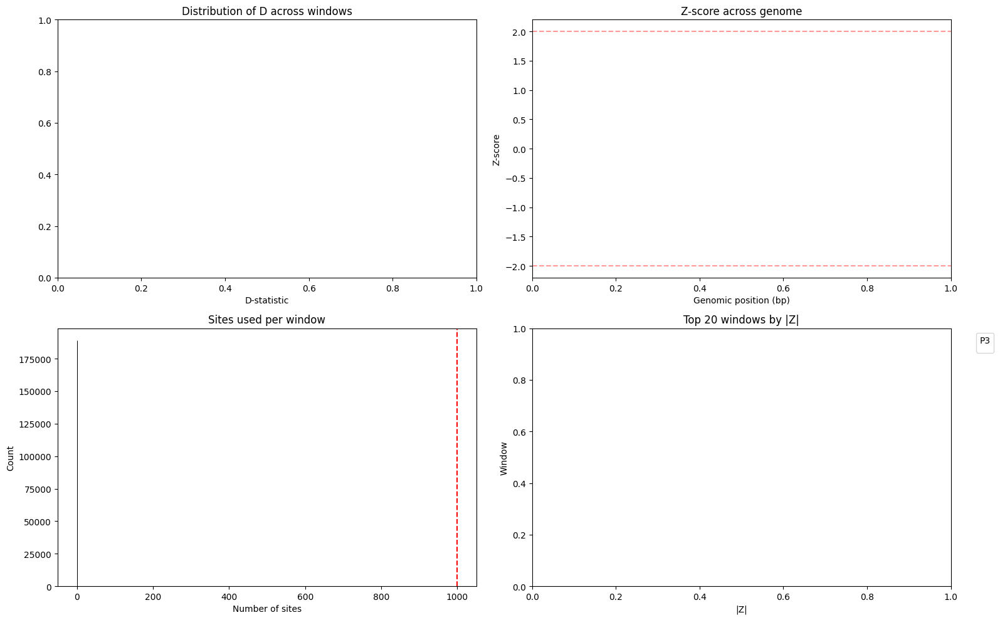

In [6]:
def summarize_sliding_results(sliding_df, z_threshold=2.0, min_sites=10):
    if sliding_df is None or sliding_df.empty:
        print("No sliding window results to summarize.")
        return None

    summary = {}
    summary['total_windows'] = len(sliding_df)
    summary['qc_passing'] = int(sliding_df['passes_qc'].sum())
    summary['mean_abs_D'] = sliding_df['abs_D'].mean()
    summary['max_abs_D'] = sliding_df['abs_D'].max()
    summary['mean_abs_Z'] = sliding_df['abs_Z'].mean()
    summary['max_abs_Z'] = sliding_df['abs_Z'].max()
    summary['mean_sites'] = sliding_df['sites_used'].mean()
    summary['median_sites'] = sliding_df['sites_used'].median()
    summary['z_threshold'] = z_threshold
    summary['min_sites'] = min_sites

    summary_df = pd.DataFrame([summary])
    display(summary_df)
    return summary_df

def plot_sliding_results(sliding_df, top_n=20):
    if sliding_df is None or sliding_df.empty:
        print("No data to plot.")
        return None

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    sns.histplot(sliding_df['D'].dropna(), bins=50, ax=axes[0], kde=True, color='steelblue')
    axes[0].set_title('Distribution of D across windows')
    axes[0].set_xlabel('D-statistic')

    sns.scatterplot(
        data=sliding_df.dropna(subset=['midpoint', 'Z']),
        x='midpoint',
        y='Z',
        hue='chrom',
        palette='tab20',
        legend=False,
        ax=axes[1]
    )
    axes[1].axhline(2, color='red', linestyle='--', alpha=0.4)
    axes[1].axhline(-2, color='red', linestyle='--', alpha=0.4)
    axes[1].set_title('Z-score across genome')
    axes[1].set_xlabel('Genomic position (bp)')
    axes[1].set_ylabel('Z-score')

    sns.histplot(sliding_df['sites_used'].dropna(), bins=50, ax=axes[2], color='darkgreen')
    axes[2].axvline(config.get('abba_baba', {}).get('min_sites', 10), color='red', linestyle='--')
    axes[2].set_title('Sites used per window')
    axes[2].set_xlabel('Number of sites')

    top_hits = (sliding_df.dropna(subset=['abs_Z'])
                .sort_values('abs_Z', ascending=False)
                .head(top_n))
    sns.barplot(
        data=top_hits,
        x='abs_Z',
        y=[f"{row['chrom']}:{row['start']}-{row['end']}" for _, row in top_hits.iterrows()],
        hue='P3',
        dodge=False,
        ax=axes[3]
    )
    axes[3].set_title(f'Top {top_n} windows by |Z|')
    axes[3].set_xlabel('|Z|')
    axes[3].set_ylabel('Window')
    axes[3].legend(title='P3', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    return fig

summary_df = None
if sliding_results_df is not None and not sliding_results_df.empty:
    summary_df = summarize_sliding_results(
        sliding_results_df,
        z_threshold=config.get('abba_baba', {}).get('z_threshold', 2.0),
        min_sites=config.get('abba_baba', {}).get('min_sites', 10)
    )
    plot_sliding_results(sliding_results_df)
else:
    print("Sliding window results unavailable. Run previous steps first.")

,total_windows,qc_passing,mean_abs_D,max_abs_D,mean_abs_Z,max_abs_Z,mean_sites,median_sites,z_threshold,min_sites
0,188898,0,NaN,NaN,NaN,NaN,0.0,0.0,2.0,1000


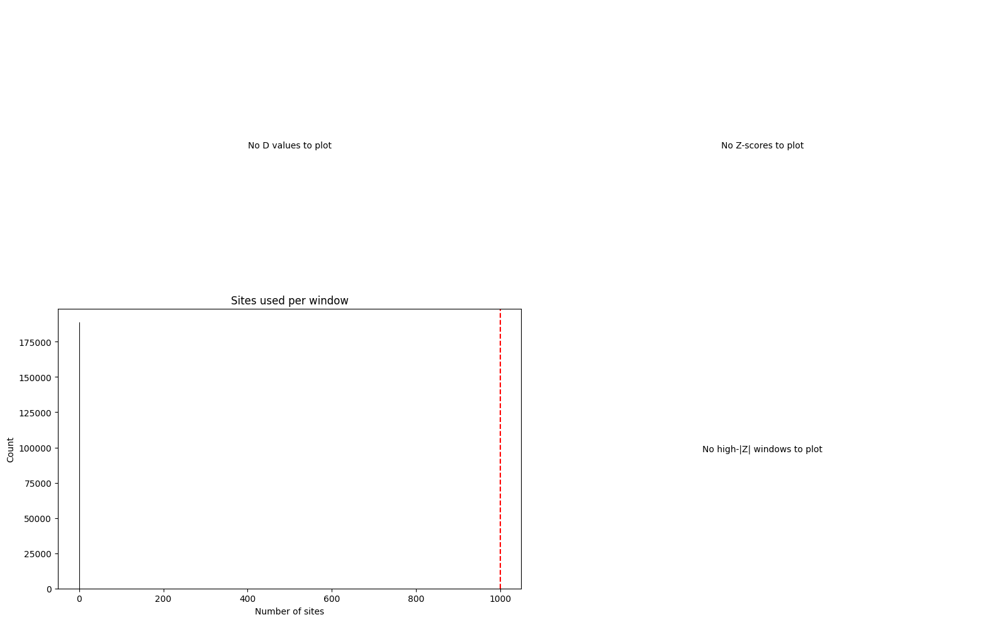

In [7]:
def summarize_sliding_results(sliding_df, z_threshold=2.0, min_sites=10):
    if sliding_df is None or sliding_df.empty:
        print("No sliding window results to summarize.")
        return None

    summary = {
        'total_windows': len(sliding_df),
        'qc_passing': int(sliding_df['passes_qc'].sum()),
        'mean_abs_D': sliding_df['abs_D'].mean(),
        'max_abs_D': sliding_df['abs_D'].max(),
        'mean_abs_Z': sliding_df['abs_Z'].mean(),
        'max_abs_Z': sliding_df['abs_Z'].max(),
        'mean_sites': sliding_df['sites_used'].mean(),
        'median_sites': sliding_df['sites_used'].median(),
        'z_threshold': z_threshold,
        'min_sites': min_sites,
    }
    summary_df = pd.DataFrame([summary])
    display(summary_df)
    return summary_df


def plot_sliding_results(sliding_df, top_n=20):
    if sliding_df is None or sliding_df.empty:
        print("No data to plot.")
        return None

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    d_vals = sliding_df['D'].dropna()
    if len(d_vals) > 0:
        sns.histplot(d_vals, bins=min(50, len(d_vals)), ax=axes[0], kde=True, color='steelblue')
        axes[0].set_title('Distribution of D across windows')
        axes[0].set_xlabel('D-statistic')
    else:
        axes[0].text(0.5, 0.5, 'No D values to plot', ha='center', va='center')
        axes[0].set_axis_off()

    scatter_df = sliding_df.dropna(subset=['midpoint', 'Z'])
    if not scatter_df.empty:
        hue_col = 'chrom' if 'chrom' in scatter_df.columns and scatter_df['chrom'].nunique() > 1 else None
        sns.scatterplot(
            data=scatter_df,
            x='midpoint',
            y='Z',
            hue=hue_col,
            palette='tab20' if hue_col else None,
            legend=bool(hue_col),
            ax=axes[1],
            color=None if hue_col else 'slateblue'
        )
        axes[1].axhline(2, color='red', linestyle='--', alpha=0.4)
        axes[1].axhline(-2, color='red', linestyle='--', alpha=0.4)
        axes[1].set_title('Z-score across genome')
        axes[1].set_xlabel('Genomic position (bp)')
        axes[1].set_ylabel('Z-score')
        if hue_col:
            axes[1].legend(title='Chromosome', bbox_to_anchor=(1.01, 1), loc='upper left')
    else:
        axes[1].text(0.5, 0.5, 'No Z-scores to plot', ha='center', va='center')
        axes[1].set_axis_off()

    sites_vals = sliding_df['sites_used'].dropna()
    if len(sites_vals) > 0:
        sns.histplot(sites_vals, bins=min(50, len(sites_vals)), ax=axes[2], color='darkgreen')
        axes[2].axvline(config.get('abba_baba', {}).get('min_sites', 10), color='red', linestyle='--')
        axes[2].set_title('Sites used per window')
        axes[2].set_xlabel('Number of sites')
    else:
        axes[2].text(0.5, 0.5, 'No site counts to plot', ha='center', va='center')
        axes[2].set_axis_off()

    top_hits = (sliding_df.dropna(subset=['abs_Z'])
                .sort_values('abs_Z', ascending=False)
                .head(top_n))
    if not top_hits.empty:
        sns.barplot(
            data=top_hits,
            x='abs_Z',
            y=[f"{row['chrom']}:{row['start']}-{row['end']}" for _, row in top_hits.iterrows()],
            hue='P3',
            dodge=False,
            ax=axes[3]
        )
        axes[3].set_title(f'Top {top_hits.shape[0]} windows by |Z|')
        axes[3].set_xlabel('|Z|')
        axes[3].set_ylabel('Window (chrom:start-end)')
        axes[3].legend(title='P3', bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axes[3].text(0.5, 0.5, 'No high-|Z| windows to plot', ha='center', va='center')
        axes[3].set_axis_off()

    plt.tight_layout()
    return fig


summary_df = None
if sliding_results_df is not None and not sliding_results_df.empty:
    summary_df = summarize_sliding_results(
        sliding_results_df,
        z_threshold=config.get('abba_baba', {}).get('z_threshold', 2.0),
        min_sites=config.get('abba_baba', {}).get('min_sites', 10)
    )
    plot_sliding_results(sliding_results_df)
else:
    print("Sliding window results unavailable. Run previous steps first.")

In [8]:
import pandas as pd
from pathlib import Path

path = Path("outputs/sliding_window_results.csv")
df = pd.read_csv(path)

print(f"Rows: {len(df)}")
display(df[["D", "Z", "sites_used", "ABBA", "BABA"]].describe(include="all"))

print("\nExample rows with data:")
display(df.dropna(subset=["D"]).head())

FileNotFoundError: [Errno 2] No such file or directory: 'outputs/sliding_window_results.csv'